# DM2425 - PROCESSING DATA NOTEBOOK

### GROUP 24
Carolina Pinto - 20240494 <br>
Francisco Pontes - 20211583 <br>
Iris Moreira - 20240659 <br>
Maria Margarida Cardoso - 20240493 <br>

 <div class="alert alert-block alert-success">

# Import: Libraries and Data
<div>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from os.path import join
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
import itertools

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

from scipy.stats import chi2_contingency

In [2]:
data = pd.read_csv(r'DM2425_ABCDEats_DATASET.csv')
data.head()

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
0,1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,...,0,0,0,0,2,0,0,0,0,0
1,5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,...,0,0,0,0,0,0,0,0,0,0
2,f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,...,0,0,0,0,0,0,0,0,0,0
3,180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,...,1,0,0,0,0,0,0,0,0,0
4,4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,...,0,0,0,0,0,0,0,0,0,0


 <div class="alert alert-block alert-success">

# PRE-PROCESSING

<div>

In [3]:
data_original = data.copy()

## REMOVING DUPLICATES:

In [4]:
data_original.duplicated().sum()

13

In [5]:
data_original.duplicated().sum()/len(data)

0.00040767686904164577

In [6]:
#data.drop_duplicates(inplace=True)
data_original.set_index('customer_id', inplace=True)
#data.head()

In [7]:
data_original.duplicated().sum()

60

In [8]:
data_original.duplicated().sum()/len(data)

0.0018815855494229805

In [9]:
all_duplicates = data_original[data_original.duplicated(keep=False)]
all_duplicates_sorted = all_duplicates.sort_values(by=list(data_original.columns))
all_duplicates_sorted

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,
837c49ea1b,2360,23.0,1,2,0,35.0,35,FREEBIE,DIGI,0.0,...,0,0,1,0,0,0,0,0,0,0
43d871453a,2360,23.0,1,2,0,35.0,35,FREEBIE,DIGI,0.0,...,0,0,1,0,0,0,0,0,0,0
1f616608ed,2360,23.0,1,2,1,87.0,87,DELIVERY,CARD,0.0,...,0,0,0,1,0,0,0,0,0,0
6020a9ce3d,2360,23.0,1,2,1,87.0,87,DELIVERY,CARD,0.0,...,0,0,0,1,0,0,0,0,0,0
412c8c0b2d,2360,24.0,1,2,0,0.0,11,DELIVERY,DIGI,0.0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b332d0d637,8670,37.0,3,3,3,10.0,82,-,DIGI,0.0,...,0,0,0,0,0,0,0,0,0,0
fd92130953,8670,38.0,9,31,9,7.0,89,-,CARD,0.0,...,0,0,0,0,0,0,0,0,0,0
d061dc5798,8670,38.0,9,31,9,7.0,89,-,CARD,0.0,...,0,0,0,0,0,0,0,0,0,0


There are 47 duplicated rows with different ids. We will drop them as they could mean that one person historic on the ABCDEats was duplicated for some reason. We draw this conclusion because it is very unlikely that different persons have the exact same consumption pattern, especially when it comes to monetary expenditure that takes ona very specific and continuous variable.

In [10]:
data_original.drop_duplicates(inplace=True)

## MISSING VALUES:

In [11]:
total_orders_dow = data_original.loc[:, 'DOW_0':'DOW_6'].sum(axis=1)

In [12]:
total_orders_hr = data_original.loc[:, 'HR_0':'HR_23'].sum(axis=1)

In [13]:
data_original[total_orders_dow != total_orders_hr]['HR_0'].isna().sum()

1164

There are 1164 missing values in HR_0 where the total orders from the days of the week are not equivalent to the total orders from the hours

In [14]:
data_original[total_orders_dow != total_orders_hr].shape

(1164, 55)

There are also exactly 1164 rows where total orders for the days of week are different than the total orders for the hours. Knowing this, we will input the HR_0 missing values with the difference from total orders from the day of week and the total orders from the hours

In [15]:
data_original.loc[data_original['HR_0'].isna(), 'HR_0'] = total_orders_dow - total_orders_hr

In [16]:
total_orders_hr = data_original.loc[:, 'HR_0':'HR_23'].sum(axis=1)

In [17]:
data_original[total_orders_dow != total_orders_hr]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,


As we can see, there are now no columns with unmatched total orders for the hours and days of week

In [18]:
data_original.loc[data_original['first_order'].isna(),'first_order'] = 0

As we could assess in the EDA, the rows with missing values in first_order are the same rows that have last_order equal to zero, so we will fill the missing values of first order with 0

In [19]:
data_original['customer_age'] = data_original['customer_age'].fillna(data_original['customer_age'].median())

Since we do not have any meaningful insights from customer age for the missing values, we will fill them with the median

In [20]:
#For now, replace '-' in customer_region with 8
data_original['customer_region'] = data_original['customer_region'].apply(lambda row: 8 if row=='-' else row) 

Based on the distribution of '-', we could assess that its behaviour is similar to customer regions that start with 8, so we will change it accordingly.

In [21]:
data_original['last_promo'] = data_original['last_promo'].apply(lambda row: 'NO PROMO' if row=='-' else row) 

We will assume that '-' is No Promo

In [22]:
data_original.isna().sum()

customer_region             0
customer_age                0
vendor_count                0
product_count               0
is_chain                    0
first_order                 0
last_order                  0
last_promo                  0
payment_method              0
CUI_American                0
CUI_Asian                   0
CUI_Beverages               0
CUI_Cafe                    0
CUI_Chicken Dishes          0
CUI_Chinese                 0
CUI_Desserts                0
CUI_Healthy                 0
CUI_Indian                  0
CUI_Italian                 0
CUI_Japanese                0
CUI_Noodle Dishes           0
CUI_OTHER                   0
CUI_Street Food / Snacks    0
CUI_Thai                    0
DOW_0                       0
DOW_1                       0
DOW_2                       0
DOW_3                       0
DOW_4                       0
DOW_5                       0
DOW_6                       0
HR_0                        0
HR_1                        0
HR_2      

## ANOMALIES: 

Drop the rows where product_count is less than the total number of orders. By dropping this inconsistency, we also drop the rows where product_count is equal to 0.

In [23]:
data_corrected=data_original.copy()
inconsistent_rows = data_corrected[data_corrected['product_count'] < total_orders_dow]

In [24]:
data_corrected = data_corrected.drop(index=inconsistent_rows.index)

In [25]:
print('Data kept after dropping anomalies', (data_corrected.shape[0]/data.shape[0])*100)

Data kept after dropping anomalies 99.75539387857502


In [26]:
inconsistent_rows2 = data_corrected[(data_corrected['product_count'] == 0) & (data_corrected['vendor_count'] == 0) & (total_orders_dow==0) & (data_corrected['first_order']!=0) & (data_corrected['last_order']!=0)]
inconsistent_rows2

C:\Users\Francisco Pontes\AppData\Local\Temp\ipykernel_21824\2209633147.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  inconsistent_rows2 = data_corrected[(data_corrected['product_count'] == 0) & (data_corrected['vendor_count'] == 0) & (total_orders_dow==0) & (data_corrected['first_order']!=0) & (data_corrected['last_order']!=0)]


,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,
4903041977,8670,22.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,...,0,0,0,0,0,0,0,0,0,0
c94b288475,8670,26.0,0,0,0,1.0,1,DELIVERY,CASH,0.0,...,0,0,0,0,0,0,0,0,0,0
f687717dc1,8670,21.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,...,0,0,0,0,0,0,0,0,0,0
c6cf0b76fb,8670,38.0,0,0,0,2.0,2,DELIVERY,CASH,0.0,...,0,0,0,0,0,0,0,0,0,0
1b7c34738e,8670,24.0,0,0,0,3.0,3,NO PROMO,CASH,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177ede2420,8670,30.0,0,0,1,86.0,86,NO PROMO,DIGI,0.0,...,0,0,0,0,0,0,0,0,0,0
0039059c9c,8670,22.0,0,0,1,88.0,88,DISCOUNT,CARD,0.0,...,0,0,0,0,0,0,0,0,0,0
0e60632fe2,8670,23.0,0,0,0,89.0,89,DISCOUNT,CARD,0.0,...,0,0,0,0,0,0,0,0,0,0


In [27]:
data_corrected.drop(index=inconsistent_rows2.index, inplace=True)

In [28]:
print('Data kept after dropping anomalies', (data_corrected.shape[0]/data_original.shape[0])*100)

Data kept after dropping anomalies 99.50986552720875


In [29]:
inconsistent_rows3 = data_corrected[data_corrected['is_chain']>data_corrected.loc[:, 'DOW_0':'DOW_6'].sum(axis=1)]

In [30]:
inconsistent_rows3

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,


The prior inconsistency on our data, that consisted in the number of orders of chain orders being higher than thre total number of orders, has been extinguished.

**Correction of is_chain metadata:** <br>
    *is_chain*: Number 
of orders the customer has placed from a chain restaurant.

In [31]:
print('Data kept after dropping anomalies and duplicates', (data_corrected.shape[0]/data.shape[0])*100)

Data kept after dropping anomalies and duplicates 99.32262920220772


## New features:

In [32]:
data2 = data_corrected.copy()

##### Creating features

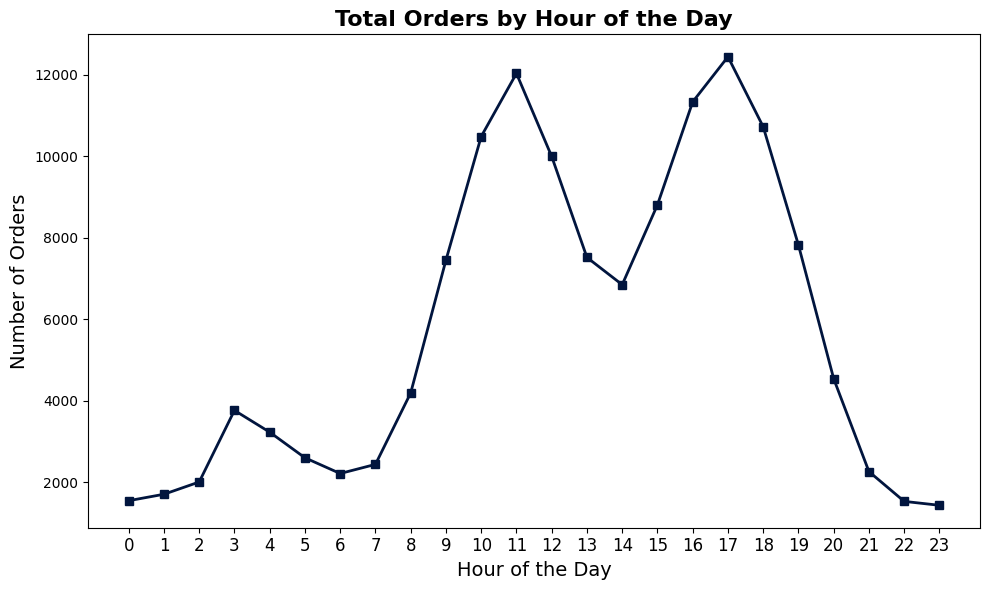

In [33]:
hr_columns = [col for col in data2.columns if col.startswith('HR_')]
orders_by_hour = data2[hr_columns].sum()
plt.figure(figsize=(10, 6))
plt.grid(False)
plt.plot(orders_by_hour, marker='s', color='#01153E', linestyle='-', linewidth=2)
plt.title('Total Orders by Hour of the Day', fontsize=16, fontweight='bold')
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Number of Orders', fontsize=14)
plt.xticks(ticks=range(24), labels=range(24), fontsize=12)
plt.tight_layout()
plt.show()


In [34]:
data2['late_night'] = data2[['HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4']].sum(axis=1)

data2['early_morning'] = data2[['HR_5', 'HR_6', 'HR_7', 'HR_8']].sum(axis=1)

data2['morning'] = data2[['HR_9', 'HR_10', 'HR_11', 'HR_12']].sum(axis=1)

data2['midday'] = data2[['HR_13', 'HR_14', 'HR_15']].sum(axis=1)

data2['afternoon_evening'] = data2[['HR_16', 'HR_17', 'HR_18', 'HR_19']].sum(axis=1)

data2['night'] = data2[['HR_20', 'HR_21', 'HR_22', 'HR_23']].sum(axis=1)

In [35]:
'''
data2['dawn'] = data2[['HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7']].sum(axis=1)

data2['morning'] = data2[['HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13']].sum(axis=1)

data2['afternoon'] = data2[['HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19']].sum(axis=1)

data2['night'] = data2[['HR_20', 'HR_21', 'HR_22', 'HR_23', 'HR_0', 'HR_1']].sum(axis=1)
'''

"\ndata2['dawn'] = data2[['HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7']].sum(axis=1)\n\ndata2['morning'] = data2[['HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13']].sum(axis=1)\n\ndata2['afternoon'] = data2[['HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19']].sum(axis=1)\n\ndata2['night'] = data2[['HR_20', 'HR_21', 'HR_22', 'HR_23', 'HR_0', 'HR_1']].sum(axis=1)\n"

In [36]:
time_columns=['late_night', 'early_morning', 'morning','midday','afternoon_evening', 'night']

In [37]:
days_of_week_columns = ['DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6']

In [38]:
data2['weekday'] = data2[['DOW_0', 'DOW_1', 'DOW_2','DOW_3', 'DOW_4']].sum(axis=1)

data2['weekend'] = data2[['DOW_5','DOW_6']].sum(axis=1)

In [39]:
week_columns = ['weekday', 'weekend']

In [40]:
data2['total_spending'] = data2[['CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai']].sum(axis=1)

In [41]:
data2['total_orders'] = (data2['weekday']+data2['weekend'])

In [42]:
data2['used_promo'] = data2['last_promo'].apply(lambda x: 0 if x=='NO PROMO' else 1)

In [43]:
data2['broader_region'] = data2['customer_region'].apply(lambda x: list(map(int, str(x)))[0])

In [44]:
data2['order_frequency'] = (data2['last_order'] - data2['first_order']) / (data2['total_orders'])

In [45]:
data2['order_span'] = data2['last_order'] - data2['first_order']

In [46]:
data2['avg_product_cost'] = (data2['total_spending'])/data2['product_count']

In [47]:
data2['avg_order_cost'] = data2['total_spending']/data2['total_orders']

In [48]:
data2['products_per_vendor'] = (data2['product_count'])/data2['vendor_count']

In [49]:
data2['cui_diversity_score'] = (data2[['CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai']].applymap(lambda x: 1 if x!=0 else 0).sum(axis=1))

In [50]:
data2['prefered_cuisine']= data2[['CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai']].idxmax(axis=1)

In [51]:
data2['dow_diversity_score'] = data2[[f'DOW_{i}' for i in range(7)]].gt(0).sum(axis=1)

In [52]:
data2['hr_diversity_score'] = data2[[f'HR_{i}' for i in range(24)]].gt(0).sum(axis=1)

In [53]:
new_num_features = ['late_night', 'early_morning', 'morning', 'midday','afternoon_evening', 'night', 'weekday', 'weekend', 'total_spending','total_orders', 'order_frequency', 'order_span', 'avg_product_cost', 'avg_order_cost', 'products_per_vendor', 'cui_diversity_score', 'dow_diversity_score', 'hr_diversity_score']
new_cat_features=['used_promo', 'broader_region', 'prefered_cuisine']

In [54]:
data2[new_cat_features]=data2[new_cat_features].astype(str) #turning the categorical features into objects

In [55]:
new_features=new_num_features+new_cat_features

In [56]:
numeric_features = data2.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = data2.select_dtypes(include=['object', 'category']).columns.tolist()

print("Numeric Features:", numeric_features)
print("Categorical Features:", categorical_features)

Numeric Features: ['customer_age', 'vendor_count', 'product_count', 'is_chain', 'first_order', 'last_order', 'CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy', 'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes', 'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23', 'late_night', 'early_morning', 'morning', 'midday', 'afternoon_evening', 'night', 'weekday', 'weekend', 'total_spending', 'total_orders', 'order_frequency', 'order_span', 'avg_product_cost', 'avg_order_cost', 'products_per_vendor', 'cui_diversity_score', 'dow_diversity_score', 'hr_diversity_score']
Categorical Features: ['customer_region', 'last_promo', 'payment_method', 'us

### Data Exploration for the new variables that were not featured in the Exploratory Data Analysis

In [57]:
features_to_explore = ['dow_diversity_score','hr_diversity_score','prefered_cuisine']

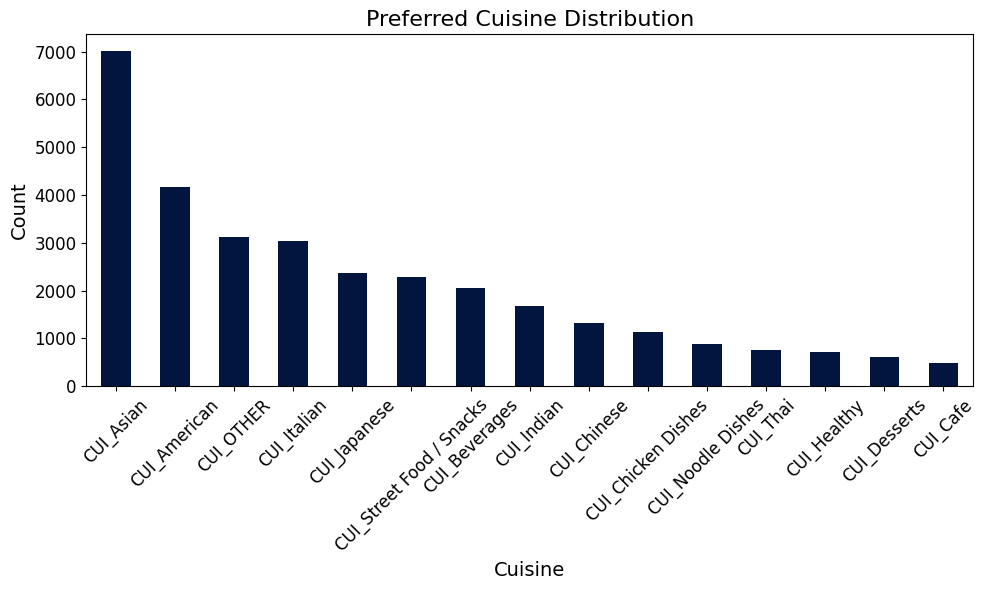

In [58]:
plt.figure(figsize=(10, 6))

cuisine_counts = data2['prefered_cuisine'].value_counts()


cuisine_counts.plot(kind='bar', color='#01153E')

# Customize the chart
plt.title('Preferred Cuisine Distribution', fontsize=16)
plt.xlabel('Cuisine', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()

As expected, the prefered cuisine is the Asian for most clients. The distribution of this chart is similar to the spending per cuisine of all customers, which leads us to the conclusion that the asian cuisine is the favorite for a lot of customers, and not only some who could potentially be spending more of only the asian cuisine.

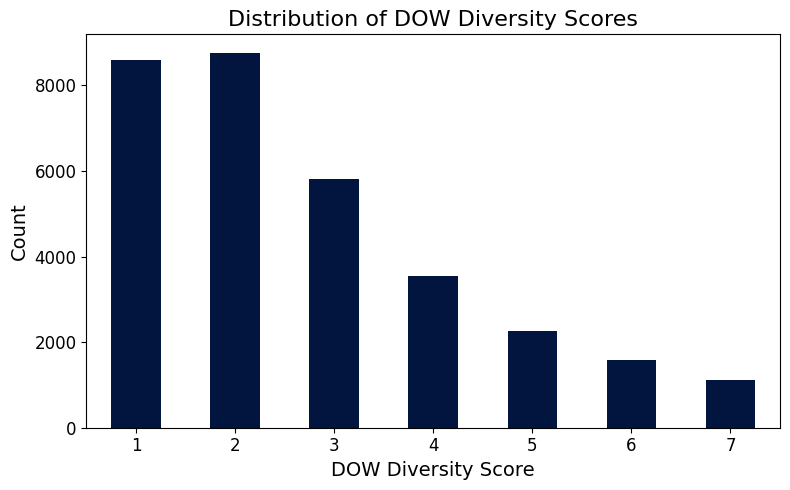

In [59]:
dow_counts = data2['dow_diversity_score'].value_counts()

# Create the bar chart
plt.figure(figsize=(8, 5))
dow_counts.sort_index().plot(kind='bar', color='#01153E')  # Sort by index to display in order

# Add labels and title
plt.title('Distribution of DOW Diversity Scores', fontsize=16)
plt.xlabel('DOW Diversity Score', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=0, fontsize=12)
plt.yticks(fontsize=12)

# Show the chart
plt.tight_layout()
plt.show()

Most customers only order on specific days of the week. This conclusion is probably related to the fact that there are a lot of customers of the database that have placed very few orders. However, we can still highlight a fair ammount of customers who have placed at least an order on most days pf the week.

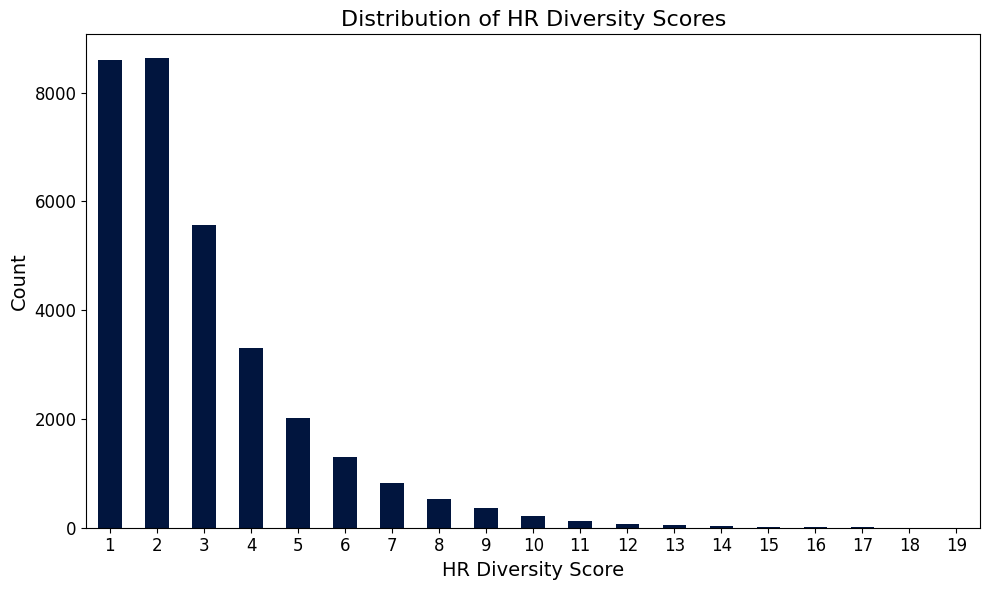

In [60]:
hr_counts = data2['hr_diversity_score'].value_counts()

# Create the bar chart
plt.figure(figsize=(10, 6))
hr_counts.sort_index().plot(kind='bar', color='#01153E')  # Sort by index to display in order

# Add labels and title
plt.title('Distribution of HR Diversity Scores', fontsize=16)
plt.xlabel('HR Diversity Score', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=0, fontsize=12)
plt.yticks(fontsize=12)

# Show the chart
plt.tight_layout()
plt.show()

Simmilarly to the dow diversity score, most customers only order on specific hours of the day. This conclusion is also probably related to the fact that there are a lot of customers of the database that have placed very few orders. 

In [61]:
data2[new_num_features].describe().T

,count,mean,std,min,25%,50%,75%,max
late_night,31672.0,0.387566,1.115643,0.00,0.000000,0.00000,0.000000,24.00
early_morning,31672.0,0.361960,1.068026,0.00,0.000000,0.00000,0.000000,66.00
morning,31672.0,1.262472,2.238242,0.00,0.000000,1.00000,2.000000,49.00
midday,31672.0,0.732129,1.407941,0.00,0.000000,0.00000,1.000000,37.00
afternoon_evening,31672.0,1.336827,2.337685,0.00,0.000000,1.00000,2.000000,49.00
night,31672.0,0.308916,0.990013,0.00,0.000000,0.00000,0.000000,43.00
weekday,31672.0,3.026238,3.859435,0.00,1.000000,2.00000,4.000000,75.00
weekend,31672.0,1.363633,1.877135,0.00,0.000000,1.00000,2.000000,29.00
total_spending,31672.0,38.478948,46.446450,0.37,13.030000,24.20000,45.265000,1418.33
total_orders,31672.0,4.389871,5.088624,1.00,2.000000,3.00000,5.000000,94.00


In [62]:
data2[new_cat_features].describe().T

,count,unique,top,freq
used_promo,31672,2,0,16667
broader_region,31672,3,2,10741
prefered_cuisine,31672,15,CUI_Asian,7009


Correlation matrix of all numeric features except for cuisines.

In [63]:
hr_features = [col for col in data2.columns if col.startswith('HR')]
cui_features = [col for col in data2.columns if col.startswith('CUI')]
dow_features = [col for col in data2.columns if col.startswith('DOW')]

In [64]:
# Combine the features to exclude
excluded_features = set(hr_features + cui_features + dow_features)

# Filter numeric features to exclude HR and CUI features
filtered_numeric_features = [col for col in numeric_features if col not in excluded_features]

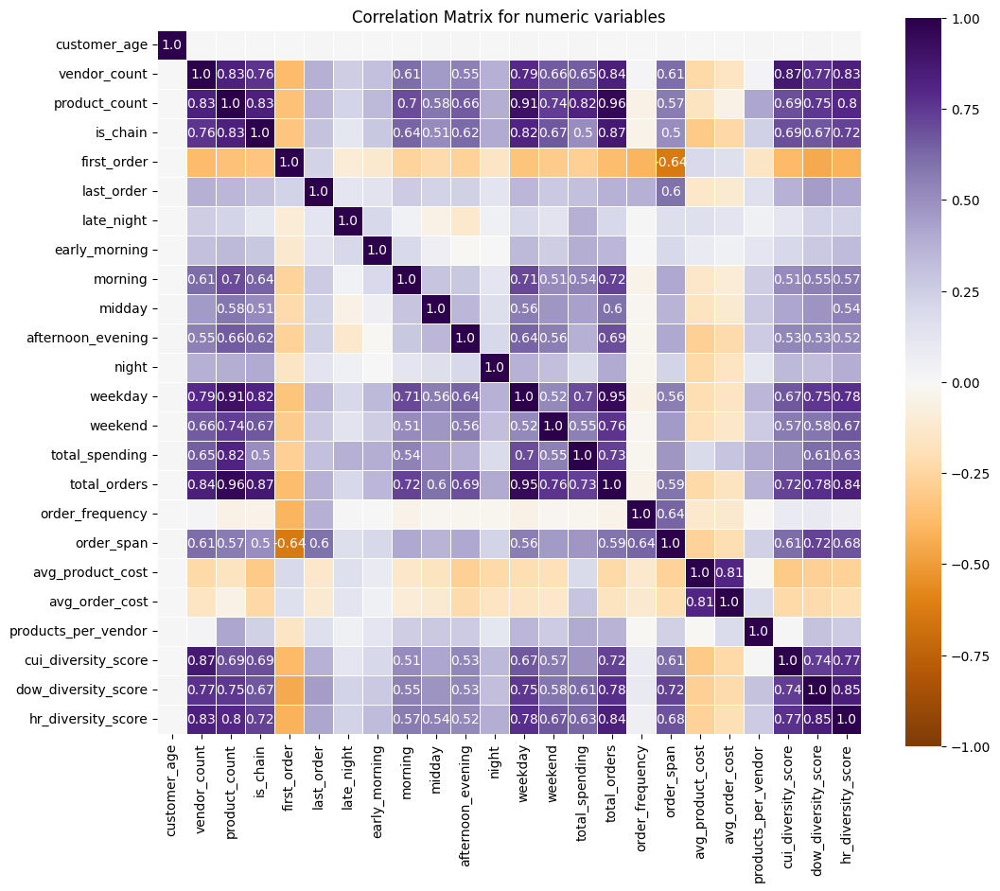

In [65]:
corr = data2[filtered_numeric_features].corr(method="pearson").round(2)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))

plt.figure(figsize=(12, 10))

sns.heatmap(data=corr, annot=annot,  cmap='PuOr',  fmt='s',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=.5)
plt.title('Correlation Matrix for numeric variables')
plt.show()
#new_num_features

In [66]:
data_before_outlier_treatment = data2.copy()

## FEATURES TREATMENT - Outlier Treatment

In [67]:
data_corrected_outliers=data2.copy()

In [68]:
data_corrected_outliers.columns

Index(['customer_region', 'customer_age', 'vendor_count', 'product_count',
       'is_chain', 'first_order', 'last_order', 'last_promo', 'payment_method',
       'CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1',
       'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2',
       'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10',
       'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18',
       'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23', 'late_night',
       'early_morning', 'morning', 'midday', 'afternoon_evening', 'night',
       'weekday', 'weekend', 'total_spending', 'total_orders', 'used_promo',
       'broader_region', 'order_frequency', 'order_span', 'avg_product_cost',
       'avg_order_cost', 'produ

In [69]:
features_to_treat_num = ['vendor_count', 'product_count','is_chain', 'late_night', 'early_morning', 'morning', 'midday','afternoon_evening',
       'night', 'DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6','total_spending', 'total_orders', 'order_span', 'order_frequency','avg_product_cost', 'avg_order_cost', 'products_per_vendor','cui_diversity_score']


In [70]:
numeric_features

['customer_age',
 'vendor_count',
 'product_count',
 'is_chain',
 'first_order',
 'last_order',
 'CUI_American',
 'CUI_Asian',
 'CUI_Beverages',
 'CUI_Cafe',
 'CUI_Chicken Dishes',
 'CUI_Chinese',
 'CUI_Desserts',
 'CUI_Healthy',
 'CUI_Indian',
 'CUI_Italian',
 'CUI_Japanese',
 'CUI_Noodle Dishes',
 'CUI_OTHER',
 'CUI_Street Food / Snacks',
 'CUI_Thai',
 'DOW_0',
 'DOW_1',
 'DOW_2',
 'DOW_3',
 'DOW_4',
 'DOW_5',
 'DOW_6',
 'HR_0',
 'HR_1',
 'HR_2',
 'HR_3',
 'HR_4',
 'HR_5',
 'HR_6',
 'HR_7',
 'HR_8',
 'HR_9',
 'HR_10',
 'HR_11',
 'HR_12',
 'HR_13',
 'HR_14',
 'HR_15',
 'HR_16',
 'HR_17',
 'HR_18',
 'HR_19',
 'HR_20',
 'HR_21',
 'HR_22',
 'HR_23',
 'late_night',
 'early_morning',
 'morning',
 'midday',
 'afternoon_evening',
 'night',
 'weekday',
 'weekend',
 'total_spending',
 'total_orders',
 'order_frequency',
 'order_span',
 'avg_product_cost',
 'avg_order_cost',
 'products_per_vendor',
 'cui_diversity_score',
 'dow_diversity_score',
 'hr_diversity_score']

#### Boxplots

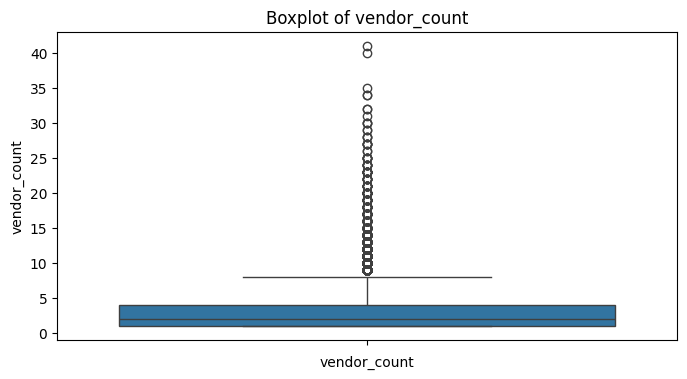

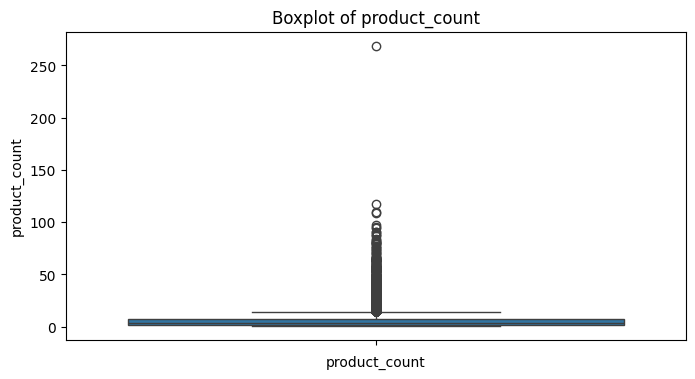

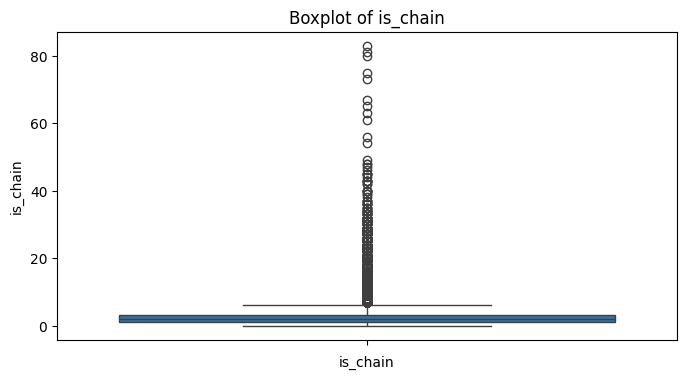

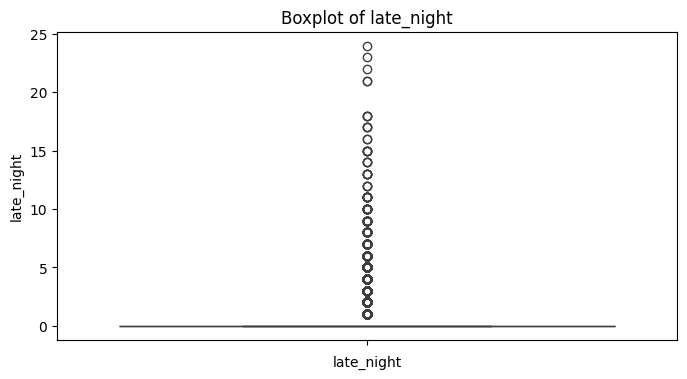

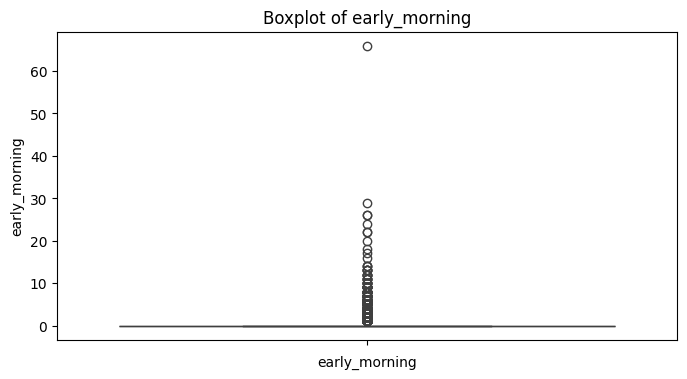

...

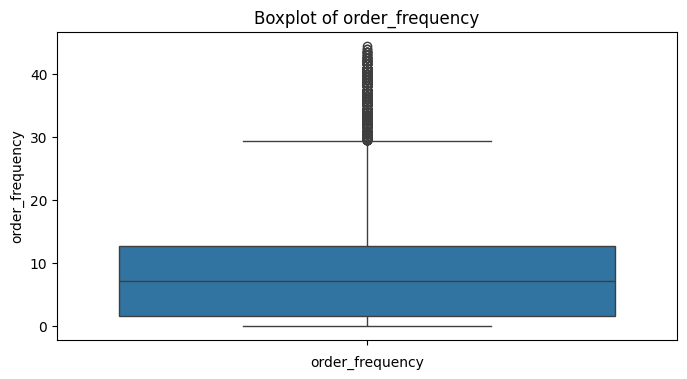

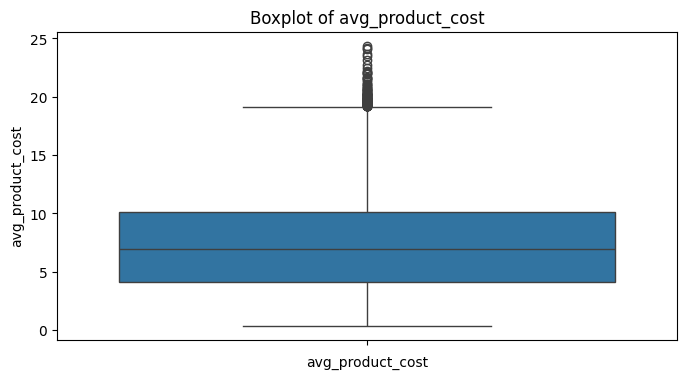

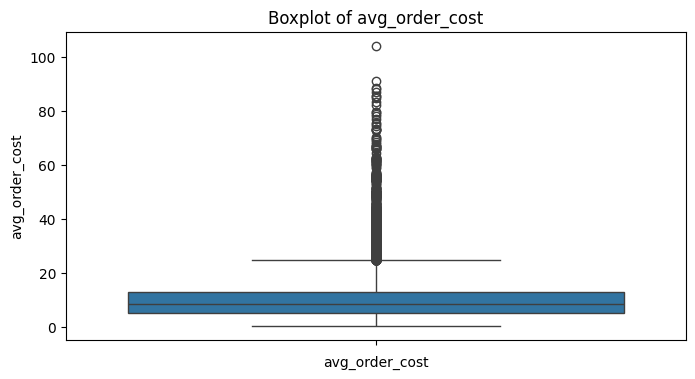

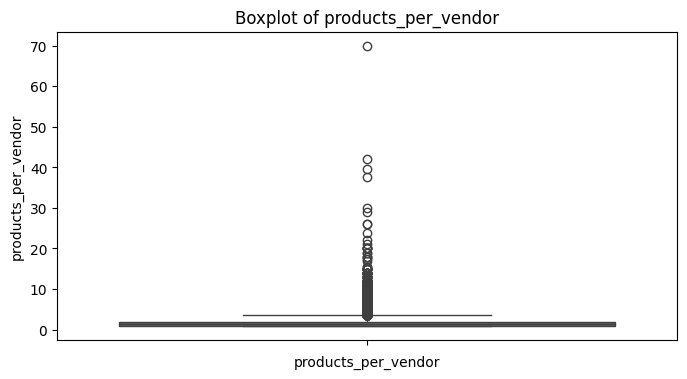

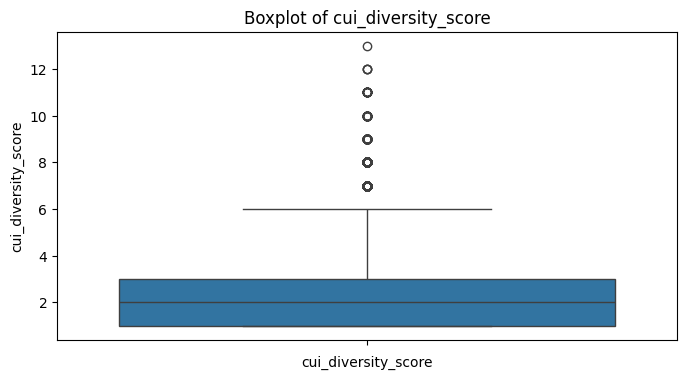

In [71]:
for feature in features_to_treat_num :
    plt.figure(figsize=(8, 4))
    sns.boxplot(data=data_corrected_outliers[feature])
    plt.title(f'Boxplot of {feature}')
    plt.xlabel(feature)

    plt.show()

#### Manual filter

In [72]:
data2[data2['vendor_count']>33]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
89b7866691,2360,20.0,41,110,73,0.0,88,DELIVERY,DIGI,33.25,...,2,1.073171,88.0,3.297909,4.424024,2.682927,13,CUI_OTHER,7,17
92ced2dcb9,2360,23.0,40,269,81,0.0,88,NO PROMO,CARD,19.08,...,2,0.936170,88.0,5.272602,15.088617,6.725000,11,CUI_Chinese,7,15
9870fd931f,2360,25.0,34,97,45,1.0,86,NO PROMO,CARD,25.42,...,2,1.416667,85.0,4.043505,6.537000,2.852941,11,CUI_OTHER,7,14
4b4f32ffc1,2360,28.0,35,66,43,3.0,87,DISCOUNT,CARD,30.47,...,2,1.714286,84.0,3.369848,4.538980,1.885714,12,CUI_OTHER,7,13
0ff44f1053,2360,29.0,34,80,40,20.0,89,NO PROMO,CARD,10.84,...,2,1.112903,69.0,3.285250,4.239032,2.352941,8,CUI_Japanese,7,15


In [73]:
data2[data2['is_chain']>50]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
6f7904b7dd,2360,26.0,25,84,65,0.0,87,NO PROMO,DIGI,8.51,...,2,1.260870,87.0,3.212619,3.911014,3.360000,9,CUI_Cafe,7,14
89b7866691,2360,20.0,41,110,73,0.0,88,DELIVERY,DIGI,33.25,...,2,1.073171,88.0,3.297909,4.424024,2.682927,13,CUI_OTHER,7,17
92ced2dcb9,2360,23.0,40,269,81,0.0,88,NO PROMO,CARD,19.08,...,2,0.936170,88.0,5.272602,15.088617,6.725000,11,CUI_Chinese,7,15
bbecc39e1d,2360,34.0,19,75,56,0.0,88,NO PROMO,CARD,4.82,...,2,1.419355,88.0,3.144133,3.803387,3.947368,9,CUI_Chicken Dishes,7,17
afa0349ef0,2360,21.0,14,91,67,0.0,89,NO PROMO,CARD,4.01,...,2,1.271429,89.0,2.882527,3.747286,6.500000,7,CUI_Beverages,6,11
c0ece6fdda,2360,26.0,17,67,61,0.0,89,NO PROMO,CARD,77.48,...,2,1.459016,89.0,2.736866,3.006066,3.941176,8,CUI_American,7,15
d798652ec0,2360,28.0,27,109,83,1.0,89,NO PROMO,CARD,2.57,...,2,0.967033,88.0,3.982936,4.770769,4.037037,11,CUI_Beverages,7,14
e1491fb8f7,2360,17.0,2,75,75,2.0,89,FREEBIE,CARD,0.00,...,2,1.160000,87.0,2.364533,2.364533,37.500000,2,CUI_Beverages,7,7
b89cec0a1c,2360,23.0,17,89,63,3.0,89,NO PROMO,CASH,17.12,...,2,1.246377,86.0,3.221011,4.154638,5.235294,7,CUI_OTHER,7,17


In [74]:
data2[data2['total_spending']>800]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
249ba584d3,4660,34.0,4,95,8,0.0,71,NO PROMO,CARD,0.00,...,4,1.314815,71.0,9.556421,16.812222,23.750,3,CUI_Asian,7,8
92ced2dcb9,2360,23.0,40,269,81,0.0,88,NO PROMO,CARD,19.08,...,2,0.936170,88.0,5.272602,15.088617,6.725,11,CUI_Chinese,7,15


In [75]:
data2[data2['total_orders']>85]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
910e70571d,4660,41.0,18,117,26,0.0,88,NO PROMO,CARD,104.95,...,4,0.977778,88.0,5.028718,6.537333,6.500000,8,CUI_OTHER,7,11
92ced2dcb9,2360,23.0,40,269,81,0.0,88,NO PROMO,CARD,19.08,...,2,0.936170,88.0,5.272602,15.088617,6.725000,11,CUI_Chinese,7,15
d798652ec0,2360,28.0,27,109,83,1.0,89,NO PROMO,CARD,2.57,...,2,0.967033,88.0,3.982936,4.770769,4.037037,11,CUI_Beverages,7,14


In [76]:
data2[data2['avg_order_cost']>100]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
496e781eb6,8670,25.0,1,6,0,28.0,28,NO PROMO,CARD,0.0,...,8,0.0,0.0,17.386667,104.32,6.0,1,CUI_Street Food / Snacks,1,1


In [77]:
data2[data2['total_spending']>1400]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
92ced2dcb9,2360,23.0,40,269,81,0.0,88,NO PROMO,CARD,19.08,...,2,0.93617,88.0,5.272602,15.088617,6.725,11,CUI_Chinese,7,15


In [78]:
data2[data2['CUI_American']>250]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
4f75dc005b,4660,26.0,3,42,31,2.0,89,NO PROMO,CARD,280.21,...,4,2.71875,87.0,6.967619,9.145,14.0,2,CUI_American,7,7


In [79]:
data2[data2['CUI_Asian']>500]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
249ba584d3,4660,34.0,4,95,8,0.0,71,NO PROMO,CARD,0.00,...,4,1.314815,71.0,9.556421,16.812222,23.750000,3,CUI_Asian,7,8
5460ff45d1,8670,38.0,9,57,31,0.0,89,NO PROMO,CARD,17.61,...,8,2.405405,89.0,10.908596,16.805135,6.333333,3,CUI_Asian,7,8


In [80]:
data2[data2['CUI_Desserts']>200]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
f5ec97b25b,8670,21.0,13,38,7,3.0,87,NO PROMO,CASH,0.00,...,8,3.360000,84.0,10.163947,15.449200,2.923077,4,CUI_Desserts,7,10
db06018196,8670,21.0,6,27,4,26.0,89,NO PROMO,CARD,6.63,...,8,3.705882,63.0,10.593704,16.825294,4.500000,6,CUI_Desserts,7,8


In [81]:
data2[data2['CUI_Healthy']>200]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
114ca085bb,2360,25.0,18,79,30,0.0,86,DELIVERY,CARD,0.0,...,2,1.829787,86.0,4.916329,8.263617,4.388889,9,CUI_Healthy,7,10
536ed716e6,4660,25.0,7,40,11,1.0,87,NO PROMO,CARD,0.0,...,4,4.526316,86.0,9.130750,19.222632,5.714286,5,CUI_Healthy,4,3
b20ed61cac,8670,23.0,6,20,2,6.0,79,NO PROMO,DIGI,0.0,...,8,6.636364,73.0,11.901000,21.638182,3.333333,1,CUI_Healthy,5,6


In [82]:
data2[data2['CUI_Indian']>200]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
09bd6cb0d5,2360,22.0,13,65,24,0.0,85,NO PROMO,CARD,1.83,...,2,1.465517,85.0,3.956923,4.434483,5.0,5,CUI_Indian,7,7
41d96425c6,2360,22.0,5,87,36,1.0,88,NO PROMO,DIGI,0.00,...,2,1.641509,87.0,3.646322,5.985472,17.4,2,CUI_Indian,7,9


In [83]:
data2[data2['CUI_Italian']>300]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
bdf21b06cc,4660,27.0,1,42,0,4.0,88,NO PROMO,CARD,0.0,...,4,3.360000,84.0,8.228810,13.824400,42.0,1,CUI_Italian,6,5
dcd665d317,4140,29.0,1,70,0,28.0,88,DISCOUNT,DIGI,0.0,...,4,2.222222,60.0,6.690429,17.345556,70.0,1,CUI_Italian,7,11


In [84]:
data2[data2['CUI_Japanese']>300]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
8d65421423,4660,29.0,7,65,16,5.0,87,NO PROMO,CARD,0.0,...,4,2.645161,82.0,11.752615,24.642581,9.285714,4,CUI_Japanese,7,8


In [85]:
data2[data2['CUI_Noodle Dishes']>250]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
6e0131afeb,2360,25.0,14,81,33,0.0,89,NO PROMO,CARD,27.88,...,2,2.405405,89.0,4.794074,10.495135,5.785714,7,CUI_Noodle Dishes,7,10


In [86]:
data2[data2['CUI_OTHER']>350]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
dcb8ec929c,4660,26.0,10,68,43,7.0,89,NO PROMO,DIGI,10.56,...,4,1.54717,82.0,8.924118,11.449811,6.8,5,CUI_OTHER,7,10


In [87]:
filters_man = (
    (data_corrected_outliers['vendor_count'] < 32)
    & (data_corrected_outliers['product_count'] < 100)
    & (data_corrected_outliers['is_chain'] < 50)
    & (data_corrected_outliers['late_night'] < 18)
    & (data_corrected_outliers['early_morning'] < 16)
    & (data_corrected_outliers['morning'] < 35)
    & (data_corrected_outliers['midday'] < 30)
    & (data_corrected_outliers['afternoon_evening'] < 30)
    & (data_corrected_outliers['night'] < 32)
    & (data_corrected_outliers['DOW_0'] < 13)
    & (data_corrected_outliers['DOW_1'] < 13)
    & (data_corrected_outliers['DOW_3'] < 15)
    & (data_corrected_outliers['DOW_5'] < 17)
    & (data_corrected_outliers['DOW_6'] < 15)
    & (data_corrected_outliers['total_spending'] < 450)
    & (data_corrected_outliers['total_orders'] < 60)
    & (data_corrected_outliers['avg_order_cost'] < 100)
    & (data_corrected_outliers['products_per_vendor'] < 20)
)

In [88]:
filters_man2 = (
    (data_corrected_outliers['vendor_count'] < 32)
    & (data_corrected_outliers['product_count'] < 65)
    & (data_corrected_outliers['is_chain'] < 40)
    & (data_corrected_outliers['late_night'] < 18)
    & (data_corrected_outliers['early_morning'] < 16)
    & (data_corrected_outliers['morning'] < 26)
    & (data_corrected_outliers['midday'] < 24)
    & (data_corrected_outliers['afternoon_evening'] < 30)
    & (data_corrected_outliers['night'] < 15)
    & (data_corrected_outliers['DOW_0'] < 13)
    & (data_corrected_outliers['DOW_1'] < 13)
    & (data_corrected_outliers['DOW_2'] < 13)
    & (data_corrected_outliers['DOW_3'] < 15)
    & (data_corrected_outliers['DOW_4'] < 11)
    & (data_corrected_outliers['DOW_5'] < 17)
    & (data_corrected_outliers['DOW_6'] < 15)
    & (data_corrected_outliers['total_spending'] < 450)
    & (data_corrected_outliers['total_orders'] < 45)
    & (data_corrected_outliers['avg_order_cost'] < 100)
    & (data_corrected_outliers['products_per_vendor'] < 14)
)

In [89]:
valid_rows = data_corrected_outliers[filters_man]

# Get the indices of the outliers (rows that do NOT satisfy the filter)
manual_outlier_indices = data_corrected_outliers.index.difference(valid_rows.index)

# Print or analyze the indices
print(f"Number of manual outliers detected: {len(manual_outlier_indices)}")

Number of manual outliers detected: 80


In [90]:
valid_rows2 = data_corrected_outliers[filters_man2]

# Get the indices of the outliers (rows that do NOT satisfy the filter)
manual_outlier_indices2 = data_corrected_outliers.index.difference(valid_rows2.index)

# Print or analyze the indices
print(f"Number of manual outliers detected: {len(manual_outlier_indices2)}")

Number of manual outliers detected: 139


In [91]:
# Create a new DataFrame with only the valid rows
data_manual= data_corrected_outliers.loc[valid_rows.index].copy()

In [92]:
data_manual2= data_corrected_outliers.loc[valid_rows2.index].copy()

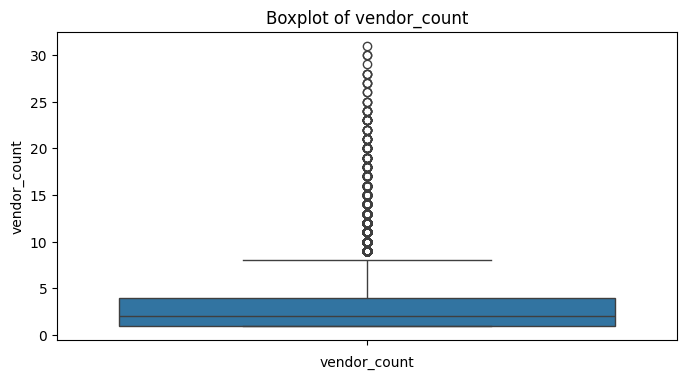

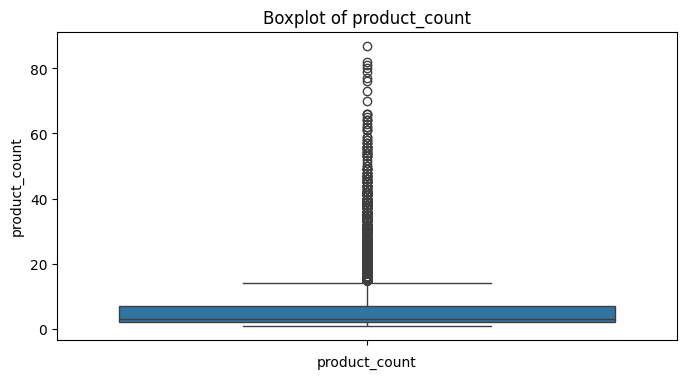

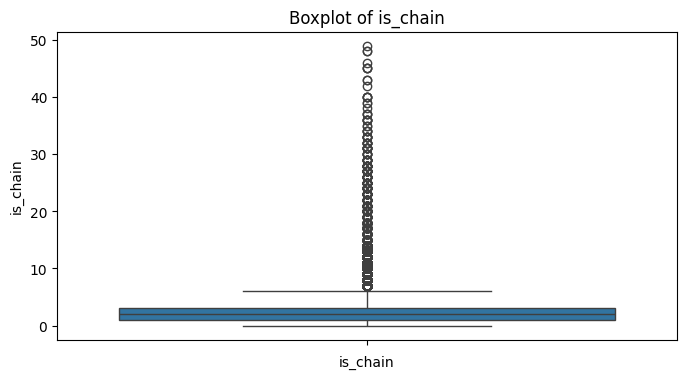

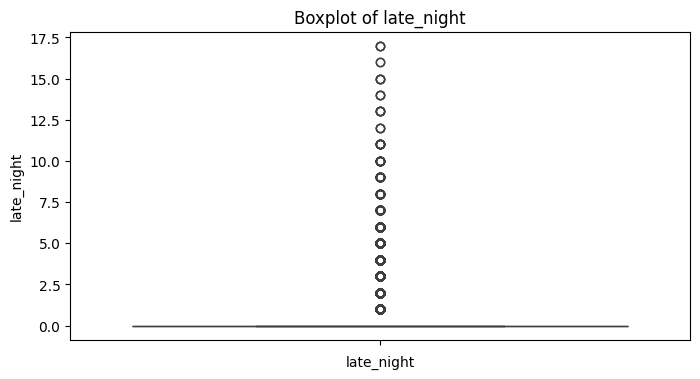

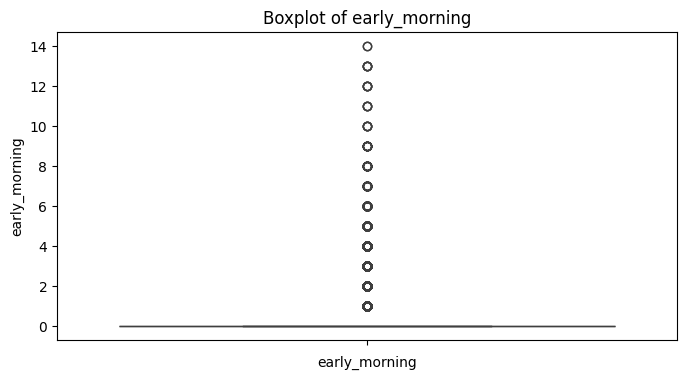

...

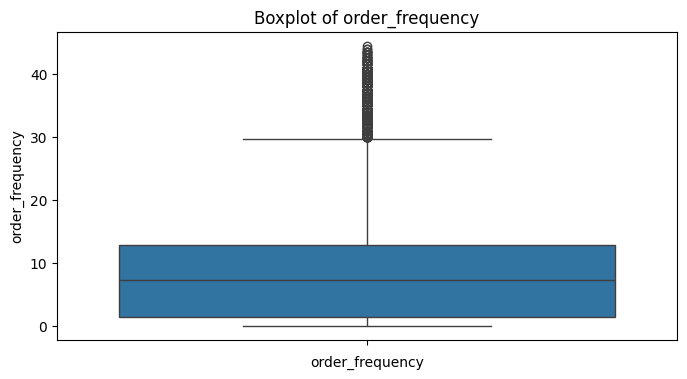

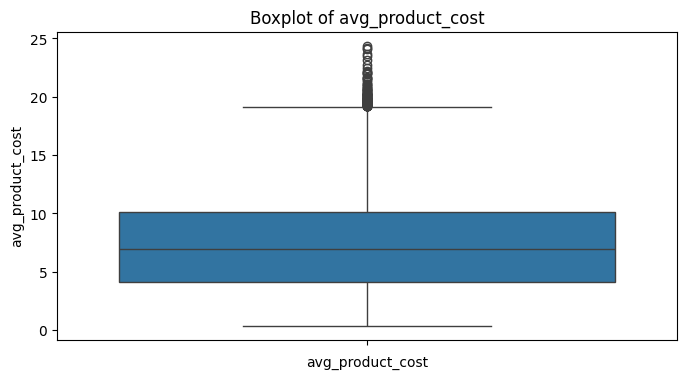

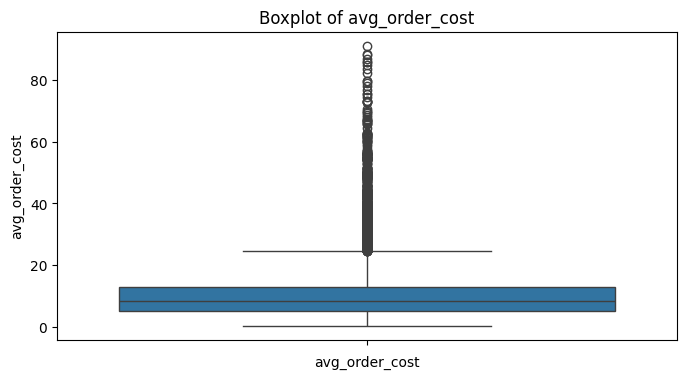

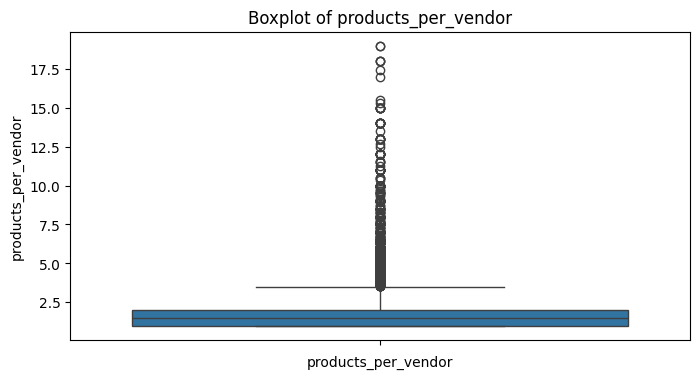

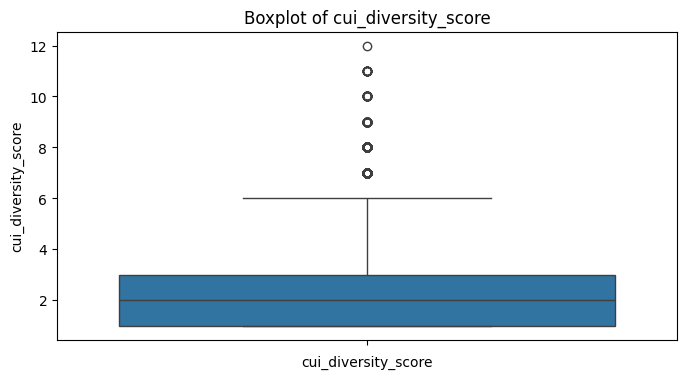

In [93]:
for feature in features_to_treat_num :
    plt.figure(figsize=(8, 4))  # Create a new figure for each plot
    sns.boxplot(data=data_manual[feature])
    plt.title(f'Boxplot of {feature}')
    plt.xlabel(feature)

    plt.show()

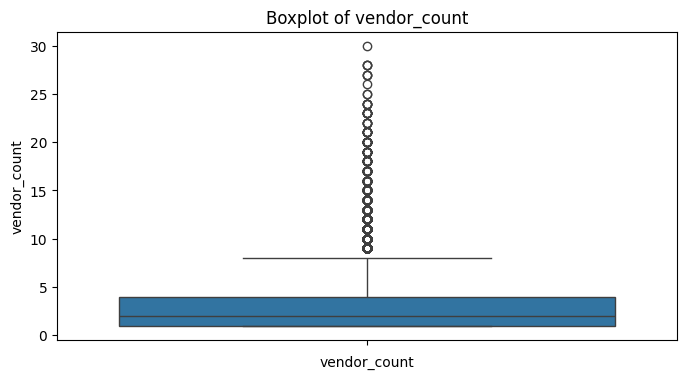

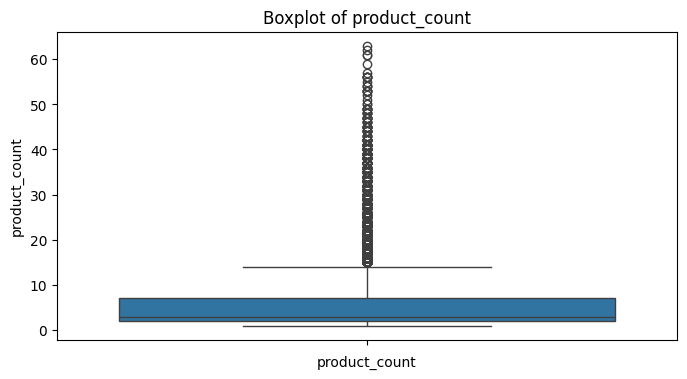

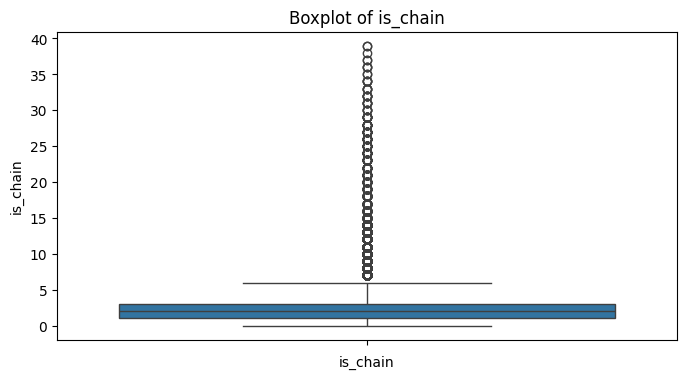

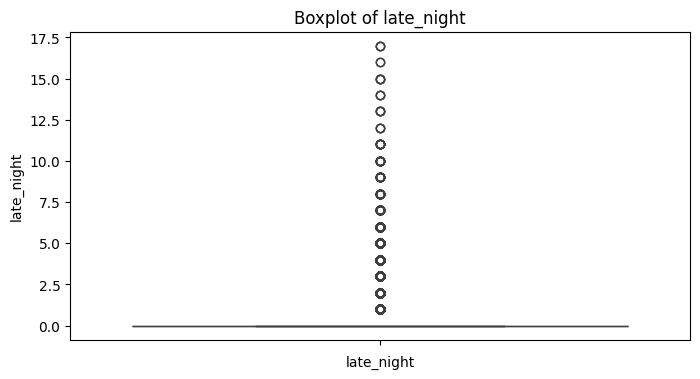

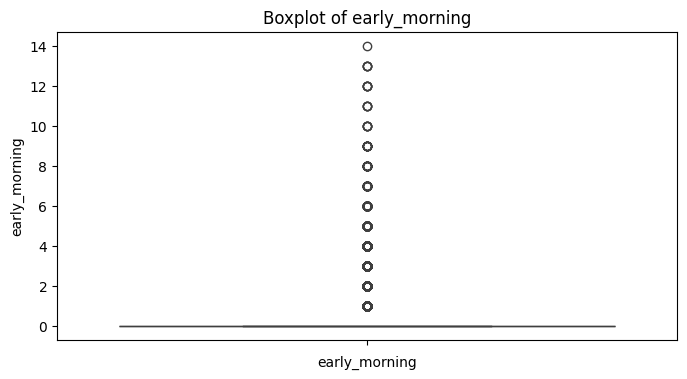

...

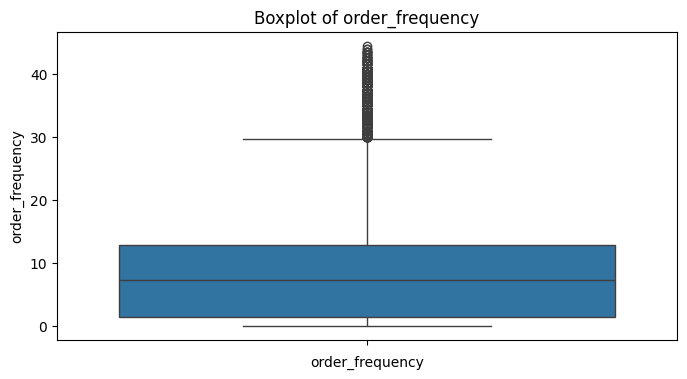

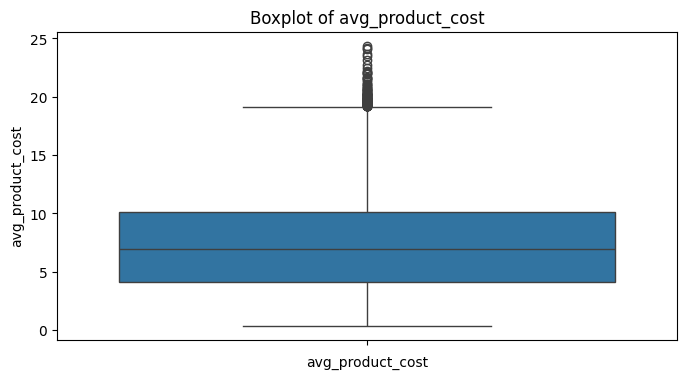

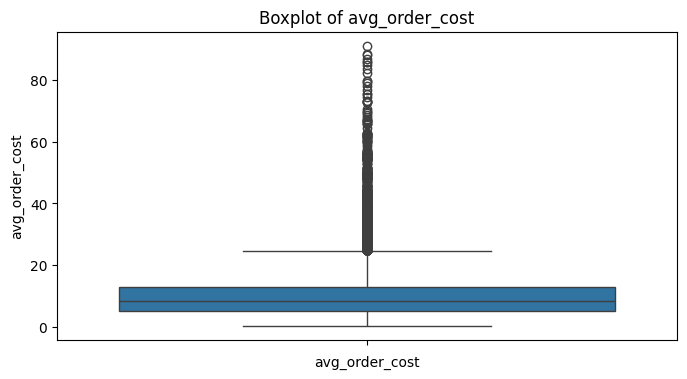

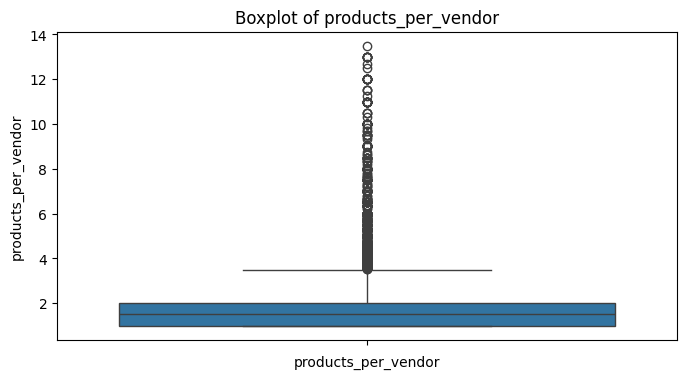

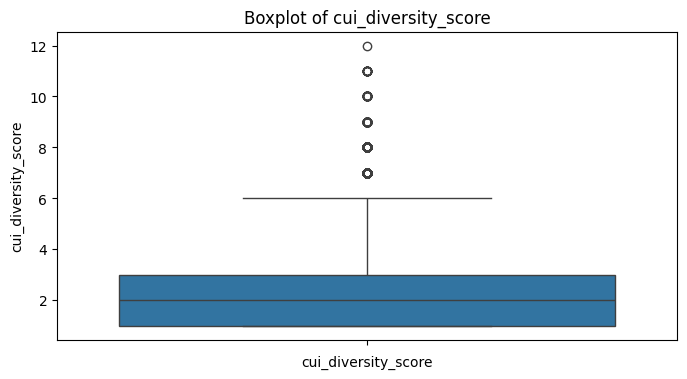

In [94]:
for feature in features_to_treat_num :
    plt.figure(figsize=(8, 4))  # Create a new figure for each plot
    sns.boxplot(data=data_manual2[feature])
    plt.title(f'Boxplot of {feature}')
    plt.xlabel(feature)

    plt.show()

#### Scaling to perform DBSCAN

In [95]:
numeric_features

['customer_age',
 'vendor_count',
 'product_count',
 'is_chain',
 'first_order',
 'last_order',
 'CUI_American',
 'CUI_Asian',
 'CUI_Beverages',
 'CUI_Cafe',
 'CUI_Chicken Dishes',
 'CUI_Chinese',
 'CUI_Desserts',
 'CUI_Healthy',
 'CUI_Indian',
 'CUI_Italian',
 'CUI_Japanese',
 'CUI_Noodle Dishes',
 'CUI_OTHER',
 'CUI_Street Food / Snacks',
 'CUI_Thai',
 'DOW_0',
 'DOW_1',
 'DOW_2',
 'DOW_3',
 'DOW_4',
 'DOW_5',
 'DOW_6',
 'HR_0',
 'HR_1',
 'HR_2',
 'HR_3',
 'HR_4',
 'HR_5',
 'HR_6',
 'HR_7',
 'HR_8',
 'HR_9',
 'HR_10',
 'HR_11',
 'HR_12',
 'HR_13',
 'HR_14',
 'HR_15',
 'HR_16',
 'HR_17',
 'HR_18',
 'HR_19',
 'HR_20',
 'HR_21',
 'HR_22',
 'HR_23',
 'late_night',
 'early_morning',
 'morning',
 'midday',
 'afternoon_evening',
 'night',
 'weekday',
 'weekend',
 'total_spending',
 'total_orders',
 'order_frequency',
 'order_span',
 'avg_product_cost',
 'avg_order_cost',
 'products_per_vendor',
 'cui_diversity_score',
 'dow_diversity_score',
 'hr_diversity_score']

In [96]:
# Initialize scalers
minmax_scaler = MinMaxScaler()
standard_scaler = StandardScaler()

data_minmax_scaled = pd.DataFrame(minmax_scaler.fit_transform(data_corrected_outliers[numeric_features]), columns=numeric_features)
data_standard_scaled = pd.DataFrame(standard_scaler.fit_transform(data_corrected_outliers[numeric_features]), columns=numeric_features)

In [97]:
data_standard_scaled.set_index(data_corrected_outliers.index, inplace=True)

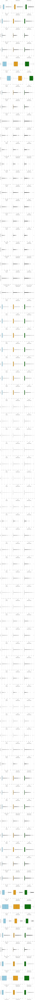

In [98]:
# Set Seaborn style
sns.set_style('whitegrid')

data_original = data_corrected_outliers
data_minmax = data_minmax_scaled
data_standard = data_standard_scaled

# Create subplots
fig, axes = plt.subplots(len(numeric_features), 3, figsize=(10, len(numeric_features) * 4), tight_layout=True, sharex=False, sharey='row')

# Iterate through numeric features
for i, feature in enumerate(numeric_features):
    # Original Data
    sns.boxplot(data=data_original, x=feature, ax=axes[i][0], width=0.4, color='skyblue')
    axes[i][0].set_title('Original')
    axes[i][0].set_ylabel(feature)

    # MinMax Scaled Data
    sns.boxplot(data=data_minmax, x=feature, ax=axes[i][1], width=0.4, color='orange')
    axes[i][1].set_title('MinMaxScaler()')

    # Standard Scaled Data
    sns.boxplot(data=data_standard, x=feature, ax=axes[i][2], width=0.4, color='green')
    axes[i][2].set_title('StandardScaler()')

# Add an overall title
plt.show()


#### PCA

In [99]:
features_to_treat_num

['vendor_count',
 'product_count',
 'is_chain',
 'late_night',
 'early_morning',
 'morning',
 'midday',
 'afternoon_evening',
 'night',
 'DOW_0',
 'DOW_1',
 'DOW_2',
 'DOW_3',
 'DOW_4',
 'DOW_5',
 'DOW_6',
 'total_spending',
 'total_orders',
 'order_span',
 'order_frequency',
 'avg_product_cost',
 'avg_order_cost',
 'products_per_vendor',
 'cui_diversity_score']

In [100]:
data_to_pca = data_standard_scaled[features_to_treat_num].copy()

In [101]:
pca = PCA(n_components=8)
data_pca = pca.fit_transform(data_to_pca)

# Create a DataFrame for the PCA results
data_pca_df = pd.DataFrame(data_pca, columns=[f'PCA{i+1}' for i in range(data_pca.shape[1])], index=data_standard_scaled.index)

In [102]:
# This was generated with the help of ChatGPT

explained_variance_ratio = pca.explained_variance_ratio_

# Print variance explained by each component
print("Variance explained by each component:")
for i, variance in enumerate(explained_variance_ratio):
    print(f"PC{i + 1}: {variance:.4f}")

# Calculate and print cumulative variance explained
cumulative_variance = np.cumsum(explained_variance_ratio)
print("\nCumulative variance explained:")
for i, cumulative in enumerate(cumulative_variance):
    print(f"Up to PC{i + 1}: {cumulative:.4f}")

Variance explained by each component:
PC1: 0.4220
PC2: 0.0975
PC3: 0.0634
PC4: 0.0515
PC5: 0.0409
PC6: 0.0387
PC7: 0.0352
PC8: 0.0303

Cumulative variance explained:
Up to PC1: 0.4220
Up to PC2: 0.5195
Up to PC3: 0.5829
Up to PC4: 0.6344
Up to PC5: 0.6753
Up to PC6: 0.7140
Up to PC7: 0.7492
Up to PC8: 0.7796


In [103]:
# This code was generated with the help of ChatGPT

loadings = pd.DataFrame(
    pca.components_.T,  # Transpose to get features as rows
    columns=[f'PC{i+1}' for i in range(pca.n_components_)],  # Label components
    index=data_to_pca.columns  # Use original feature names as the index
)

print(loadings)

                          PC1       PC2       PC3       PC4       PC5  \
vendor_count         0.277429 -0.028045 -0.081123 -0.247775 -0.199192   
product_count        0.304278  0.093522  0.053265  0.040825 -0.013396   
is_chain             0.276223 -0.075598  0.096006 -0.067633  0.004661   
late_night           0.063638  0.263432 -0.306533 -0.398258  0.043912   
early_morning        0.108480  0.214489 -0.194145 -0.280310  0.398889   
morning              0.224894  0.050983  0.046214 -0.026048  0.211592   
midday               0.188762 -0.027390  0.131164  0.268527 -0.088866   
afternoon_evening    0.212981 -0.141995  0.192827  0.229125 -0.182038   
night                0.129576 -0.128415  0.103304 -0.126392 -0.265251   
DOW_0                0.215680  0.038285  0.032167 -0.072118  0.169752   
DOW_1                0.217639  0.039796  0.039299 -0.063635  0.211270   
DOW_2                0.218256  0.033680  0.037847 -0.007724  0.181932   
DOW_3                0.218650  0.026168  0.037522 -

In [104]:
for pc in loadings.columns:
    print(f"\nTop variables for {pc}:")
    print(loadings[pc].abs().sort_values(ascending=False).head(5))


Top variables for PC1:
total_orders           0.310920
product_count          0.304278
vendor_count           0.277429
is_chain               0.276223
cui_diversity_score    0.246499
Name: PC1, dtype: float64

Top variables for PC2:
avg_order_cost      0.557070
avg_product_cost    0.542389
total_spending      0.341321
late_night          0.263432
early_morning       0.214489
Name: PC2, dtype: float64

Top variables for PC3:
order_frequency      0.691672
order_span           0.511617
late_night           0.306533
early_morning        0.194145
afternoon_evening    0.192827
Name: PC3, dtype: float64

Top variables for PC4:
products_per_vendor    0.579444
late_night             0.398258
order_frequency        0.307451
early_morning          0.280310
midday                 0.268527
Name: PC4, dtype: float64

Top variables for PC5:
early_morning          0.398889
products_per_vendor    0.341531
DOW_5                  0.298879
DOW_6                  0.296033
avg_order_cost         0.278086
N

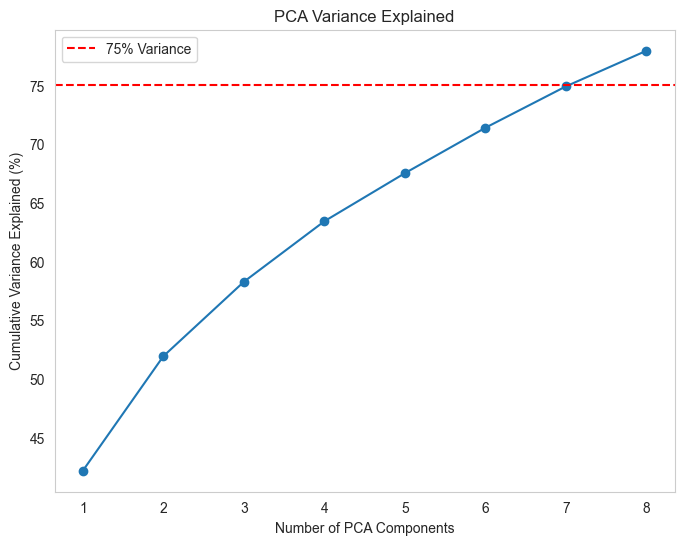

In [105]:
cumulative_variance = np.cumsum(pca.explained_variance_ratio_ * 100)
n_components = len(pca.explained_variance_ratio_)

plt.figure(figsize=(8, 6))
plt.plot(range(1, n_components + 1), cumulative_variance, marker='o')  # Proper x-axis mapping
plt.xlabel("Number of PCA Components")
plt.ylabel("Cumulative Variance Explained (%)")
plt.title("PCA Variance Explained")
plt.axhline(y=75, color='r', linestyle='--', label="75% Variance")
plt.xticks(range(1, n_components + 1))  # Ensure all components are shown on the x-axis
plt.legend()
plt.grid()
plt.show()


Create copys of the dataset to apply dbscan for different set of parameters.

In [106]:
data_pca_df_test1 = data_pca_df.copy()

In [107]:
data_pca_df_test2 = data_pca_df.copy()

In [108]:
data_pca_df_test3 = data_pca_df.copy()

In [109]:
data_pca_test1 = data_pca.copy()

In [110]:
data_pca_test2 = data_pca.copy()

In [111]:
data_pca_test3 = data_pca.copy()

#### DBScan

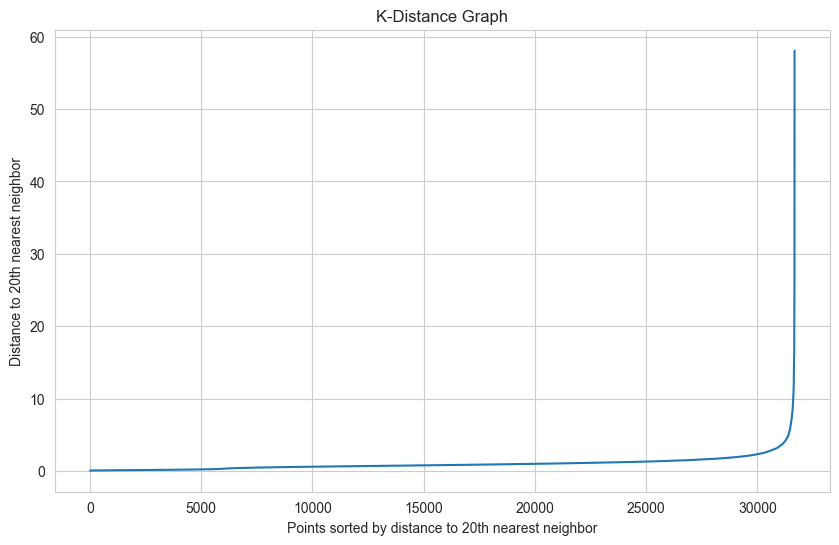

In [112]:
neigh = NearestNeighbors(n_neighbors=20)  # k = 20, adjust based on dataset size
neigh.fit(data_pca)  # Use PCA-reduced data
distances, _ = neigh.kneighbors(data_pca)

# Sort distances to plot the k-distance graph
distances = np.sort(distances[:, -1])  # Use the 20th neighbor distance
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title("K-Distance Graph")
plt.xlabel("Points sorted by distance to 20th nearest neighbor")
plt.ylabel("Distance to 20th nearest neighbor")
plt.show()

We are testing 3 different dbscan solutions with varying parameters to find the best balance between keeping the most observations possible and not having outliers that may bias our results too much.

In [113]:
eps_test1=3
min_samples_test1 = 12

dbscan = DBSCAN(eps=eps_test1, min_samples=min_samples_test1, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(data_pca_test1)

data_pca_df_test1['DBSCAN_Label'] = dbscan_labels

In [114]:
eps_test2=3.5
min_samples_test2 = 12

dbscan = DBSCAN(eps=eps_test2, min_samples=min_samples_test2, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(data_pca_test2)

data_pca_df_test2['DBSCAN_Label'] = dbscan_labels

In [115]:
eps_test3=4
min_samples_test3 = 12

dbscan = DBSCAN(eps=eps_test3, min_samples=min_samples_test3, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(data_pca_test3)

data_pca_df_test3['DBSCAN_Label'] = dbscan_labels

In [116]:
cluster_sizes_test1 = data_pca_df_test1['DBSCAN_Label'].value_counts()
print(cluster_sizes_test1)

DBSCAN_Label
 0    31237
-1      435
Name: count, dtype: int64


In [117]:
cluster_sizes_test2 = data_pca_df_test2['DBSCAN_Label'].value_counts()
print(cluster_sizes_test2)

DBSCAN_Label
 0    31389
-1      283
Name: count, dtype: int64


In [118]:
cluster_sizes_test3 = data_pca_df_test3['DBSCAN_Label'].value_counts()
print(cluster_sizes_test3)

DBSCAN_Label
 0    31457
-1      215
Name: count, dtype: int64


#### Seeing scatter plots with PCA and outliers

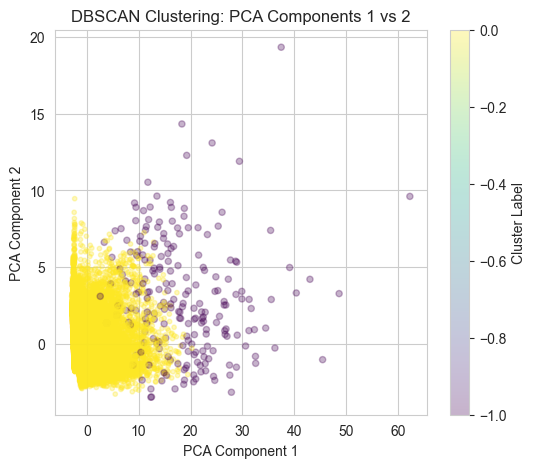

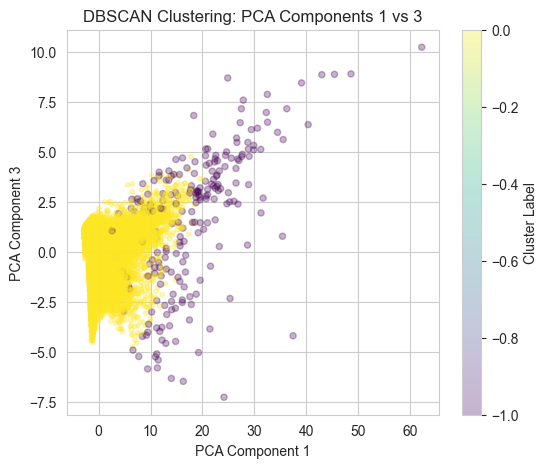

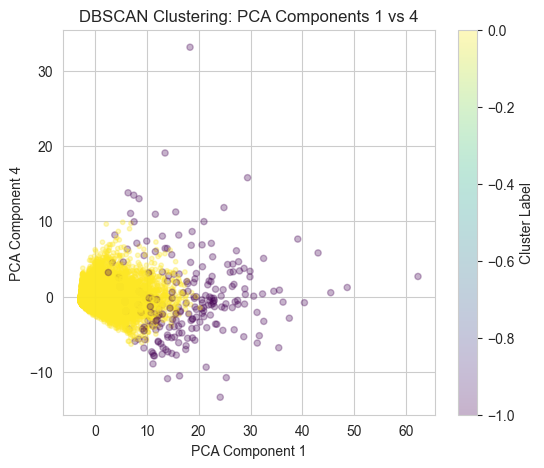

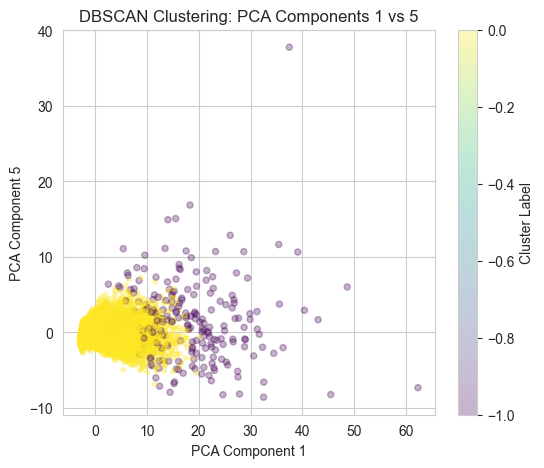

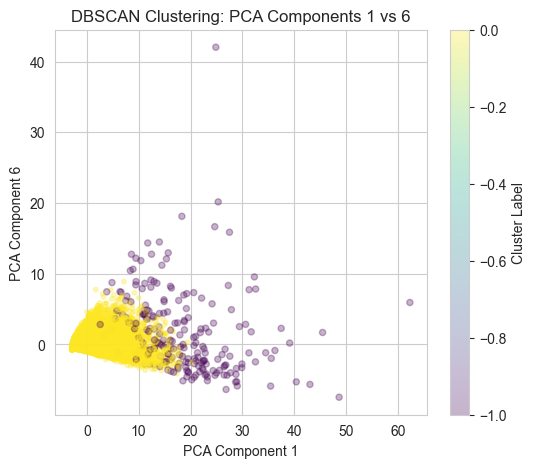

...

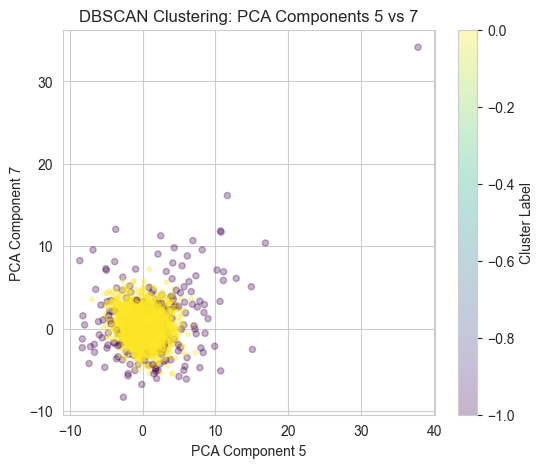

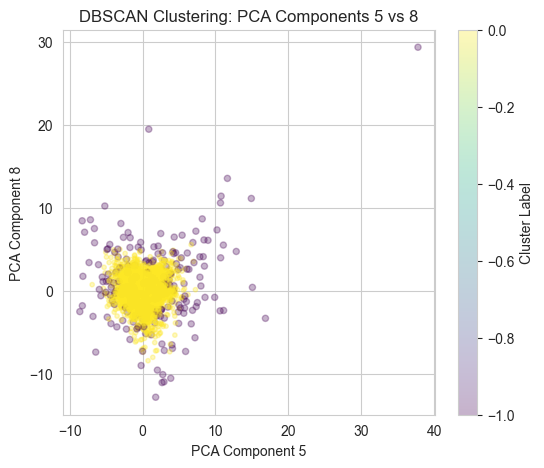

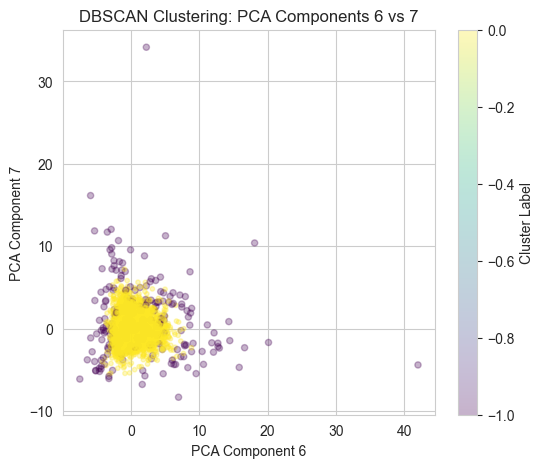

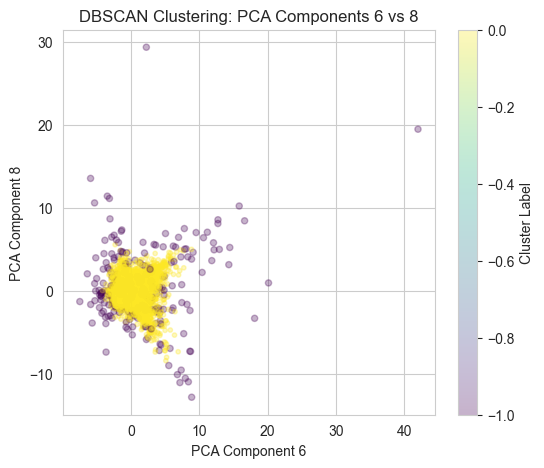

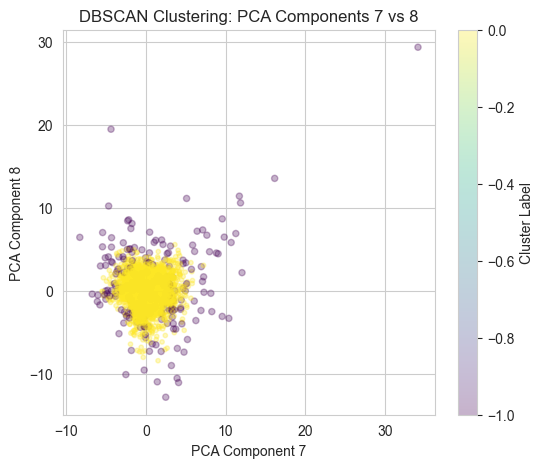

In [119]:
# Number of PCA components to consider
num_pca_components = data_pca_test1.shape[1]

# Iterate through all combinations of PCA components (2 at a time)
for combo in itertools.combinations(range(num_pca_components), 2):
    x_component, y_component = combo

    # Scatter plot for the selected PCA components
    plt.figure(figsize=(6, 5))
    plt.scatter(
        data_pca_test1[:, x_component],  # Use the current x_component from the combination
        data_pca_test1[:, y_component],  # Use the current y_component from the combination
        c=dbscan_labels,
        cmap='viridis',
        s=[20 if label == -1 else 10 for label in dbscan_labels],  # Larger points for outliers
        alpha=0.3
    )
    plt.title(f"DBSCAN Clustering: PCA Components {x_component+1} vs {y_component+1}")
    plt.xlabel(f"PCA Component {x_component+1}")
    plt.ylabel(f"PCA Component {y_component+1}")
    plt.colorbar(label="Cluster Label")
    plt.show()


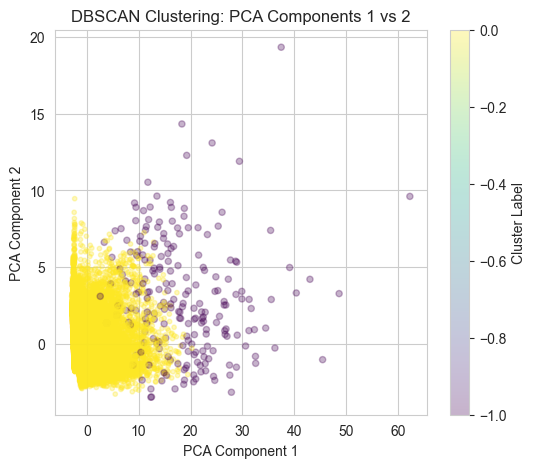

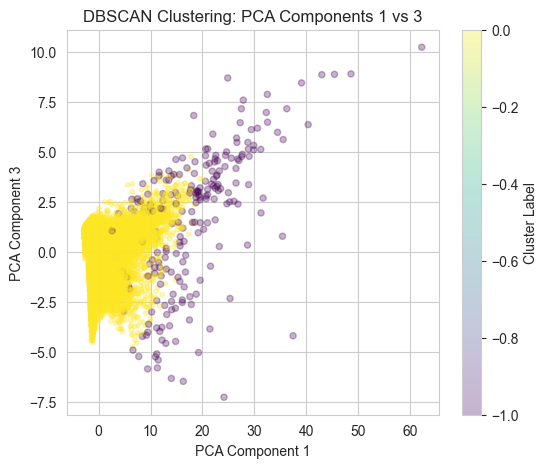

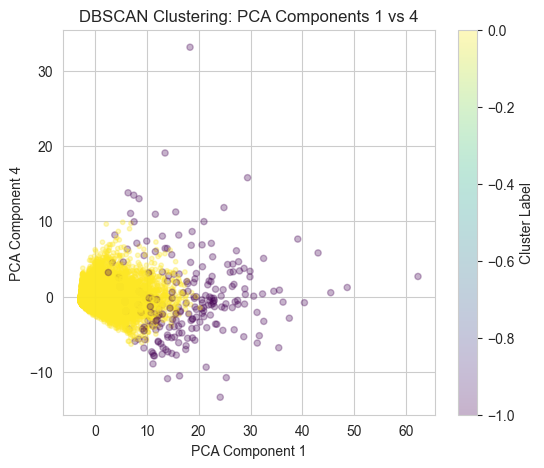

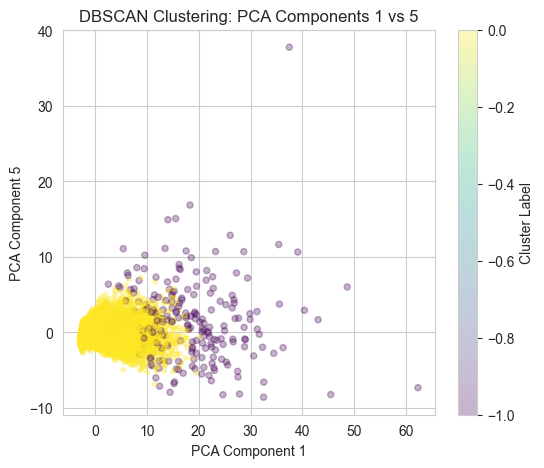

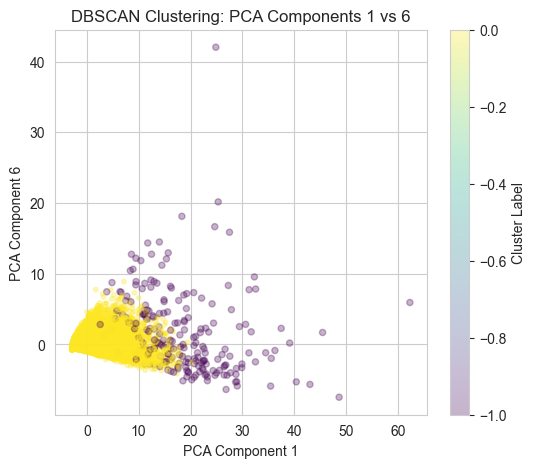

...

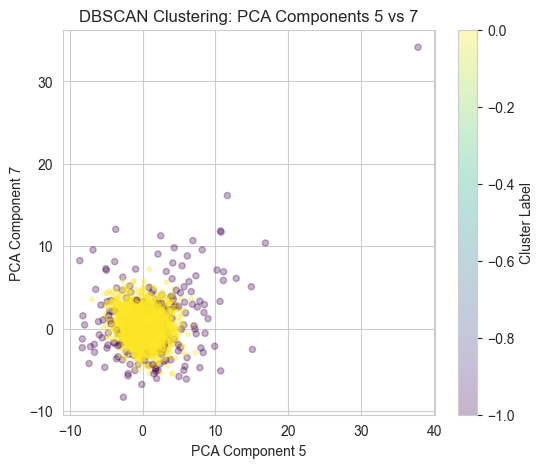

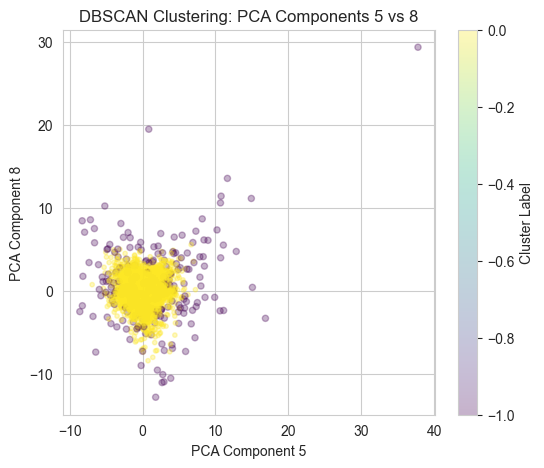

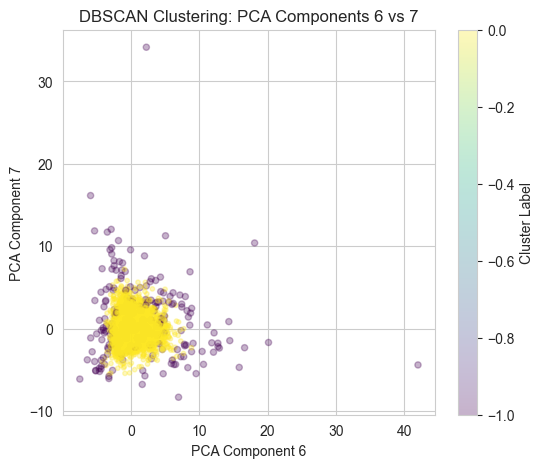

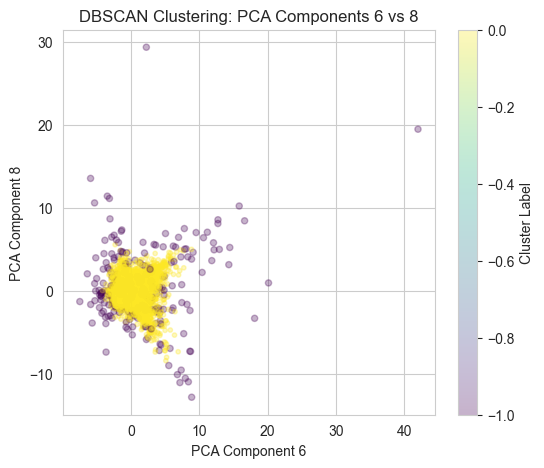

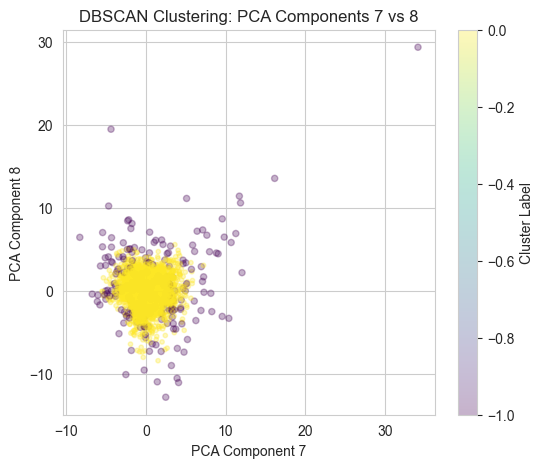

In [120]:
num_pca_components = data_pca_test2.shape[1]

# Iterate through all combinations of PCA components (2 at a time)
for combo in itertools.combinations(range(num_pca_components), 2):
    x_component, y_component = combo

    # Scatter plot for the selected PCA components
    plt.figure(figsize=(6, 5))
    plt.scatter(
        data_pca_test2[:, x_component],  # Use the current x_component from the combination
        data_pca_test2[:, y_component],  # Use the current y_component from the combination
        c=dbscan_labels,
        cmap='viridis',
        s=[20 if label == -1 else 10 for label in dbscan_labels],  # Larger points for outliers
        alpha=0.3
    )
    plt.title(f"DBSCAN Clustering: PCA Components {x_component+1} vs {y_component+1}")
    plt.xlabel(f"PCA Component {x_component+1}")
    plt.ylabel(f"PCA Component {y_component+1}")
    plt.colorbar(label="Cluster Label")
    plt.show()


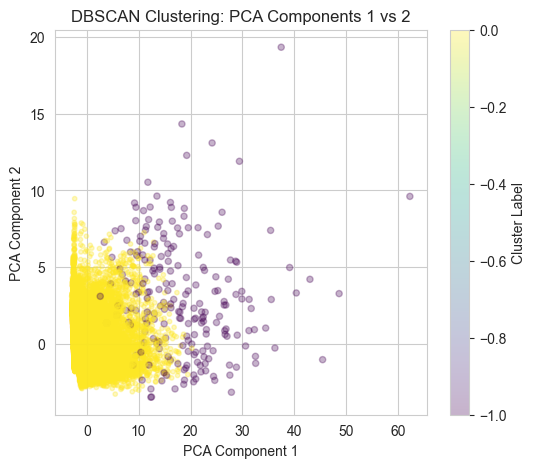

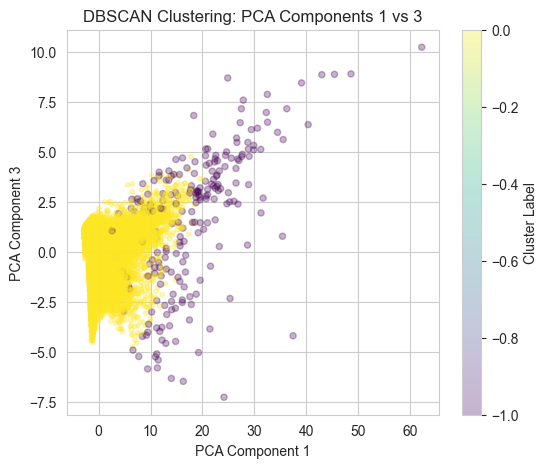

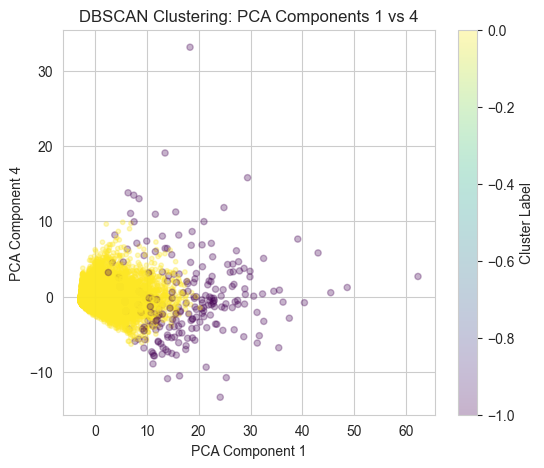

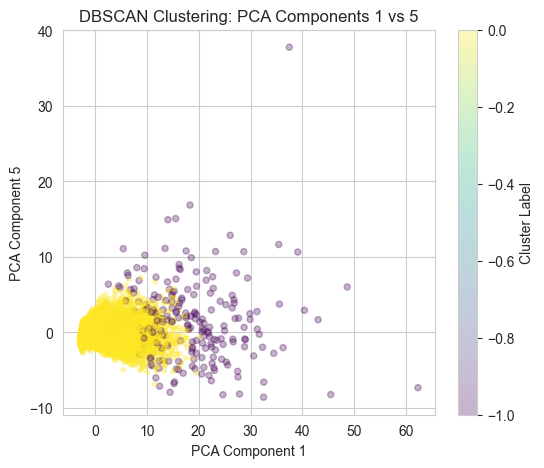

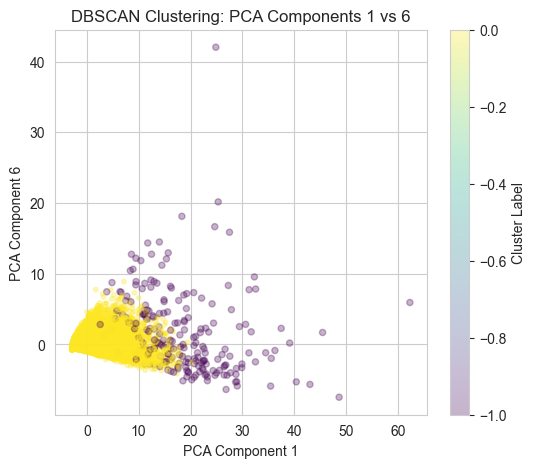

...

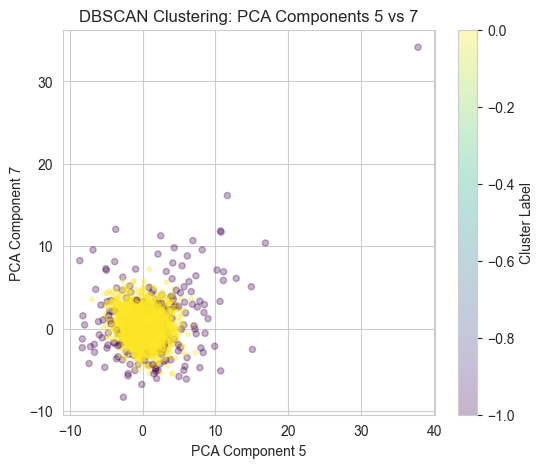

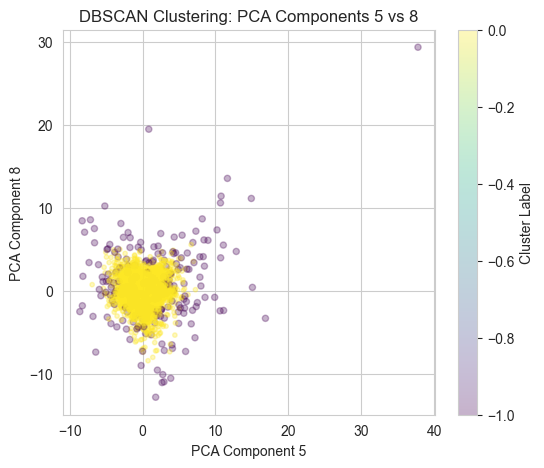

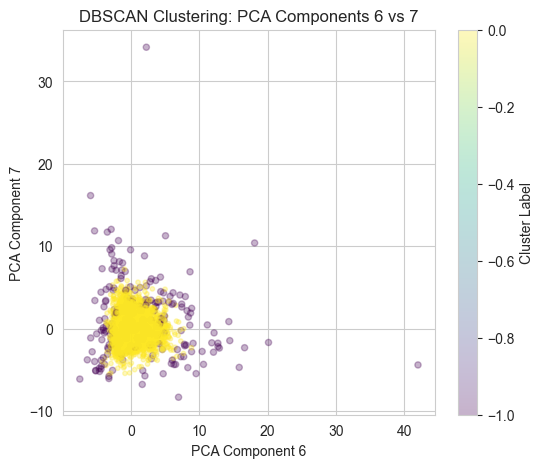

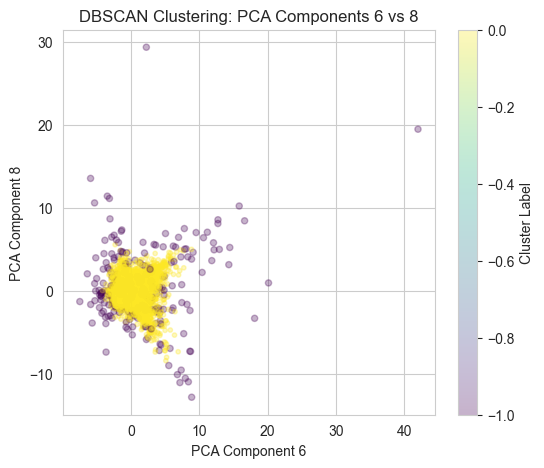

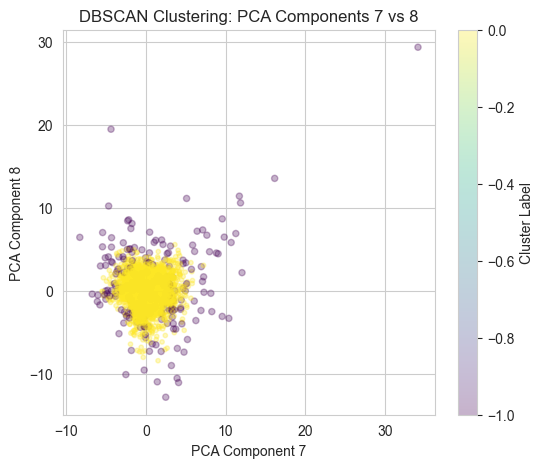

In [121]:
num_pca_components = data_pca_test3.shape[1]

# Iterate through all combinations of PCA components (2 at a time)
for combo in itertools.combinations(range(num_pca_components), 2):
    x_component, y_component = combo

    # Scatter plot for the selected PCA components
    plt.figure(figsize=(6, 5))
    plt.scatter(
        data_pca_test3[:, x_component],  # Use the current x_component from the combination
        data_pca_test3[:, y_component],  # Use the current y_component from the combination
        c=dbscan_labels,
        cmap='viridis',
        s=[20 if label == -1 else 10 for label in dbscan_labels],  # Larger points for outliers
        alpha=0.3
    )
    plt.title(f"DBSCAN Clustering: PCA Components {x_component+1} vs {y_component+1}")
    plt.xlabel(f"PCA Component {x_component+1}")
    plt.ylabel(f"PCA Component {y_component+1}")
    plt.colorbar(label="Cluster Label")
    plt.show()


#### Profiling

Identifying the outliers with the 3 different parameters set for DBSCAN

In [122]:
outliers_pca_test1 = data_pca_df_test1[data_pca_df_test1['DBSCAN_Label'] == -1]

In [123]:
outliers_pca_test1

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,DBSCAN_Label
customer_id,,,,,,,,,
4d43db4f0a,9.243027,-0.061707,3.174260,3.483544,-2.074927,-0.492106,5.144271,-1.998894,-1
7b0661a6ba,6.263238,2.640120,2.172179,6.310736,7.871789,4.708608,3.346117,1.635061,-1
01ad9867f2,10.365998,6.223700,-2.268375,-3.933069,-0.597692,1.708162,1.643547,-4.531710,-1
63953d4795,13.091118,2.676597,0.216322,-3.118519,1.788702,-1.384713,-0.799512,0.672223,-1
768c58de1d,8.829905,2.857733,-0.195999,-2.195018,4.220594,-2.485122,1.291353,2.615703,-1
...,...,...,...,...,...,...,...,...,...
0990395255,10.685812,-2.367332,3.564138,-1.319041,-3.387754,7.876549,-2.065312,5.020215,-1
c9b1b6e4bd,1.003889,0.975848,-0.114920,-0.853851,4.425733,4.191976,0.525192,-3.053862,-1
77f20ddff6,3.403877,3.880158,-0.895647,-0.994420,2.240099,5.768228,0.186480,-4.729593,-1


In [124]:
outliers_pca_test2 = data_pca_df_test2[data_pca_df_test2['DBSCAN_Label'] == -1]

In [125]:
outliers_pca_test2

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,DBSCAN_Label
customer_id,,,,,,,,,
7b0661a6ba,6.263238,2.640120,2.172179,6.310736,7.871789,4.708608,3.346117,1.635061,-1
eb4664b1ac,11.225138,0.792572,0.678223,-0.593288,-2.703309,4.327285,6.264852,-3.590293,-1
249ba584d3,29.423084,11.901430,6.110867,15.784495,7.195231,2.511557,-0.040455,-5.660314,-1
61327c3c6c,22.455572,4.983503,1.600116,-1.075731,2.974230,-2.418709,2.357346,3.695340,-1
98349dd8d7,16.652282,-0.995987,3.422608,1.581068,-4.160418,-2.668738,3.521436,-1.616190,-1
...,...,...,...,...,...,...,...,...,...
d0448942d4,23.063210,0.929252,3.060846,-1.334471,-5.031504,-4.209527,7.283209,-0.183868,-1
cc499f3531,14.479696,-2.416999,3.871989,-1.534413,-7.942969,11.192069,0.466365,7.053108,-1
340dec8401,1.735367,1.285084,1.212745,4.402949,2.014154,7.742767,0.002757,2.763624,-1


In [126]:
outliers_pca_test3 = data_pca_df_test3[data_pca_df_test3['DBSCAN_Label'] == -1]

In [127]:
outliers_pca_test3

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,DBSCAN_Label
customer_id,,,,,,,,,
7b0661a6ba,6.263238,2.640120,2.172179,6.310736,7.871789,4.708608,3.346117,1.635061,-1
eb4664b1ac,11.225138,0.792572,0.678223,-0.593288,-2.703309,4.327285,6.264852,-3.590293,-1
249ba584d3,29.423084,11.901430,6.110867,15.784495,7.195231,2.511557,-0.040455,-5.660314,-1
61327c3c6c,22.455572,4.983503,1.600116,-1.075731,2.974230,-2.418709,2.357346,3.695340,-1
1b178d7662,16.104858,-1.070241,2.026760,-1.385962,-4.953667,-2.163990,7.097222,1.123839,-1
...,...,...,...,...,...,...,...,...,...
62e7f68f53,9.480533,8.904791,-4.012501,-4.542564,-0.773302,2.967635,3.469451,-4.600729,-1
d0448942d4,23.063210,0.929252,3.060846,-1.334471,-5.031504,-4.209527,7.283209,-0.183868,-1
cc499f3531,14.479696,-2.416999,3.871989,-1.534413,-7.942969,11.192069,0.466365,7.053108,-1


Storing the indexes of the outliers for each parameter set test.

In [128]:
dbscan_outlier_indices_test1 = outliers_pca_test1.index

In [129]:
dbscan_outlier_indices_test2 = outliers_pca_test2.index

In [130]:
dbscan_outlier_indices_test3 = outliers_pca_test3.index

Check the outliers removed by the different methods (DBSCAN removal and manual filter).

In [131]:
data_corrected_outliers.loc[dbscan_outlier_indices_test1]['total_orders'].describe()

count    435.000000
mean      28.947126
std       14.451714
min        3.000000
25%       20.000000
50%       26.000000
75%       35.000000
max       94.000000
Name: total_orders, dtype: float64

In [132]:
data_corrected_outliers.loc[dbscan_outlier_indices_test1][data_corrected_outliers['total_orders']<10]

C:\Users\Francisco Pontes\AppData\Local\Temp\ipykernel_21824\3664826132.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_corrected_outliers.loc[dbscan_outlier_indices_test1][data_corrected_outliers['total_orders']<10]


,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
e1e6bce330,8670,46.0,1,9,7,0.0,81,NO PROMO,CARD,94.73,...,8,11.571429,81.0,10.525556,13.532857,9.000000,1,CUI_American,4,5
ef6633ecce,8670,46.0,1,9,0,1.0,80,NO PROMO,CARD,0.00,...,8,8.777778,79.0,6.052222,6.052222,9.000000,1,CUI_Asian,3,3
628a191ba3,2360,22.0,2,16,8,4.0,32,FREEBIE,CARD,1.27,...,2,3.500000,28.0,4.453125,8.906250,8.000000,2,CUI_Asian,5,2
32aa2ebe3d,8370,44.0,2,20,6,6.0,60,NO PROMO,CARD,0.00,...,8,7.714286,54.0,14.179500,40.512857,10.000000,2,CUI_Street Food / Snacks,4,5
c105adcd06,8670,26.0,3,17,7,6.0,77,NO PROMO,CARD,225.11,...,8,8.875000,71.0,13.241765,28.138750,5.666667,1,CUI_American,4,4
698f49da0a,8670,24.0,1,8,8,6.0,83,DISCOUNT,CARD,0.00,...,8,9.625000,77.0,5.840000,5.840000,8.000000,1,CUI_Beverages,2,4
095d1d3ca7,8670,26.0,1,9,9,9.0,87,FREEBIE,CARD,54.54,...,8,8.666667,78.0,6.060000,6.060000,9.000000,1,CUI_American,4,3
28f2956ca1,8670,26.0,4,13,1,16.0,38,FREEBIE,CASH,0.00,...,8,5.500000,22.0,15.854615,51.527500,3.250000,3,CUI_Asian,3,3
dd7fc6cef2,8670,25.0,1,10,0,16.0,60,NO PROMO,CARD,81.32,...,8,4.888889,44.0,8.132000,9.035556,10.000000,1,CUI_American,4,6


In [133]:
data_corrected_outliers.loc[dbscan_outlier_indices_test1][data_corrected_outliers['total_orders']<10].describe()

C:\Users\Francisco Pontes\AppData\Local\Temp\ipykernel_21824\1808925523.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_corrected_outliers.loc[dbscan_outlier_indices_test1][data_corrected_outliers['total_orders']<10].describe()


,customer_age,vendor_count,product_count,is_chain,first_order,last_order,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,...,total_spending,total_orders,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,dow_diversity_score,hr_diversity_score
count,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.0,...,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.00000,16.000000,16.000000
mean,29.875000,1.437500,12.500000,3.812500,23.750000,68.625000,28.560625,29.247500,16.045000,0.0,...,109.622500,6.625000,6.709077,44.875000,8.523784,20.190710,10.057292,1.25000,3.375000,3.187500
std,8.980535,0.892095,4.273952,3.868139,21.724027,16.660832,61.202453,56.358364,37.002717,0.0,...,73.954164,2.061553,3.644434,26.936654,4.570595,16.328077,4.068479,0.57735,1.204159,1.327592
min,18.000000,1.000000,7.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.0,...,5.420000,3.000000,0.000000,0.000000,0.774286,0.774286,3.250000,1.00000,1.000000,1.000000
25%,24.000000,1.000000,9.000000,0.000000,6.000000,60.000000,0.000000,0.000000,0.000000,0.0,...,57.997500,5.000000,4.475000,23.500000,5.534203,7.060313,8.000000,1.00000,3.000000,2.000000
50%,26.000000,1.000000,12.000000,3.500000,16.000000,72.000000,0.000000,0.000000,0.000000,0.0,...,88.025000,7.000000,7.940476,46.500000,7.096000,13.004762,9.000000,1.00000,3.000000,3.000000
75%,35.500000,1.250000,14.500000,7.250000,46.250000,81.000000,14.587500,28.430000,3.447500,0.0,...,138.702500,8.000000,9.062500,72.500000,13.103396,31.037000,11.500000,1.00000,4.000000,4.000000
max,46.000000,4.000000,21.000000,9.000000,60.000000,87.000000,225.110000,180.130000,137.060000,0.0,...,283.590000,9.000000,11.666667,81.000000,15.854615,51.527500,21.000000,3.00000,6.000000,6.000000


In [134]:
data_corrected_outliers.loc[dbscan_outlier_indices_test1]['order_span'].describe()

count    435.000000
mean      79.475862
std       12.947652
min        0.000000
25%       78.000000
50%       84.000000
75%       87.000000
max       89.000000
Name: order_span, dtype: float64

In [135]:
data_corrected_outliers['order_span'].describe()

count    31672.000000
mean        35.473068
std         29.405627
min          0.000000
25%          3.000000
50%         34.000000
75%         62.000000
max         90.000000
Name: order_span, dtype: float64

In [136]:
data_corrected_outliers.loc[dbscan_outlier_indices_test1]['avg_order_cost'].describe()

count    435.000000
mean       8.967120
std        6.736072
min        0.774286
25%        4.638485
50%        6.771667
75%       11.120722
max       51.527500
Name: avg_order_cost, dtype: float64

In [137]:
data_corrected_outliers['avg_order_cost'].describe()

count    31672.000000
mean        10.305453
std          7.859962
min          0.370000
25%          5.065750
50%          8.218750
75%         12.926786
max        104.320000
Name: avg_order_cost, dtype: float64

In [138]:
data_corrected_outliers.loc[dbscan_outlier_indices_test1]['total_spending'].describe()

count     435.000000
mean      225.100575
std       146.275410
min         5.420000
25%       123.015000
50%       191.300000
75%       287.710000
max      1418.330000
Name: total_spending, dtype: float64

In [139]:
data_corrected_outliers['total_spending'].describe()

count    31672.000000
mean        38.478948
std         46.446450
min          0.370000
25%         13.030000
50%         24.200000
75%         45.265000
max       1418.330000
Name: total_spending, dtype: float64

In [140]:
data_corrected_outliers.loc[dbscan_outlier_indices_test2]['total_orders'].describe()

count    283.000000
mean      33.416961
std       15.403186
min        5.000000
25%       23.000000
50%       31.000000
75%       41.000000
max       94.000000
Name: total_orders, dtype: float64

In [141]:
data_corrected_outliers.loc[dbscan_outlier_indices_test2]['order_span'].describe()

count    283.000000
mean      80.819788
std       10.611751
min       10.000000
25%       80.000000
50%       84.000000
75%       87.000000
max       89.000000
Name: order_span, dtype: float64

In [142]:
data_corrected_outliers.loc[dbscan_outlier_indices_test2]['total_orders'].describe()

count    283.000000
mean      33.416961
std       15.403186
min        5.000000
25%       23.000000
50%       31.000000
75%       41.000000
max       94.000000
Name: total_orders, dtype: float64

In [143]:
data_corrected_outliers.loc[dbscan_outlier_indices_test3]['order_span'].describe()

count    215.000000
mean      81.344186
std       10.941333
min       10.000000
25%       81.000000
50%       85.000000
75%       87.000000
max       89.000000
Name: order_span, dtype: float64

In [144]:
pd.set_option('display.float_format', '{:.2f}'.format)
data_corrected_outliers.loc[dbscan_outlier_indices_test1].describe().T

,count,mean,std,min,25%,50%,75%,max
customer_age,435.00,27.36,6.87,17.00,23.00,26.00,30.00,68.00
vendor_count,435.00,12.20,7.71,1.00,6.00,11.00,17.00,41.00
product_count,435.00,39.19,21.36,7.00,27.00,35.00,47.00,269.00
is_chain,435.00,18.77,14.35,0.00,8.00,17.00,27.00,83.00
first_order,435.00,5.12,9.68,0.00,0.00,2.00,5.00,64.00
...,...,...,...,...,...,...,...,...
avg_order_cost,435.00,8.97,6.74,0.77,4.64,6.77,11.12,51.53
products_per_vendor,435.00,5.32,6.25,1.13,2.21,3.25,5.45,70.00
cui_diversity_score,435.00,5.36,2.70,1.00,3.00,5.00,7.00,13.00
dow_diversity_score,435.00,6.43,0.98,1.00,6.00,7.00,7.00,7.00


In [145]:
data_corrected_outliers.loc[dbscan_outlier_indices_test2].describe().T

,count,mean,std,min,25%,50%,75%,max
customer_age,283.00,27.52,7.11,17.00,23.00,26.00,30.00,68.00
vendor_count,283.00,13.54,8.38,1.00,7.00,14.00,19.00,41.00
product_count,283.00,45.45,23.28,8.00,31.00,40.00,56.00,269.00
is_chain,283.00,21.65,16.00,0.00,9.00,20.00,31.00,83.00
first_order,283.00,4.43,8.06,0.00,0.00,2.00,5.00,60.00
...,...,...,...,...,...,...,...,...
avg_order_cost,283.00,8.82,6.41,1.62,4.63,6.62,10.83,40.51
products_per_vendor,283.00,5.89,7.28,1.13,2.34,3.36,6.10,70.00
cui_diversity_score,283.00,5.64,2.79,1.00,4.00,6.00,7.00,13.00
dow_diversity_score,283.00,6.61,0.75,2.00,6.00,7.00,7.00,7.00


In [146]:
data_corrected_outliers.loc[dbscan_outlier_indices_test3].describe().T

,count,mean,std,min,25%,50%,75%,max
customer_age,215.00,27.47,7.20,17.00,23.00,26.00,30.00,68.00
vendor_count,215.00,14.27,8.80,1.00,7.00,14.00,20.00,41.00
product_count,215.00,49.68,24.74,13.00,35.00,45.00,61.00,269.00
is_chain,215.00,23.73,17.02,0.00,10.00,23.00,33.00,83.00
first_order,215.00,4.01,7.91,0.00,0.00,1.00,4.00,60.00
...,...,...,...,...,...,...,...,...
avg_order_cost,215.00,8.52,6.30,1.62,4.33,6.46,10.43,40.51
products_per_vendor,215.00,6.30,7.98,1.40,2.36,3.57,6.27,70.00
cui_diversity_score,215.00,5.84,2.84,1.00,4.00,6.00,8.00,13.00
dow_diversity_score,215.00,6.69,0.61,4.00,7.00,7.00,7.00,7.00


In [147]:
data_corrected_outliers.loc[manual_outlier_indices2].describe().T

,count,mean,std,min,25%,50%,75%,max
customer_age,139.00,26.99,7.31,17.00,23.00,25.00,29.00,68.00
vendor_count,139.00,12.53,9.96,1.00,2.00,13.00,18.00,41.00
product_count,139.00,51.68,30.88,6.00,30.00,51.00,66.00,269.00
is_chain,139.00,23.41,20.28,0.00,6.50,18.00,36.50,83.00
first_order,139.00,5.06,9.87,0.00,0.00,1.00,5.00,60.00
...,...,...,...,...,...,...,...,...
avg_order_cost,139.00,10.42,10.99,1.62,4.74,6.54,12.43,104.32
products_per_vendor,139.00,8.98,9.71,1.61,3.05,4.46,14.00,70.00
cui_diversity_score,139.00,5.08,3.12,1.00,2.00,6.00,7.00,13.00
dow_diversity_score,139.00,6.46,1.12,1.00,6.00,7.00,7.00,7.00


In [148]:
data_corrected_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
customer_age,31672.00,27.47,7.09,15.00,23.00,26.00,31.00,80.00
vendor_count,31672.00,3.12,2.77,1.00,1.00,2.00,4.00,41.00
product_count,31672.00,5.70,6.96,1.00,2.00,3.00,7.00,269.00
is_chain,31672.00,2.83,3.98,0.00,1.00,2.00,3.00,83.00
first_order,31672.00,28.29,24.08,0.00,7.00,22.00,44.00,90.00
...,...,...,...,...,...,...,...,...
avg_order_cost,31672.00,10.31,7.86,0.37,5.07,8.22,12.93,104.32
products_per_vendor,31672.00,1.79,1.34,1.00,1.00,1.50,2.00,70.00
cui_diversity_score,31672.00,2.29,1.48,1.00,1.00,2.00,3.00,13.00
dow_diversity_score,31672.00,2.73,1.64,1.00,1.00,2.00,4.00,7.00


In [149]:
data_corrected_outliers.loc[manual_outlier_indices]['total_orders'].describe()

count   80.00
mean    40.58
std     21.95
min      1.00
25%     23.00
50%     36.00
75%     57.75
max     94.00
Name: total_orders, dtype: float64

In [150]:
data_corrected_outliers.loc[manual_outlier_indices]['order_span'].describe()

count   80.00
mean    81.71
std     12.03
min      0.00
25%     81.00
50%     85.50
75%     88.00
max     89.00
Name: order_span, dtype: float64

In [151]:
data_corrected_outliers.loc[manual_outlier_indices]['avg_order_cost'].describe()

count    80.00
mean     12.45
std      13.27
min       2.27
25%       5.19
50%       7.90
75%      15.74
max     104.32
Name: avg_order_cost, dtype: float64

In [152]:
data_corrected_outliers.loc[manual_outlier_indices]['total_spending'].describe()

count     80.00
mean     365.49
std      224.03
min       64.66
25%      192.02
50%      316.63
75%      476.60
max     1418.33
Name: total_spending, dtype: float64

#### Remove the outliers

Remove outliers only identified by dbscan.

In [153]:
# Remove the intersecting outliers from the dataset
data_cleaned_test1_db = data_corrected_outliers.drop(index=dbscan_outlier_indices_test1)
data_cleaned_scaled_test1_db = data_standard_scaled.drop(index=dbscan_outlier_indices_test1)

# Print the number of outliers removed
print(f"Total outliers removed (intersection): {len(dbscan_outlier_indices_test1)}")
print(f"Remaining rows in dataset: {data_cleaned_test1_db.shape[0]}")

Total outliers removed (intersection): 435
Remaining rows in dataset: 31237


In [154]:
# Remove the intersecting outliers from the dataset
data_cleaned_test2_db = data_corrected_outliers.drop(index=dbscan_outlier_indices_test2)
data_cleaned_scaled_test2_db = data_standard_scaled.drop(index=dbscan_outlier_indices_test2)

# Print the number of outliers removed
print(f"Total outliers removed (intersection): {len(dbscan_outlier_indices_test2)}")
print(f"Remaining rows in dataset: {data_cleaned_test2_db.shape[0]}")

Total outliers removed (intersection): 283
Remaining rows in dataset: 31389


In [155]:
# Remove the intersecting outliers from the dataset
data_cleaned_test3_db = data_corrected_outliers.drop(index=dbscan_outlier_indices_test3)
data_cleaned_scaled_test3_db = data_standard_scaled.drop(index=dbscan_outlier_indices_test3)

# Print the number of outliers removed
print(f"Total outliers removed (intersection): {len(dbscan_outlier_indices_test3)}")
print(f"Remaining rows in dataset: {data_cleaned_test3_db.shape[0]}")

Total outliers removed (intersection): 215
Remaining rows in dataset: 31457


Remove outliers identified by the two methods (DBSCAN and manual filter).

In [156]:
combined_outlier_indices_test1 = dbscan_outlier_indices_test1.intersection(manual_outlier_indices2)

# Remove the intersecting outliers from the dataset
data_cleaned_test1 = data_corrected_outliers.drop(index=combined_outlier_indices_test1)
data_cleaned_scaled_test1 = data_standard_scaled.drop(index=combined_outlier_indices_test1)

# Print the number of outliers removed
print(f"Total outliers removed (intersection): {len(combined_outlier_indices_test1)}")
print(f"Remaining rows in dataset: {data_cleaned_test1.shape[0]}")

Total outliers removed (intersection): 128
Remaining rows in dataset: 31544


In [157]:
combined_outlier_indices_test2 = dbscan_outlier_indices_test2.intersection(manual_outlier_indices2)

# Remove the intersecting outliers from the dataset
data_cleaned_test2 = data_corrected_outliers.drop(index=combined_outlier_indices_test2)
data_cleaned_scaled_test2 = data_standard_scaled.drop(index=combined_outlier_indices_test2)

# Print the number of outliers removed
print(f"Total outliers removed (intersection): {len(combined_outlier_indices_test2)}")
print(f"Remaining rows in dataset: {data_cleaned_test2.shape[0]}")

Total outliers removed (intersection): 120
Remaining rows in dataset: 31552


In [158]:
combined_outlier_indices_test3 = dbscan_outlier_indices_test1.intersection(manual_outlier_indices2)

# Remove the intersecting outliers from the dataset
data_cleaned_test3 = data_corrected_outliers.drop(index=combined_outlier_indices_test3)
data_cleaned_scaled_test3 = data_standard_scaled.drop(index=combined_outlier_indices_test3)

# Print the number of outliers removed
print(f"Total outliers removed (intersection): {len(combined_outlier_indices_test3)}")
print(f"Remaining rows in dataset: {data_cleaned_test3.shape[0]}")

Total outliers removed (intersection): 128
Remaining rows in dataset: 31544


In [159]:
data_cleaned_test1.describe().T

,count,mean,std,min,25%,50%,75%,max
customer_age,31544.00,27.48,7.09,15.00,23.00,26.00,31.00,80.00
vendor_count,31544.00,3.08,2.62,1.00,1.00,2.00,4.00,30.00
product_count,31544.00,5.50,5.93,1.00,2.00,3.00,7.00,63.00
is_chain,31544.00,2.74,3.51,0.00,1.00,2.00,3.00,39.00
first_order,31544.00,28.38,24.07,0.00,7.00,22.00,44.00,90.00
...,...,...,...,...,...,...,...,...
avg_order_cost,31544.00,10.31,7.86,0.37,5.07,8.23,12.93,104.32
products_per_vendor,31544.00,1.77,1.10,1.00,1.00,1.50,2.00,17.00
cui_diversity_score,31544.00,2.27,1.46,1.00,1.00,2.00,3.00,12.00
dow_diversity_score,31544.00,2.71,1.63,1.00,1.00,2.00,4.00,7.00


In [160]:
data_cleaned_test1_db.describe().T

,count,mean,std,min,25%,50%,75%,max
customer_age,31237.00,27.48,7.09,15.00,23.00,26.00,31.00,80.00
vendor_count,31237.00,2.99,2.41,1.00,1.00,2.00,4.00,24.00
product_count,31237.00,5.23,5.20,1.00,2.00,3.00,6.00,50.00
is_chain,31237.00,2.61,3.11,0.00,1.00,2.00,3.00,32.00
first_order,31237.00,28.61,24.06,0.00,8.00,22.00,45.00,90.00
...,...,...,...,...,...,...,...,...
avg_order_cost,31237.00,10.32,7.87,0.37,5.08,8.24,12.96,104.32
products_per_vendor,31237.00,1.75,1.05,1.00,1.00,1.50,2.00,17.00
cui_diversity_score,31237.00,2.24,1.41,1.00,1.00,2.00,3.00,11.00
dow_diversity_score,31237.00,2.68,1.59,1.00,1.00,2.00,4.00,7.00


In [161]:
data_cleaned_test2.describe().T

,count,mean,std,min,25%,50%,75%,max
customer_age,31552.00,27.48,7.09,15.00,23.00,26.00,31.00,80.00
vendor_count,31552.00,3.08,2.62,1.00,1.00,2.00,4.00,30.00
product_count,31552.00,5.50,5.94,1.00,2.00,3.00,7.00,63.00
is_chain,31552.00,2.74,3.51,0.00,1.00,2.00,3.00,39.00
first_order,31552.00,28.38,24.07,0.00,7.00,22.00,44.00,90.00
...,...,...,...,...,...,...,...,...
avg_order_cost,31552.00,10.31,7.86,0.37,5.07,8.22,12.93,104.32
products_per_vendor,31552.00,1.77,1.12,1.00,1.00,1.50,2.00,20.00
cui_diversity_score,31552.00,2.27,1.46,1.00,1.00,2.00,3.00,12.00
dow_diversity_score,31552.00,2.71,1.63,1.00,1.00,2.00,4.00,7.00


In [162]:
data_cleaned_test3.describe().T

,count,mean,std,min,25%,50%,75%,max
customer_age,31544.00,27.48,7.09,15.00,23.00,26.00,31.00,80.00
vendor_count,31544.00,3.08,2.62,1.00,1.00,2.00,4.00,30.00
product_count,31544.00,5.50,5.93,1.00,2.00,3.00,7.00,63.00
is_chain,31544.00,2.74,3.51,0.00,1.00,2.00,3.00,39.00
first_order,31544.00,28.38,24.07,0.00,7.00,22.00,44.00,90.00
...,...,...,...,...,...,...,...,...
avg_order_cost,31544.00,10.31,7.86,0.37,5.07,8.23,12.93,104.32
products_per_vendor,31544.00,1.77,1.10,1.00,1.00,1.50,2.00,17.00
cui_diversity_score,31544.00,2.27,1.46,1.00,1.00,2.00,3.00,12.00
dow_diversity_score,31544.00,2.71,1.63,1.00,1.00,2.00,4.00,7.00


In [163]:
len(data_cleaned_test1)/len(data_corrected_outliers)

0.9959585753978277

In [164]:
len(data_cleaned_test1_db)/len(data_corrected_outliers)

0.9862654710785552

In [165]:
len(data_cleaned_test2)/len(data_corrected_outliers)

0.9962111644354635

In [166]:
len(data_cleaned_test3)/len(data_corrected_outliers)

0.9959585753978277

##### Box plots after outlier removal with the first set of parameters (DBSCAN).

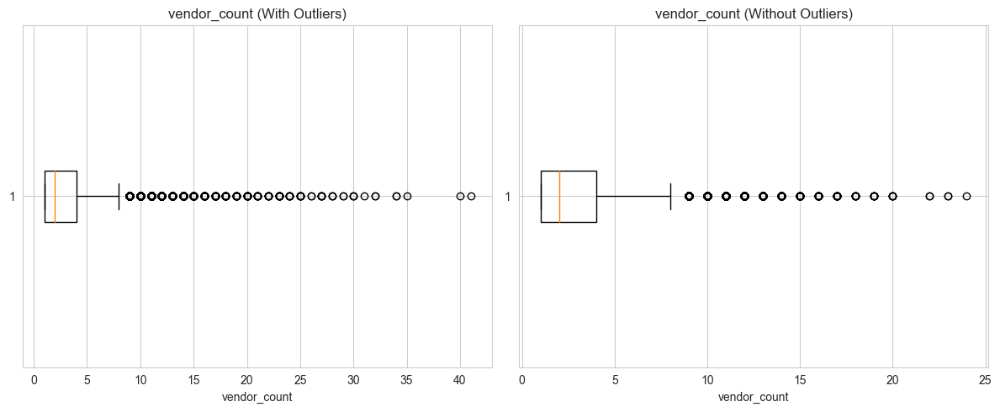

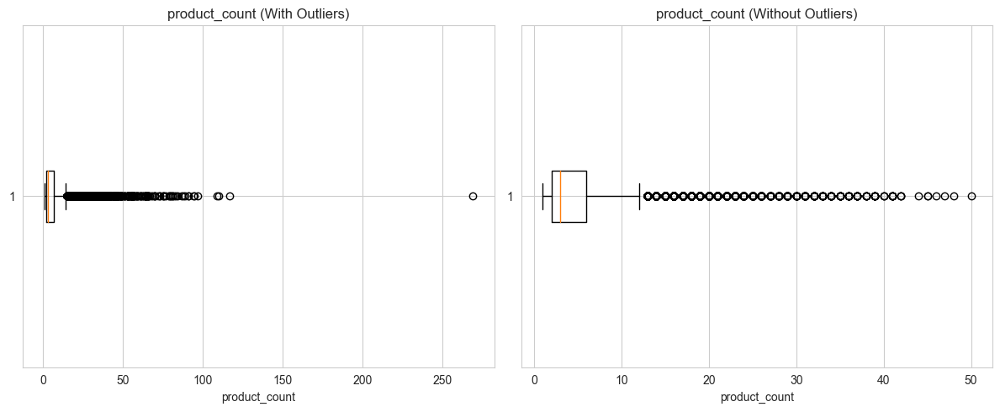

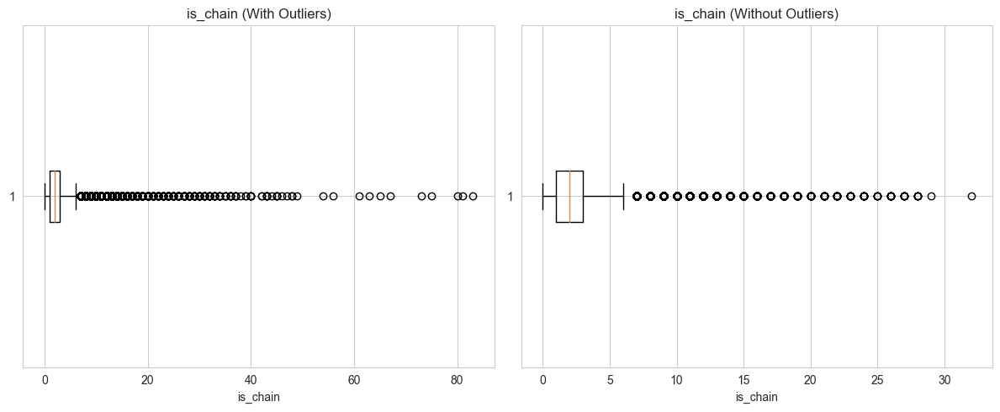

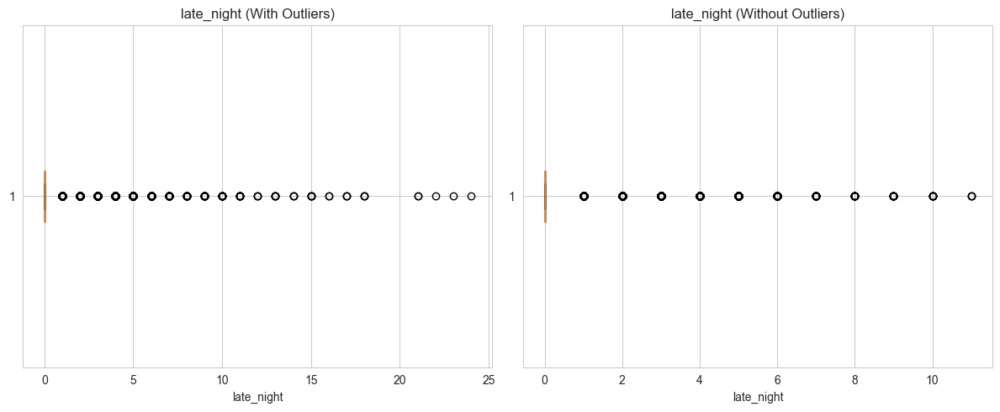

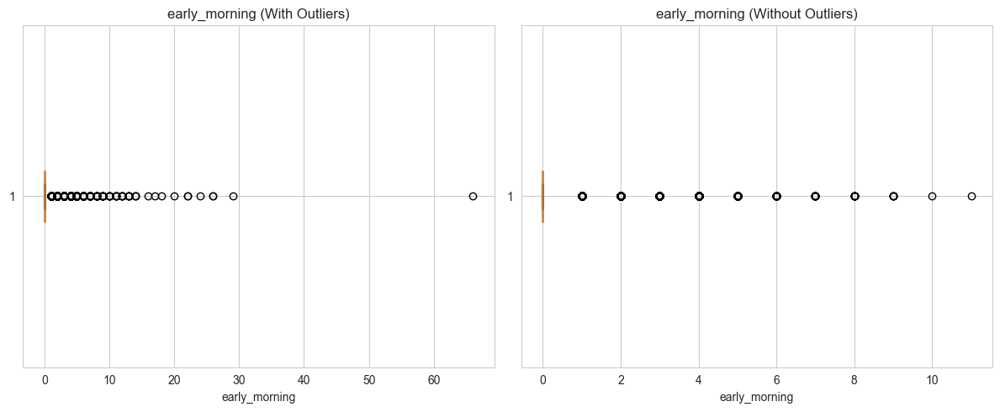

...

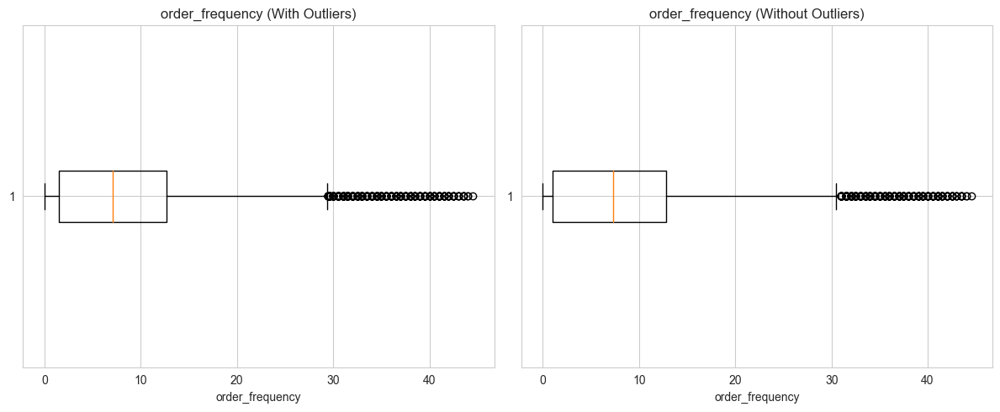

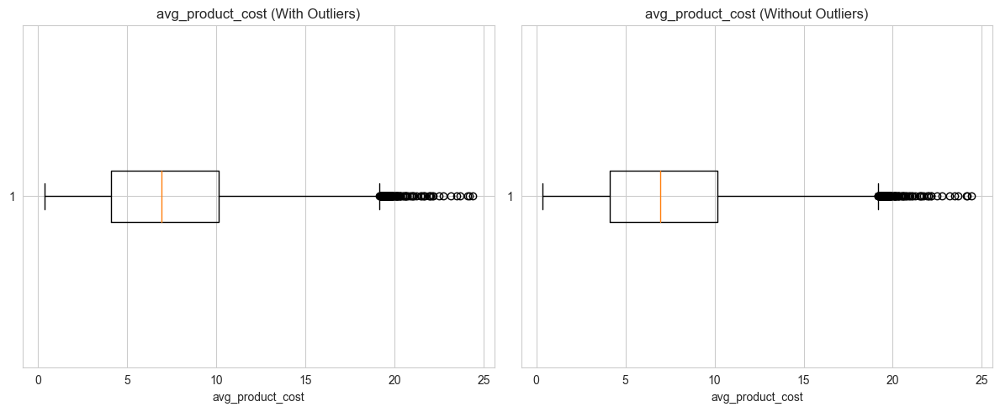

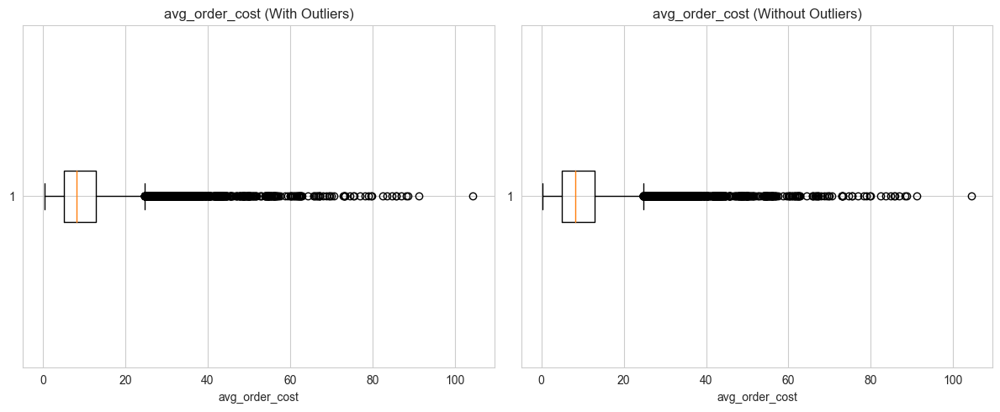

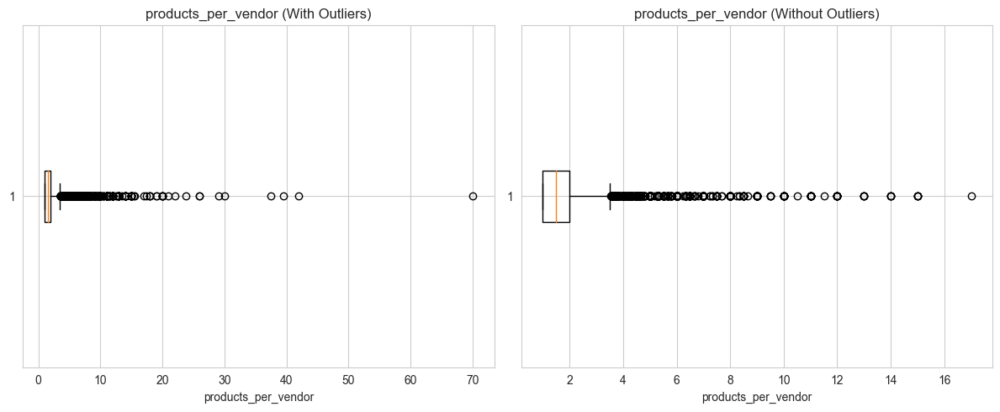

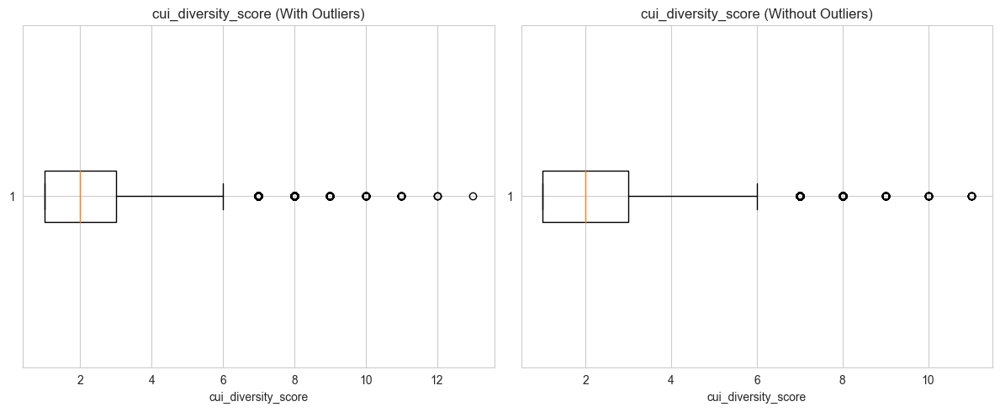

In [167]:
for feature in features_to_treat_num:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Boxplot for data with outliers
    axes[0].boxplot(data_corrected_outliers[feature], vert=False)
    axes[0].set_title(f'{feature} (With Outliers)')
    axes[0].set_xlabel(feature)
    
    # Boxplot for data without outliers
    axes[1].boxplot(data_cleaned_test1_db[feature], vert=False)
    axes[1].set_title(f'{feature} (Without Outliers)')
    axes[1].set_xlabel(feature)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

##### Box plots after outlier removel with the the second set of parameters (DBSCAN).

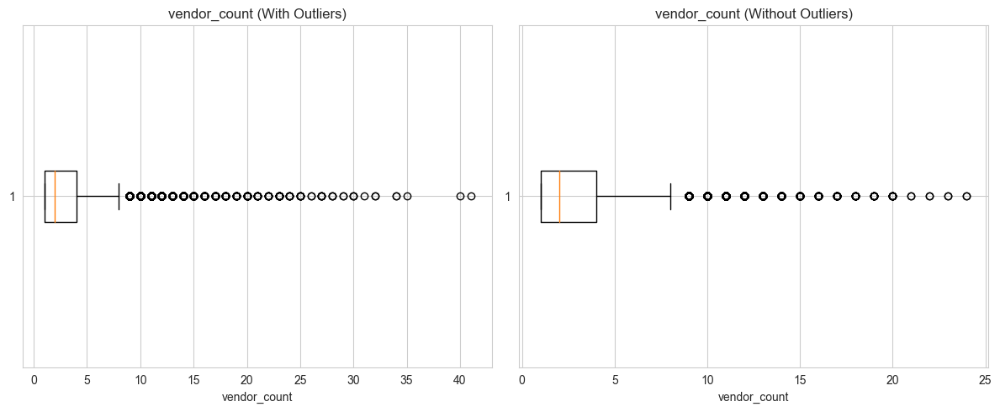

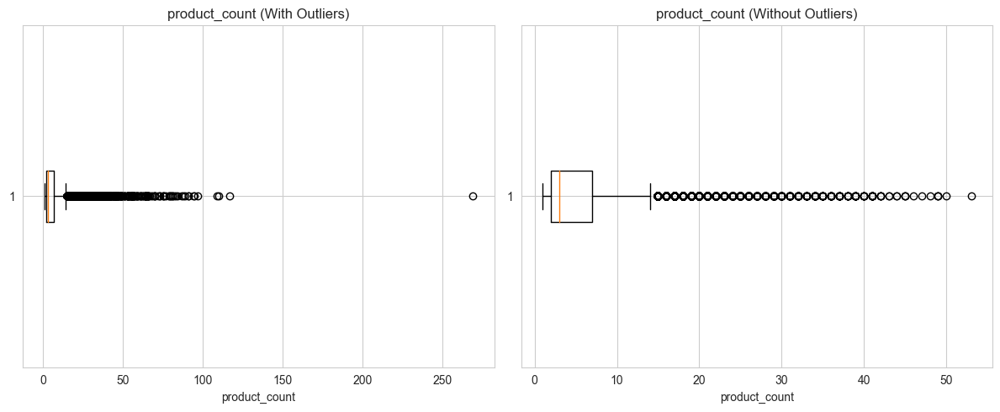

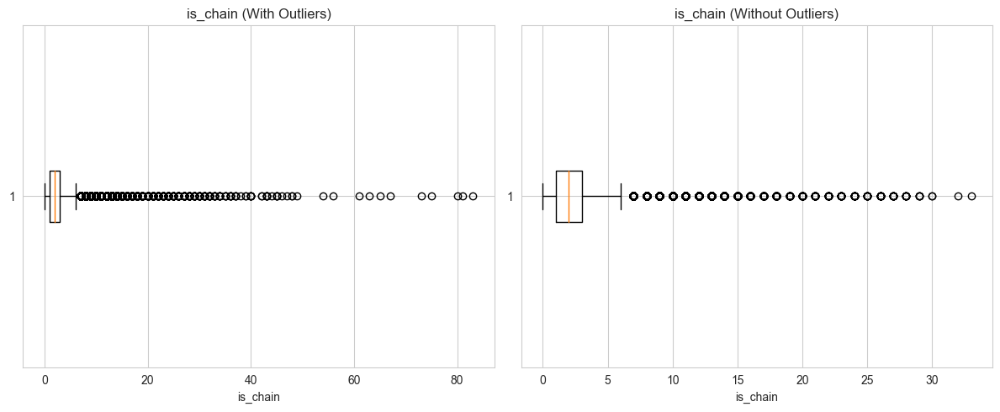

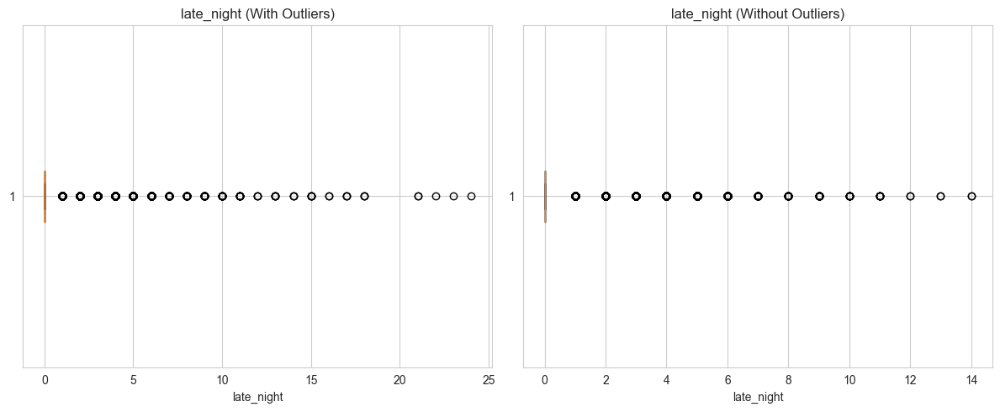

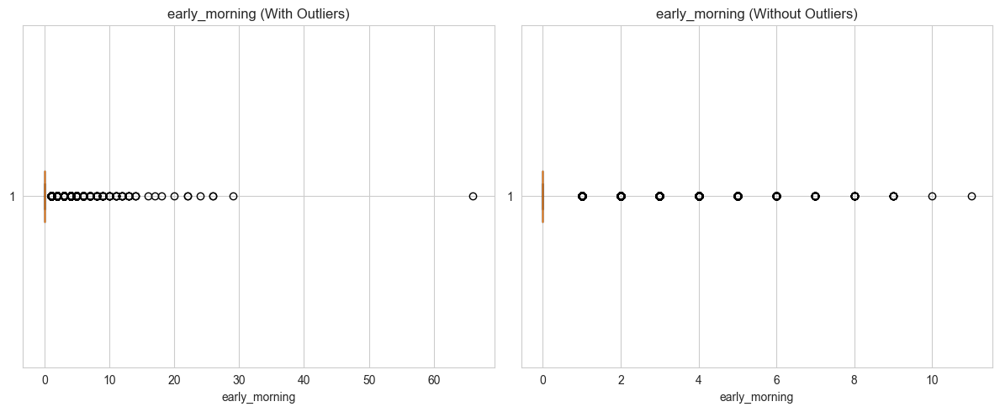

...

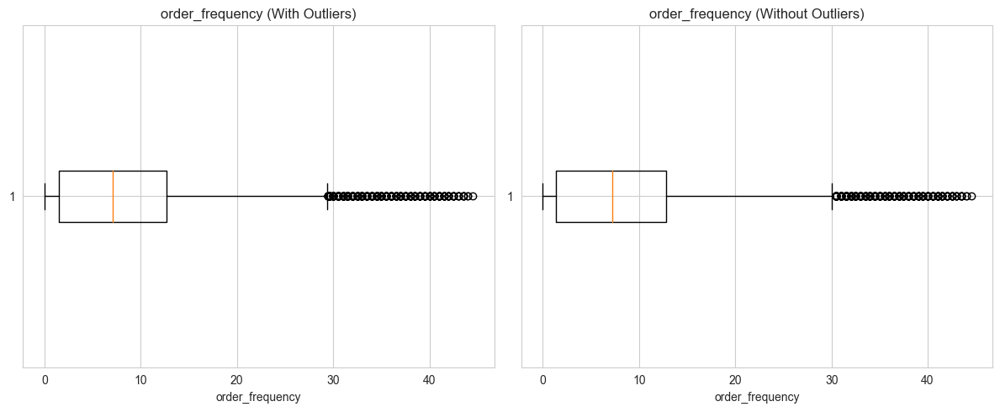

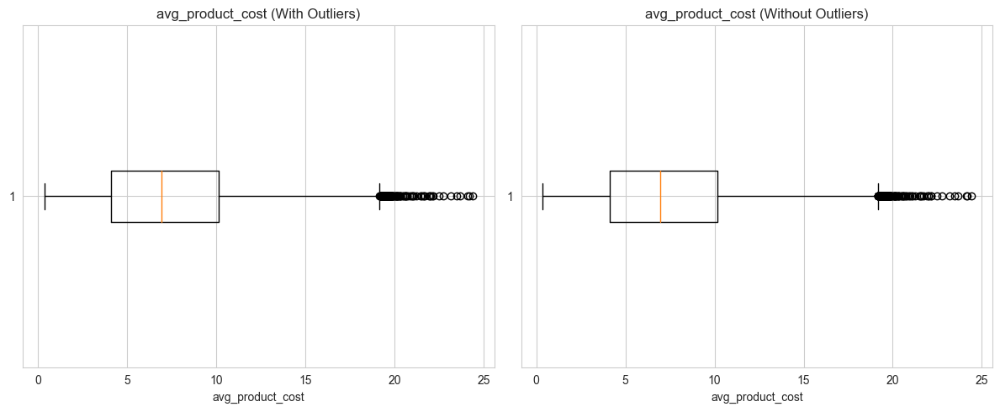

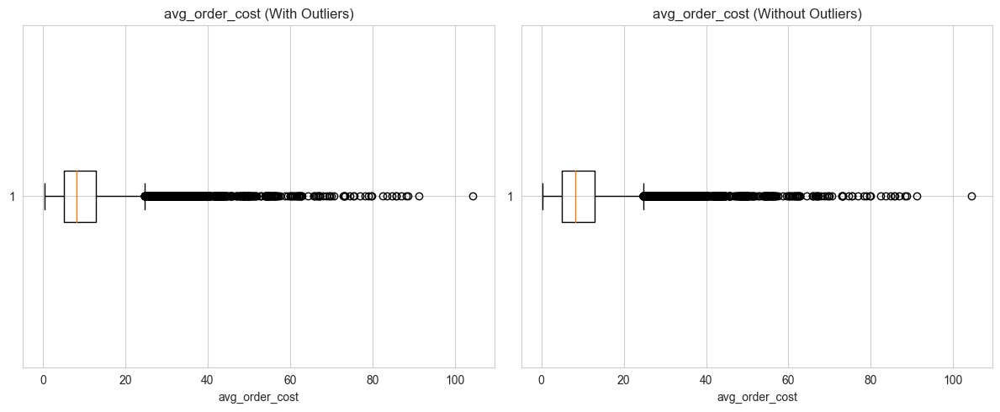

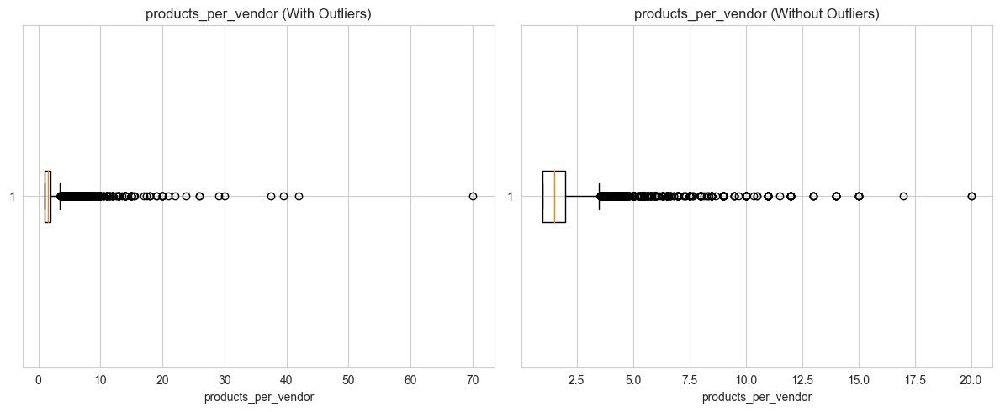

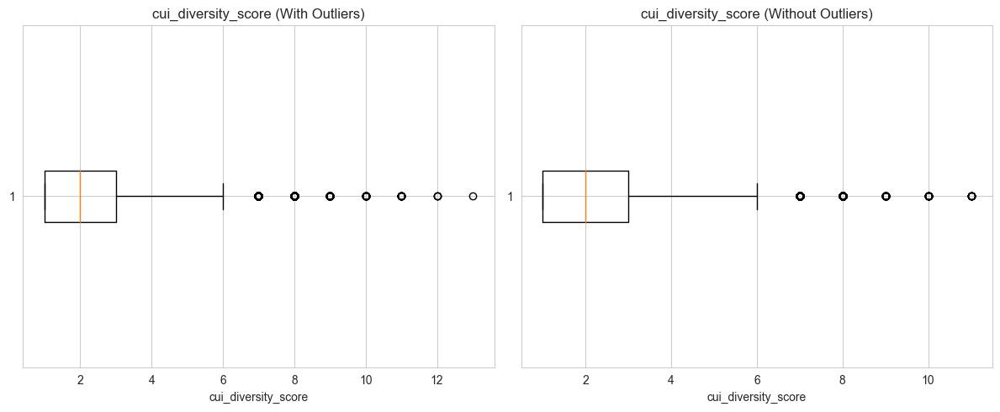

In [168]:
for feature in features_to_treat_num:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Boxplot for data with outliers
    axes[0].boxplot(data_corrected_outliers[feature], vert=False)
    axes[0].set_title(f'{feature} (With Outliers)')
    axes[0].set_xlabel(feature)
    
    # Boxplot for data without outliers
    axes[1].boxplot(data_cleaned_test2_db[feature], vert=False)
    axes[1].set_title(f'{feature} (Without Outliers)')
    axes[1].set_xlabel(feature)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

##### Box plots after outlier removel with the the third set of parameters (DBSCAN).

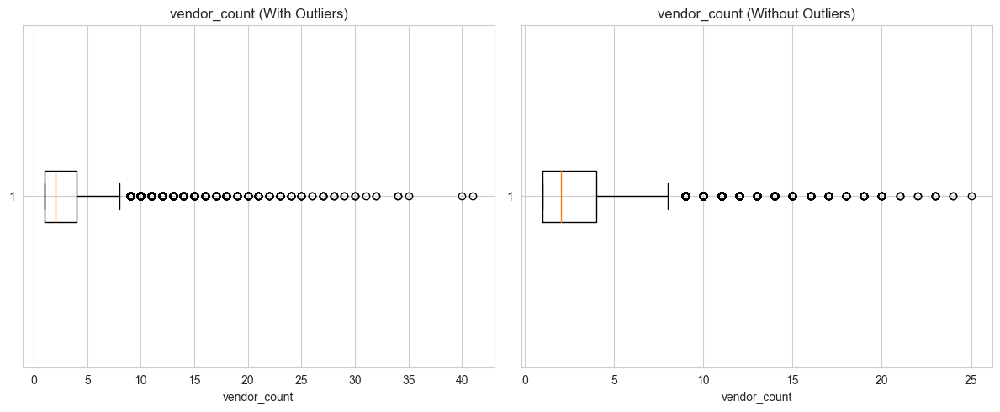

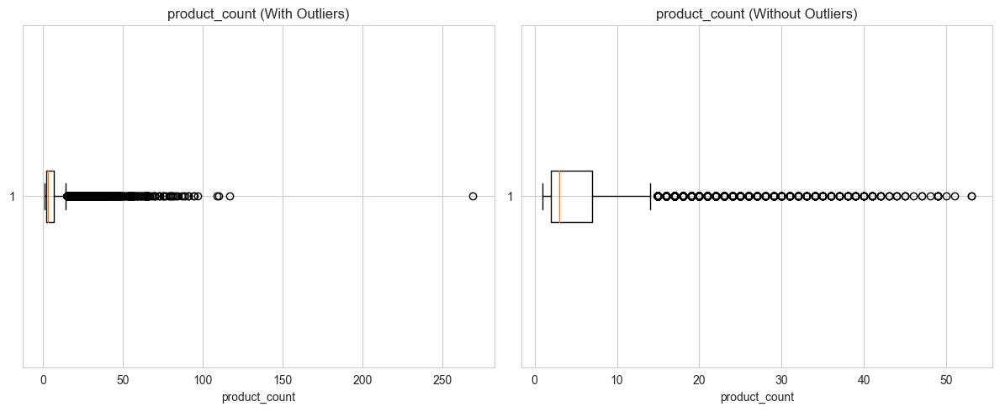

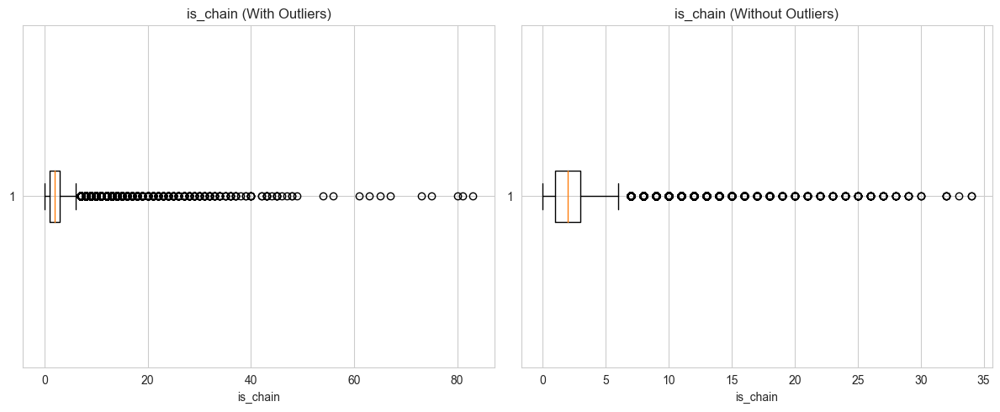

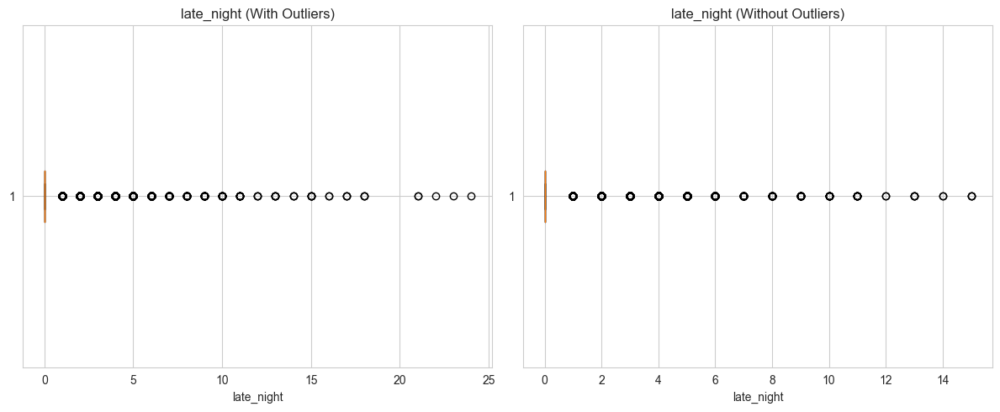

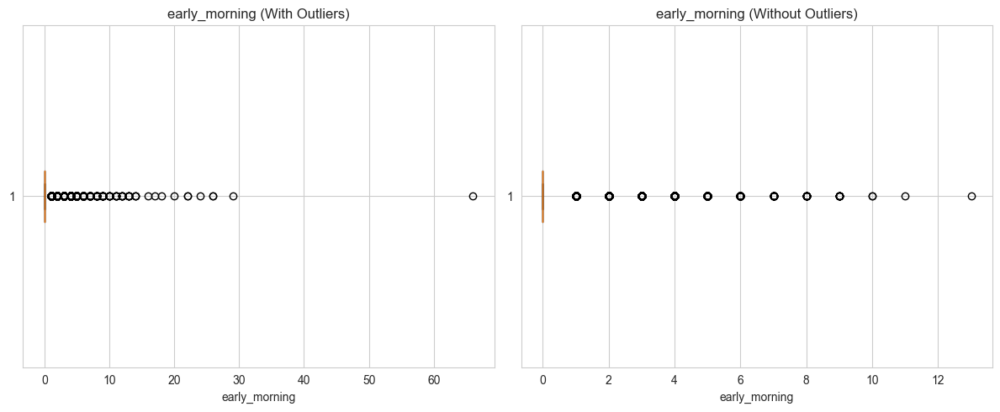

...

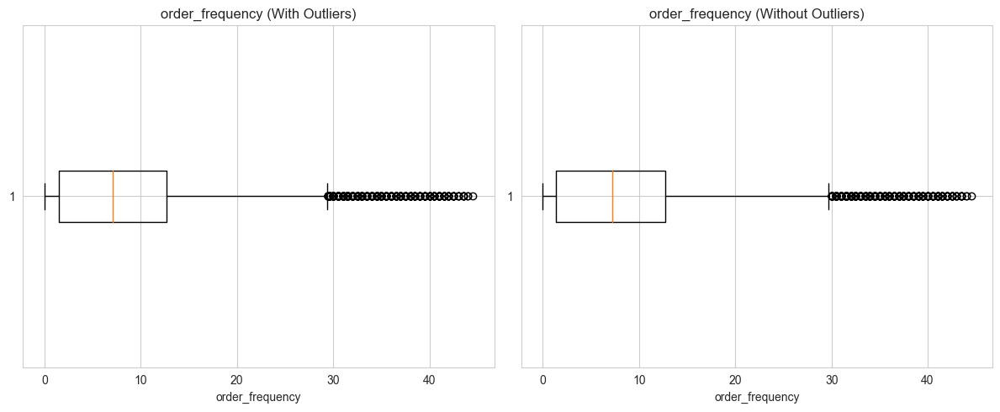

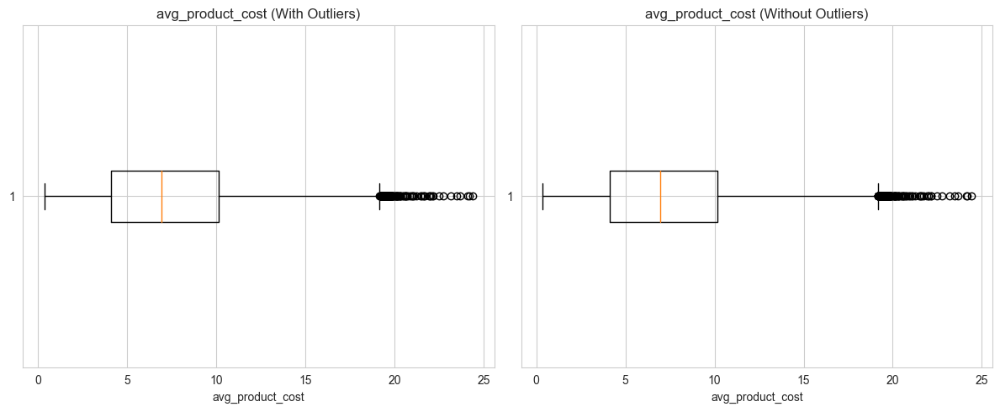

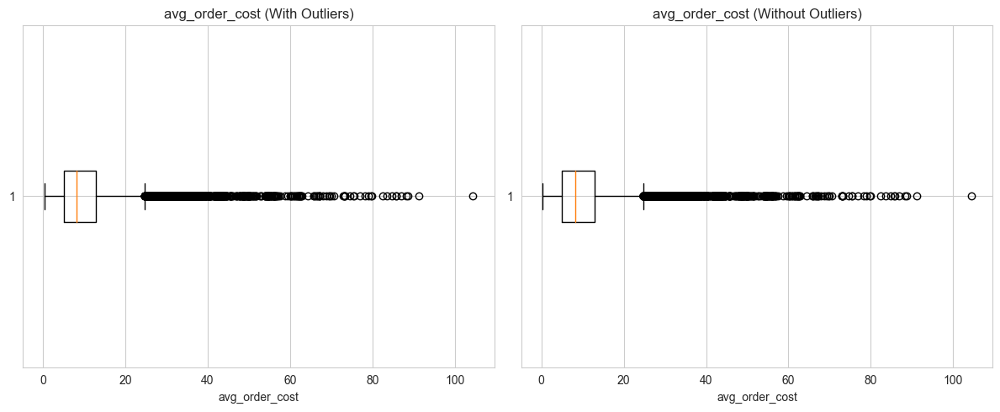

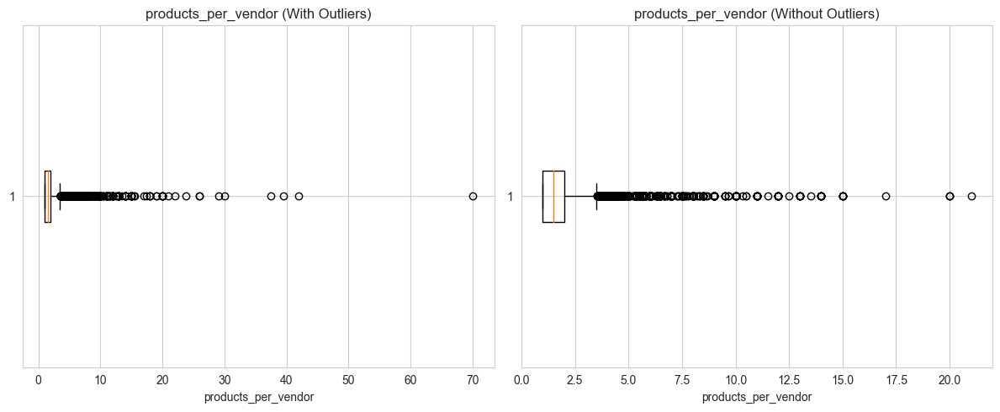

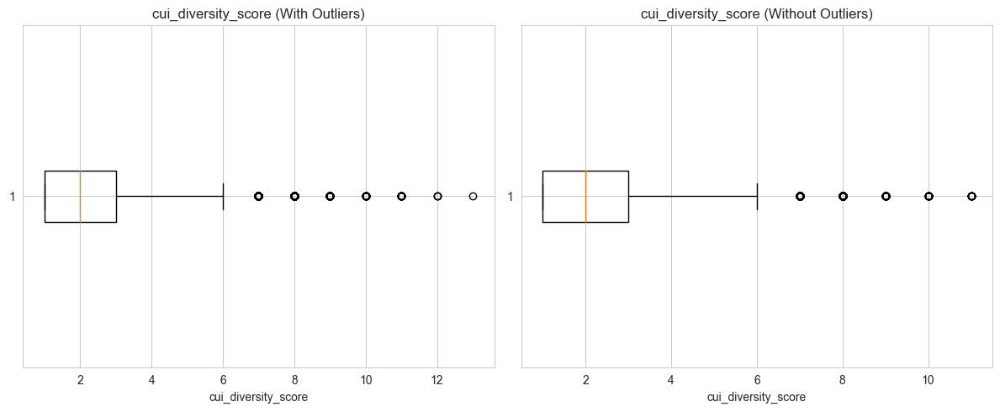

In [169]:
for feature in features_to_treat_num:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Boxplot for data with outliers
    axes[0].boxplot(data_corrected_outliers[feature], vert=False)
    axes[0].set_title(f'{feature} (With Outliers)')
    axes[0].set_xlabel(feature)
    
    # Boxplot for data without outliers
    axes[1].boxplot(data_cleaned_test3_db[feature], vert=False)
    axes[1].set_title(f'{feature} (Without Outliers)')
    axes[1].set_xlabel(feature)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

##### Box plots after outlier removel with the 3 trials of the intersection between dbscan and manual filter.

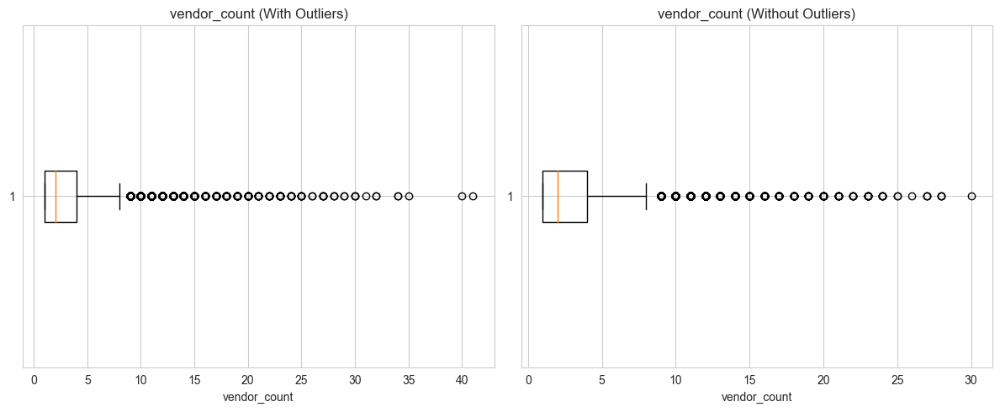

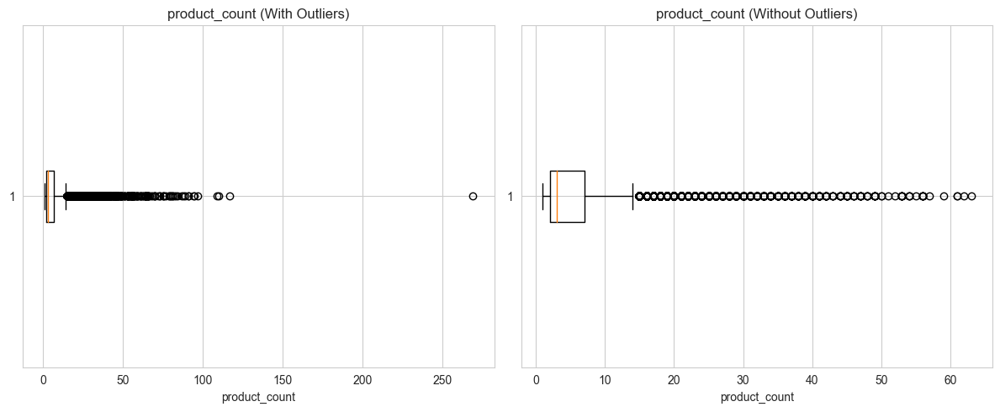

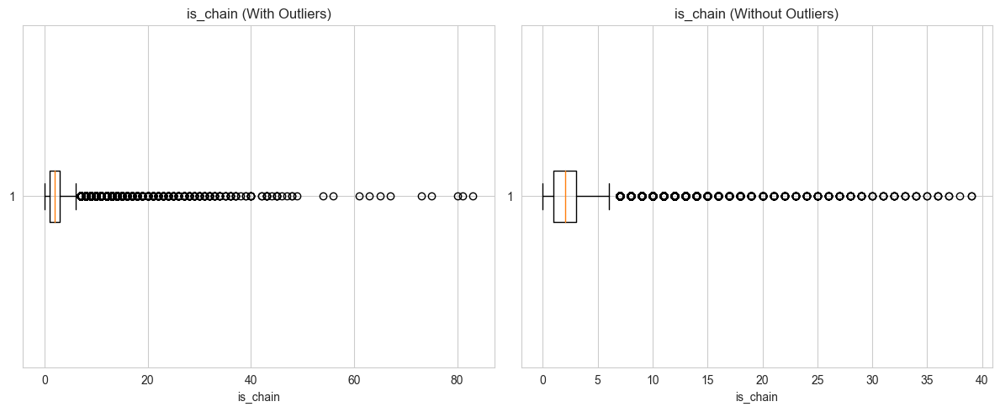

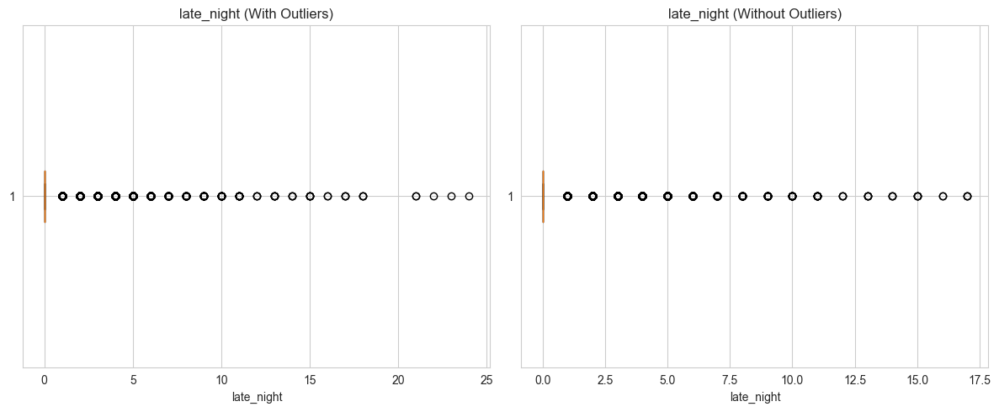

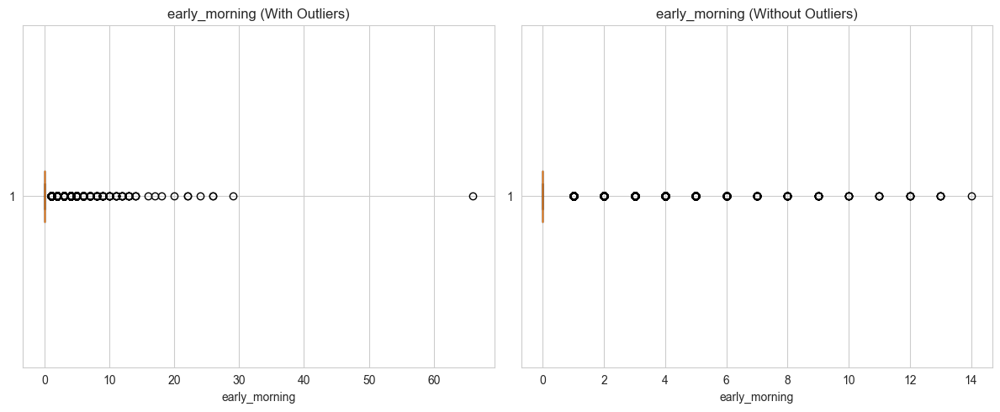

...

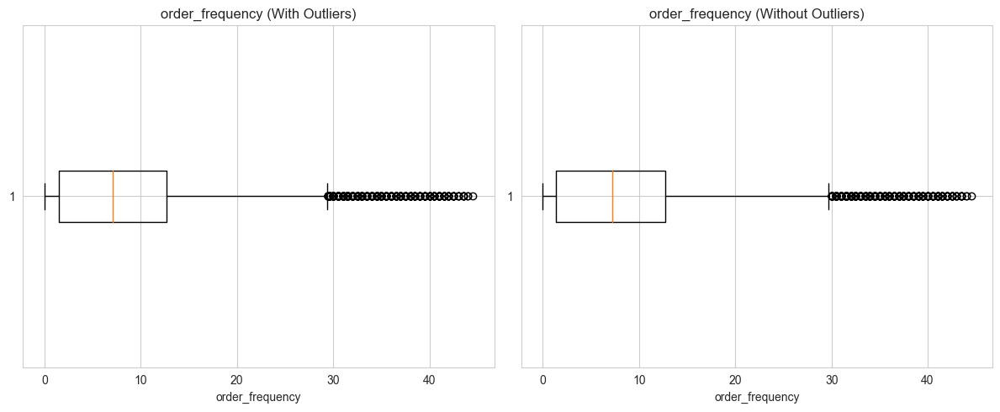

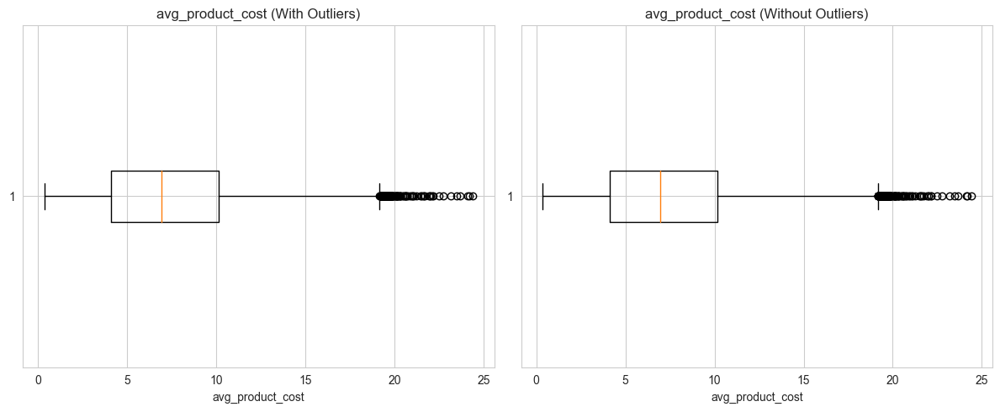

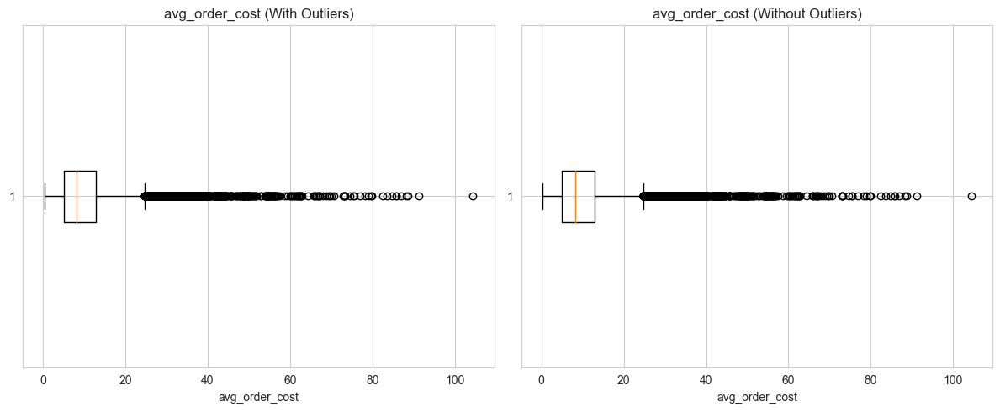

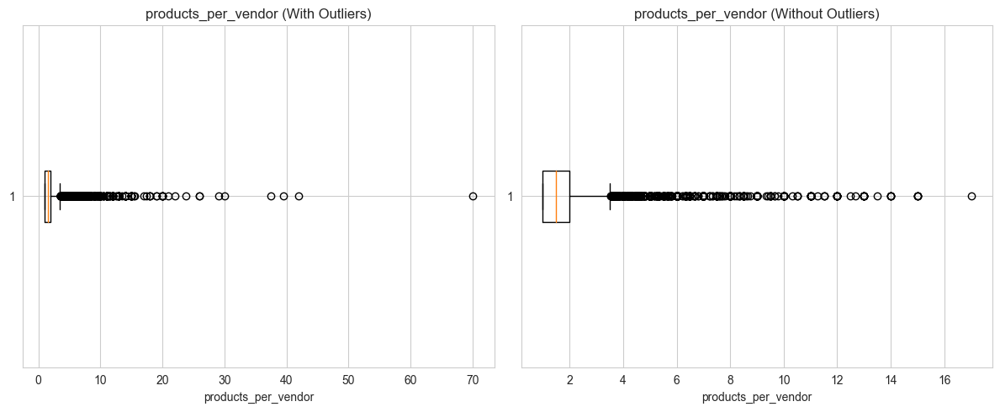

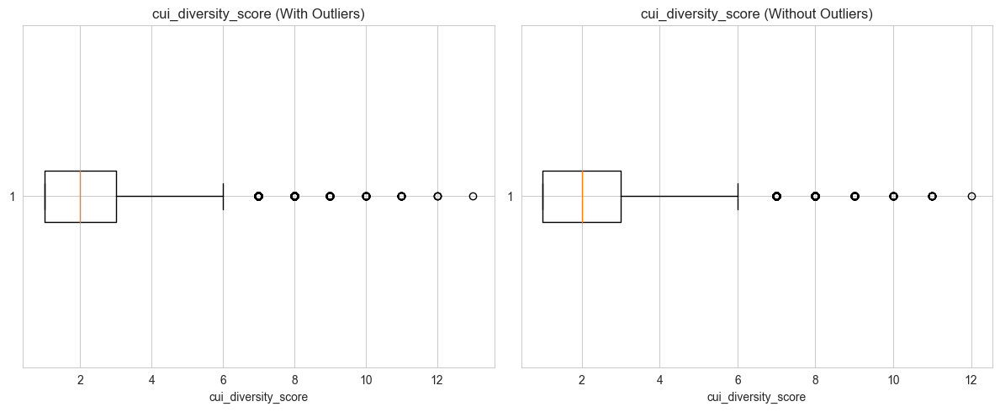

In [170]:
for feature in features_to_treat_num:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Boxplot for data with outliers
    axes[0].boxplot(data_corrected_outliers[feature], vert=False)
    axes[0].set_title(f'{feature} (With Outliers)')
    axes[0].set_xlabel(feature)
    
    # Boxplot for data without outliers
    axes[1].boxplot(data_cleaned_test1[feature], vert=False)
    axes[1].set_title(f'{feature} (Without Outliers)')
    axes[1].set_xlabel(feature)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

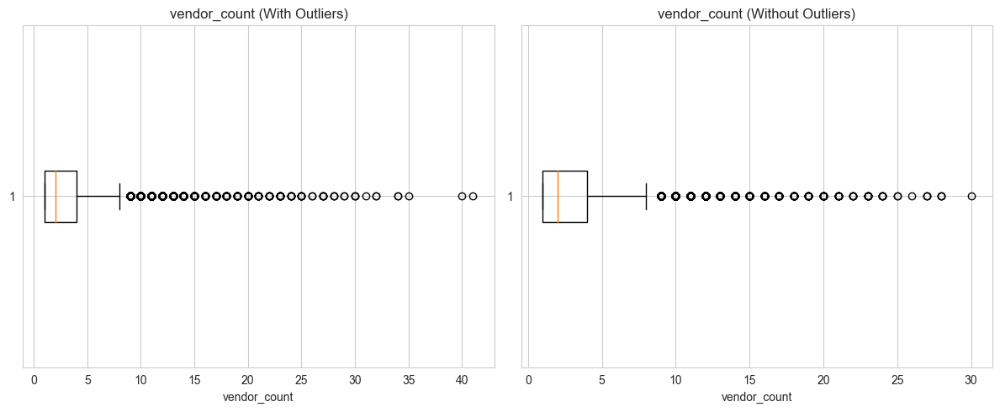

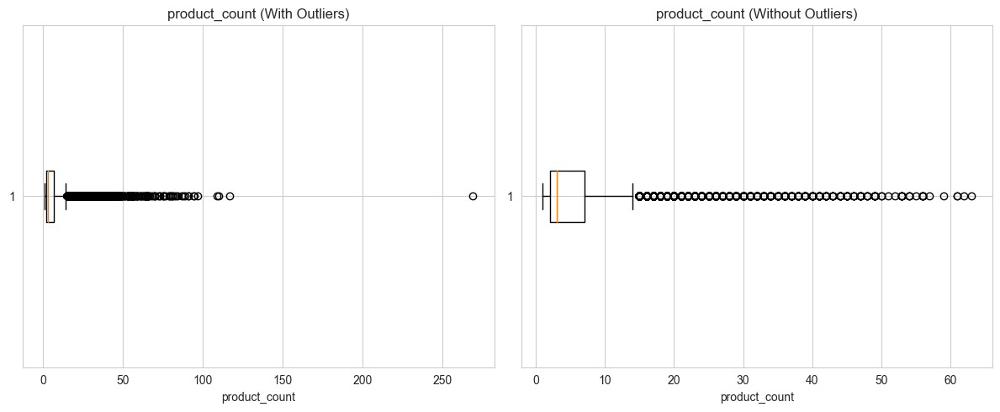

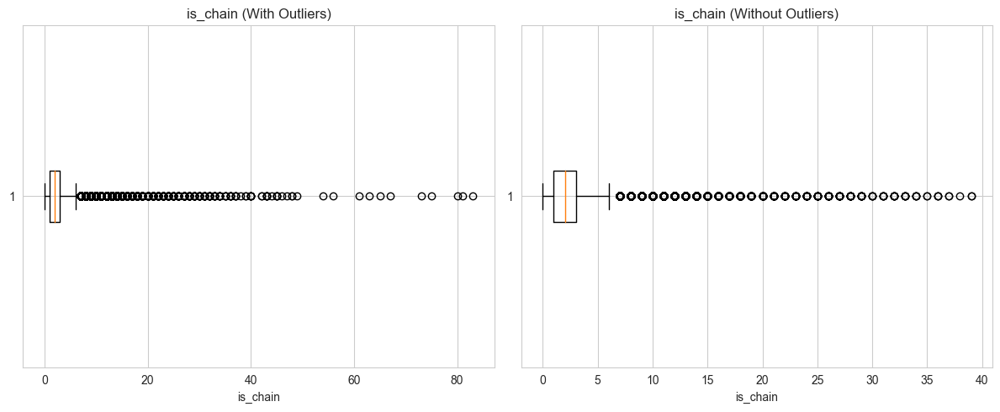

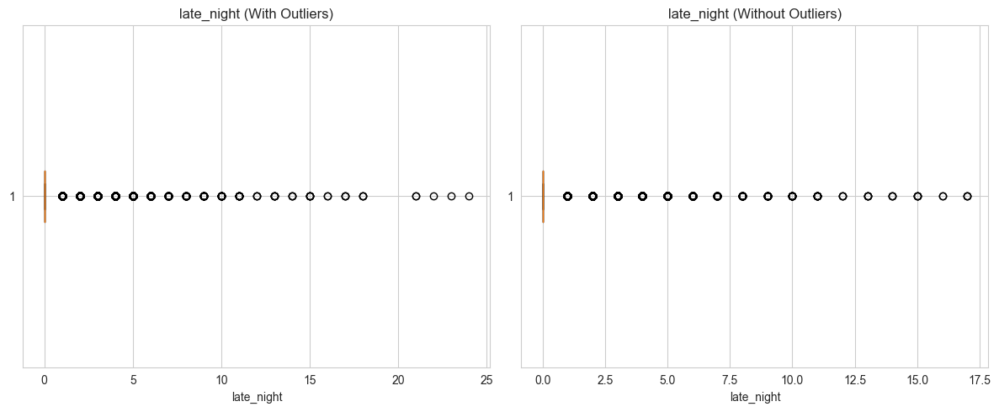

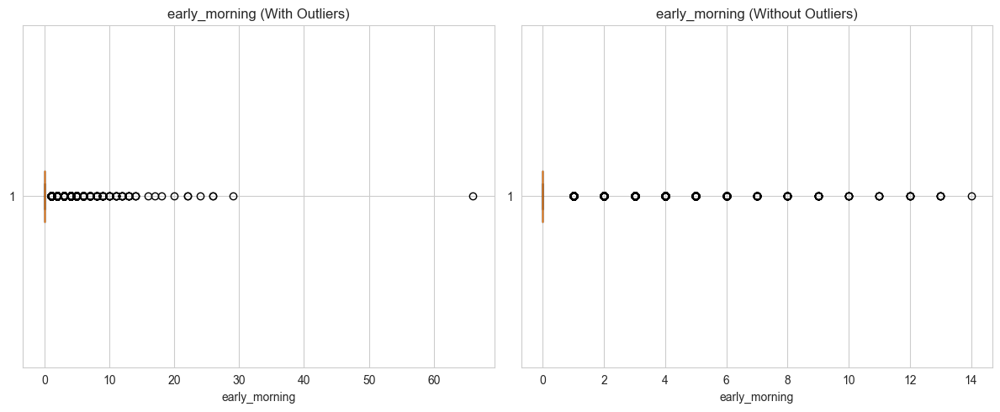

...

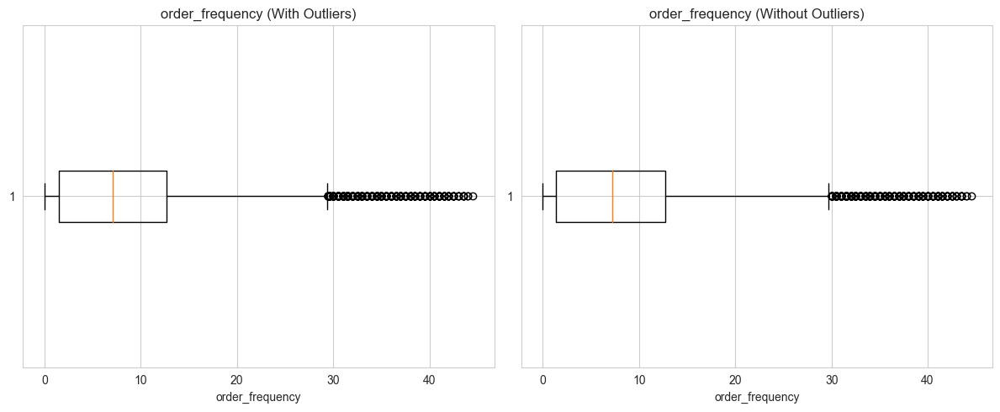

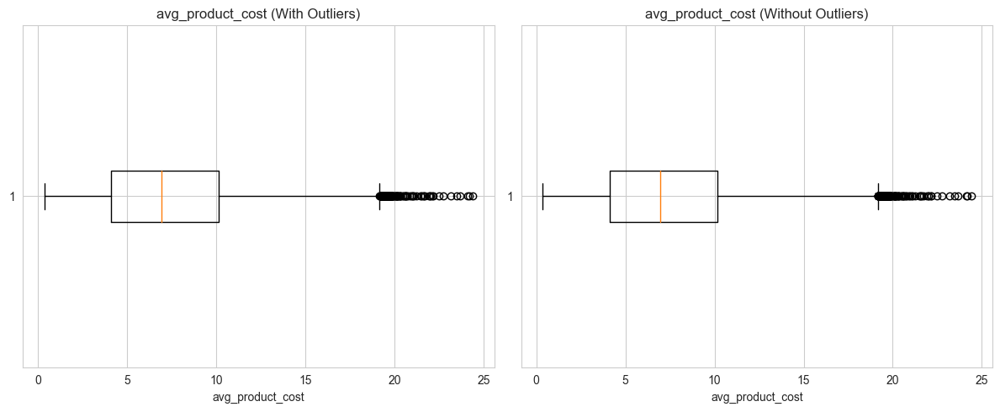

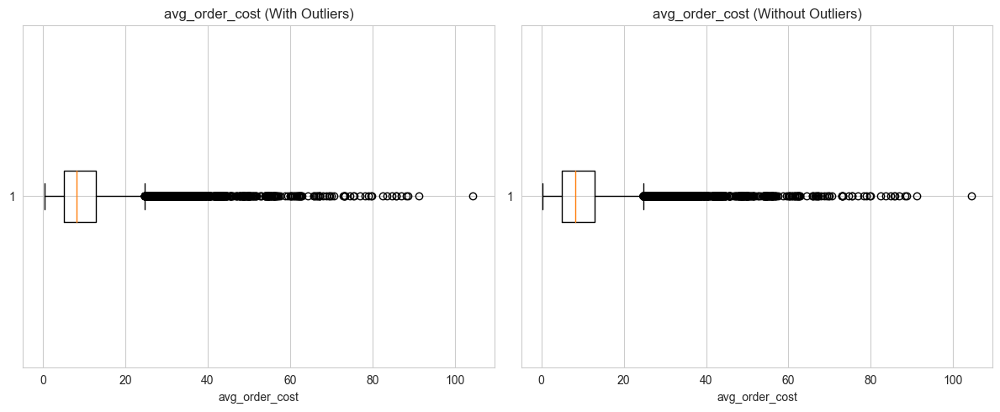

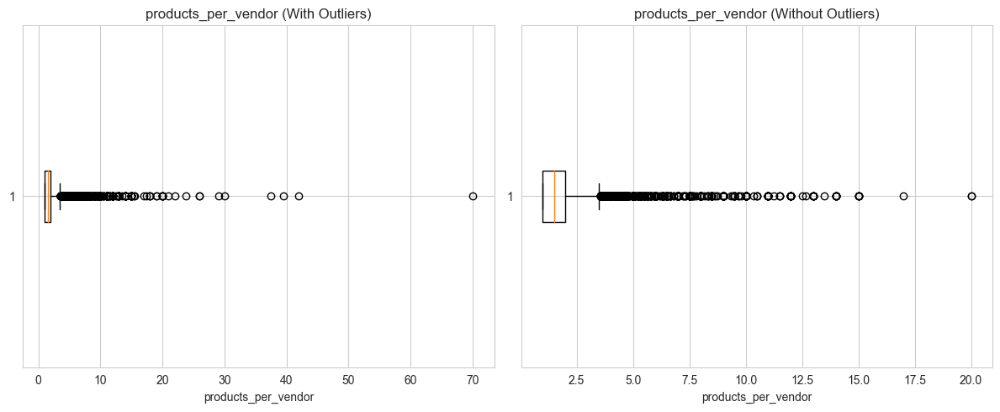

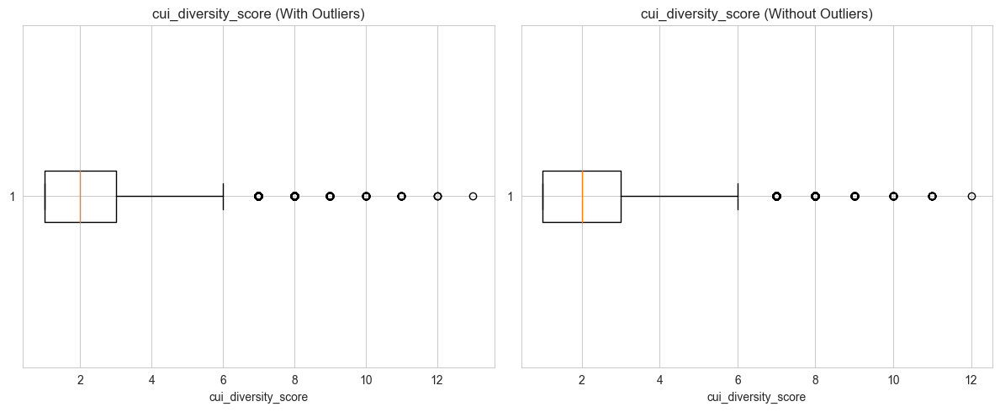

In [171]:
for feature in features_to_treat_num:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Boxplot for data with outliers
    axes[0].boxplot(data_corrected_outliers[feature], vert=False)
    axes[0].set_title(f'{feature} (With Outliers)')
    axes[0].set_xlabel(feature)
    
    # Boxplot for data without outliers
    axes[1].boxplot(data_cleaned_test2[feature], vert=False)
    axes[1].set_title(f'{feature} (Without Outliers)')
    axes[1].set_xlabel(feature)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

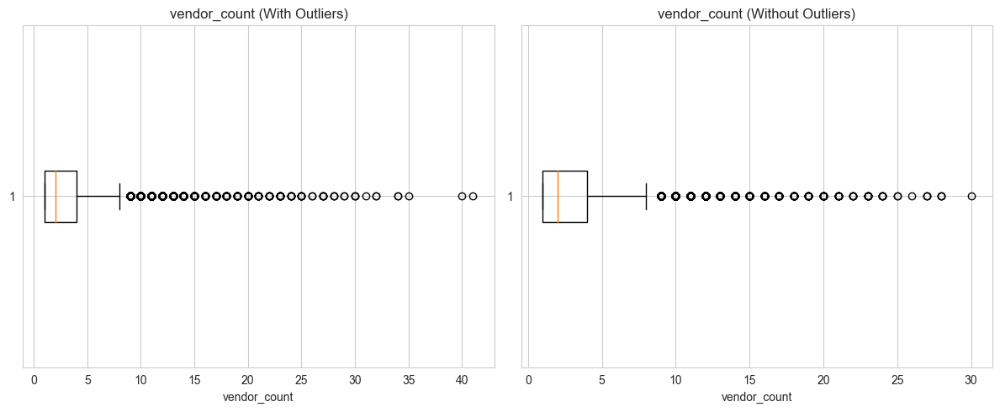

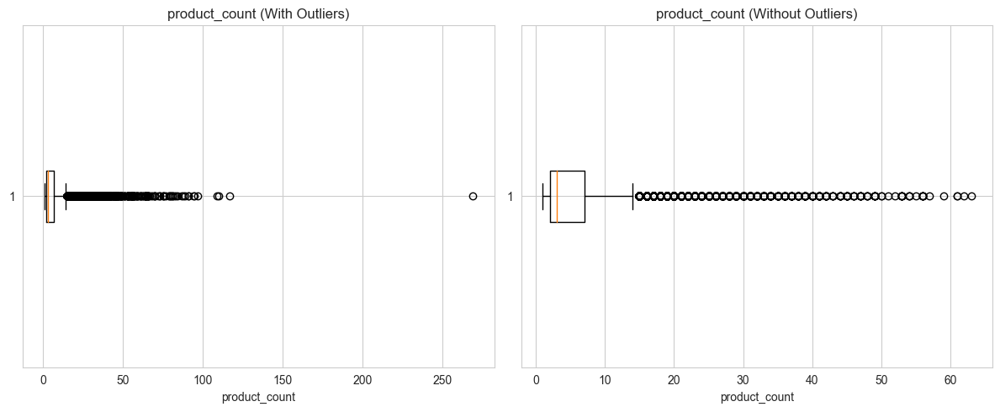

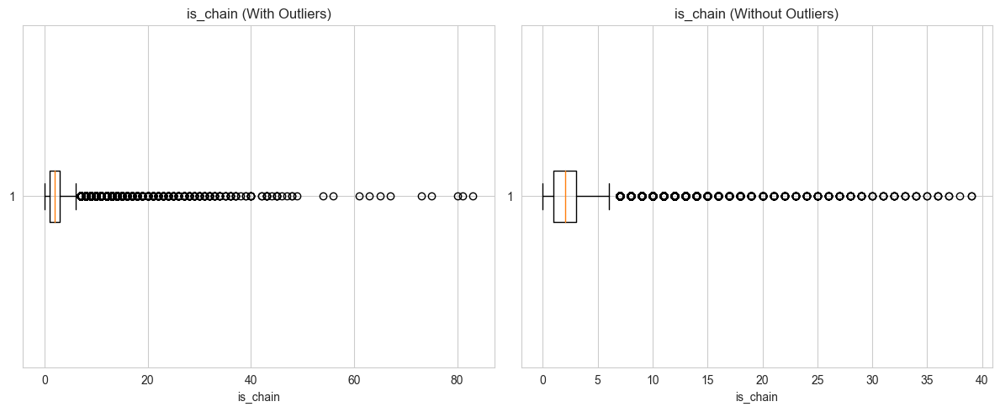

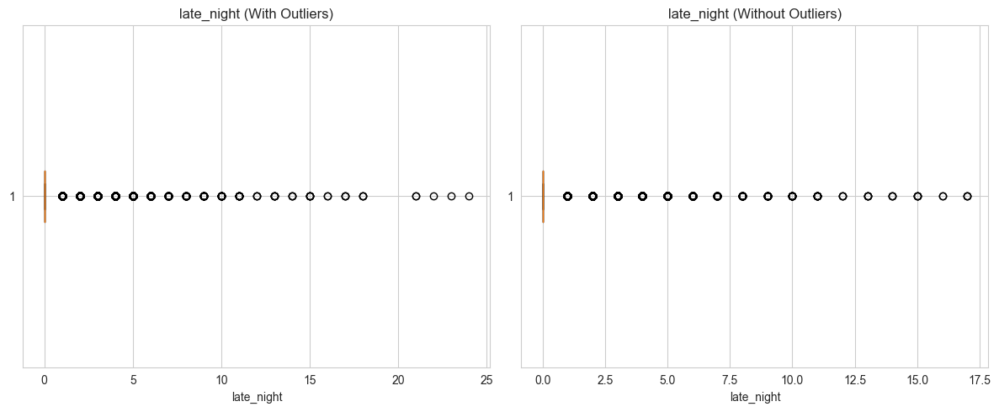

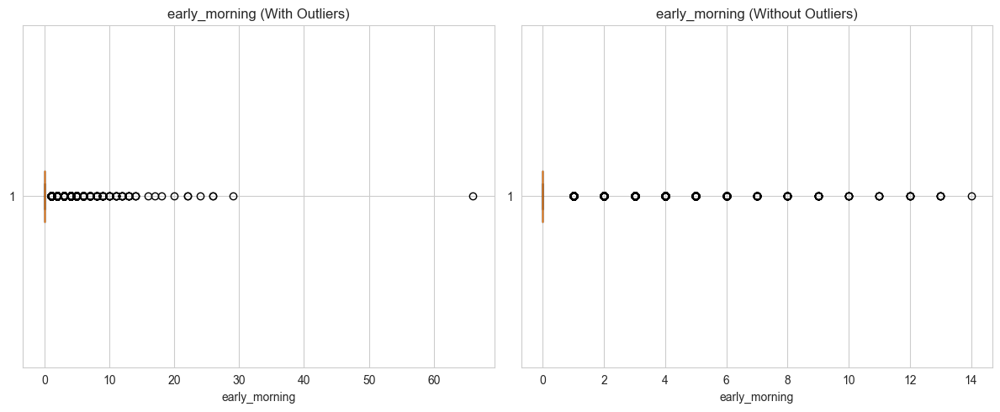

...

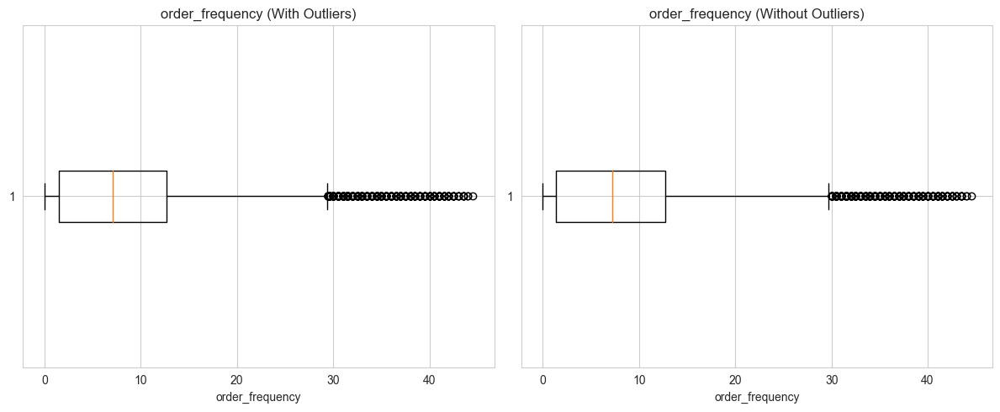

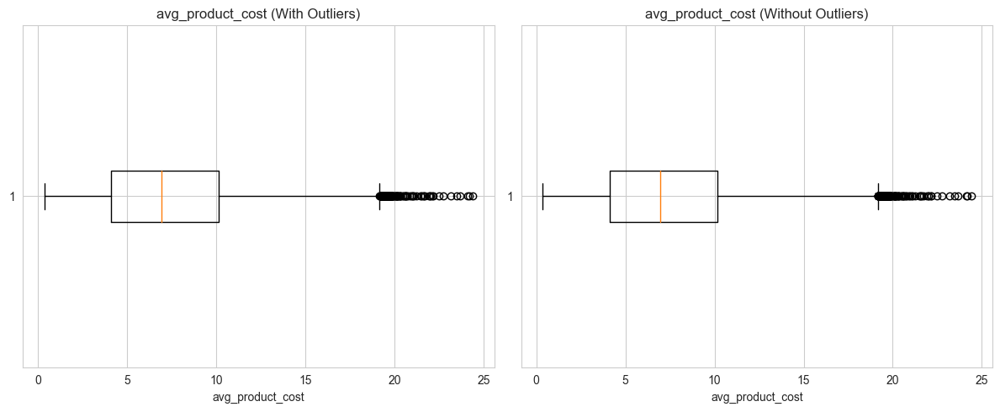

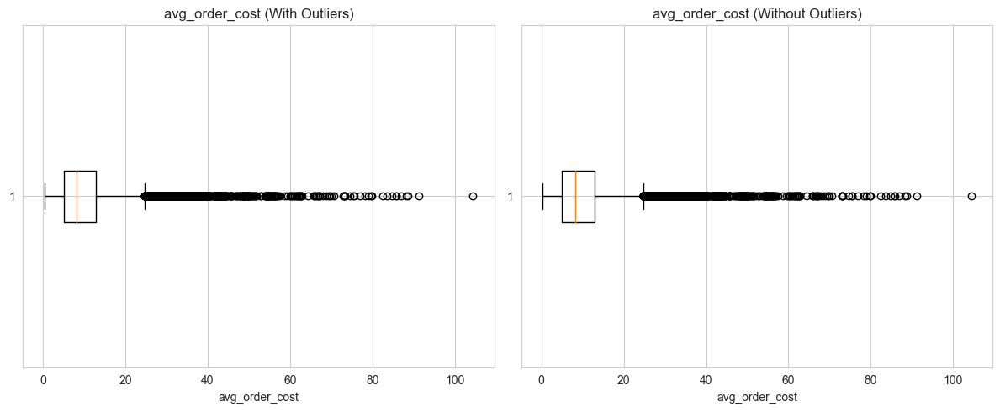

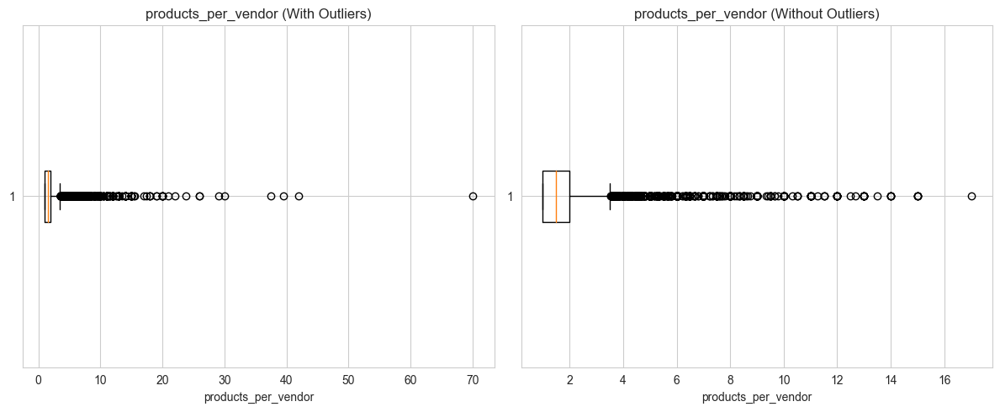

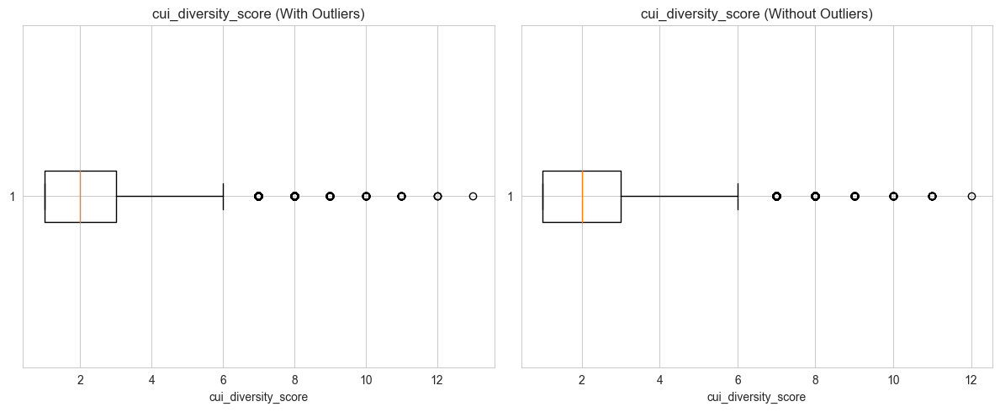

In [172]:
for feature in features_to_treat_num:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Boxplot for data with outliers
    axes[0].boxplot(data_corrected_outliers[feature], vert=False)
    axes[0].set_title(f'{feature} (With Outliers)')
    axes[0].set_xlabel(feature)
    
    # Boxplot for data without outliers
    axes[1].boxplot(data_cleaned_test3[feature], vert=False)
    axes[1].set_title(f'{feature} (Without Outliers)')
    axes[1].set_xlabel(feature)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

#### Final solution for outlier removal

After analyzing the 3 dbscan solutions, we conclude that the first solution (parameters: eps_test1=3, min_samples_test1 = 12) gives us the best solution. However, we still applied another set of manual filters, to remove some outliers that have not been identified by the dbscan.

In [173]:
data_cleaned_test1_db_manual = data_cleaned_test1_db.copy()

In [174]:
data_cleaned_scaled_test1_db_manual =data_cleaned_scaled_test1_db.copy()

Manual filter to apply after the removal with dbscan

In [175]:
filters_man_dbscan = (
    (data_cleaned_test1_db_manual['product_count'] < 21)
    & (data_cleaned_test1_db_manual['midday'] < 17)
    & (data_cleaned_test1_db_manual['afternoon_evening'] < 24)
    & (data_cleaned_test1_db_manual['total_spending'] < 400)
    & (data_cleaned_test1_db_manual['avg_order_cost'] < 80)
    & (data_cleaned_test1_db_manual['products_per_vendor'] < 10.5)
)

In [176]:
filtered_indices_db = data_cleaned_test1_db_manual[filters_man_dbscan].index

data_cleaned_test1_db_manual = data_cleaned_test1_db_manual.loc[filtered_indices_db]
data_cleaned_scaled_test1_db_manual = data_cleaned_scaled_test1_db_manual.loc[filtered_indices_db]

In [177]:
outlier_dataset = data_corrected_outliers[~data_corrected_outliers.index.isin(data_cleaned_scaled_test1_db_manual.index)]
outlier_dataset

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,...,broader_region,order_frequency,order_span,avg_product_cost,avg_order_cost,products_per_vendor,cui_diversity_score,prefered_cuisine,dow_diversity_score,hr_diversity_score
customer_id,,,,,,,,,,,,,,,,,,,,,
d5cbe9cd02,2360,31.00,7,26,12,0.00,25,DELIVERY,CARD,0.00,...,2,1.56,25.00,3.73,6.06,3.71,5,CUI_Chinese,5,11
9c5d8d6747,2360,27.00,5,32,23,0.00,28,FREEBIE,CASH,0.00,...,2,1.22,28.00,4.09,5.69,6.40,3,CUI_Japanese,6,7
4d43db4f0a,2360,34.00,5,28,20,0.00,42,NO PROMO,CARD,84.40,...,2,2.00,42.00,3.91,5.22,5.60,3,CUI_American,6,8
7b0661a6ba,2360,30.00,1,19,14,0.00,43,FREEBIE,CARD,0.00,...,2,3.07,43.00,2.68,3.63,19.00,1,CUI_Indian,6,7
d6e5be6382,4660,36.00,8,25,6,0.00,49,NO PROMO,DIGI,83.04,...,4,2.33,49.00,4.18,4.97,3.12,3,CUI_American,6,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
c80631c1a4,2360,25.00,1,14,8,60.00,70,NO PROMO,CARD,0.00,...,2,1.25,10.00,4.22,7.39,14.00,1,CUI_Beverages,6,3
4735d7d1ef,8670,28.00,1,5,0,62.00,62,DELIVERY,DIGI,0.00,...,8,0.00,0.00,16.96,84.81,5.00,1,CUI_Street Food / Snacks,1,1
7ed46af927,4660,25.00,8,29,10,64.00,89,DISCOUNT,CASH,0.00,...,4,1.25,25.00,6.79,9.85,3.62,5,CUI_Cafe,7,6


In [178]:
data_cleaned_test1_db_manual[features_to_treat_num].describe().T

,count,mean,std,min,25%,50%,75%,max
vendor_count,30420.00,2.80,2.03,1.00,1.00,2.00,4.00,16.00
product_count,30420.00,4.68,3.91,1.00,2.00,3.00,6.00,20.00
is_chain,30420.00,2.35,2.49,0.00,1.00,2.00,3.00,19.00
late_night,30420.00,0.35,0.91,0.00,0.00,0.00,0.00,11.00
early_morning,30420.00,0.31,0.77,0.00,0.00,0.00,0.00,11.00
morning,30420.00,1.03,1.52,0.00,0.00,1.00,1.00,17.00
midday,30420.00,0.61,1.05,0.00,0.00,0.00,1.00,13.00
afternoon_evening,30420.00,1.11,1.67,0.00,0.00,0.00,2.00,19.00
night,30420.00,0.25,0.73,0.00,0.00,0.00,0.00,10.00
DOW_0,30420.00,0.46,0.77,0.00,0.00,0.00,1.00,7.00


In [179]:
outlier_dataset[features_to_treat_num].describe().T

,count,mean,std,min,25%,50%,75%,max
vendor_count,1252.00,10.76,5.77,1.00,7.00,10.00,14.00,41.00
product_count,1252.00,30.30,15.01,5.00,22.00,26.00,34.00,269.00
is_chain,1252.00,14.52,10.44,0.00,8.00,13.00,19.00,83.00
late_night,1252.00,1.32,3.22,0.00,0.00,0.00,1.00,24.00
early_morning,1252.00,1.69,3.55,0.00,0.00,0.00,2.00,66.00
morning,1252.00,6.88,6.15,0.00,2.00,6.00,10.00,49.00
midday,1252.00,3.67,3.81,0.00,1.00,3.00,5.00,37.00
afternoon_evening,1252.00,6.82,6.29,0.00,2.00,6.00,10.00,49.00
night,1252.00,1.67,3.17,0.00,0.00,0.00,2.00,43.00
DOW_0,1252.00,3.01,2.31,0.00,1.00,3.00,4.00,16.00


The outliers dataset has very different key statistics when compared with the cleaned dataset. Extreme values were clearly removed.

#### Rescaling the data

We need to rescale the data to mitigate the impact of outliers and ensure a more robust scaling. This will likely lead to better cluster solutions.

In [180]:
scaler = StandardScaler()

data_cleaned_scaled_test1_db_manual = pd.DataFrame(scaler.fit_transform(data_cleaned_test1_db_manual[numeric_features]), columns=numeric_features)
outlier_dataset_scaled = pd.DataFrame(scaler.transform(outlier_dataset[numeric_features]), columns=numeric_features)


In [181]:
data_cleaned_scaled_test1_db_manual.set_index(data_cleaned_test1_db_manual.index, inplace=True)

In [182]:
outlier_dataset_scaled.set_index(outlier_dataset.index, inplace=True)

In [183]:
len(data_cleaned_test1_db_manual)/len(data_corrected_outliers)

0.9604698156100026

We keep 96% of the dataset with our outlier treatment methods

##### Box plots for the final outlier treatment solution

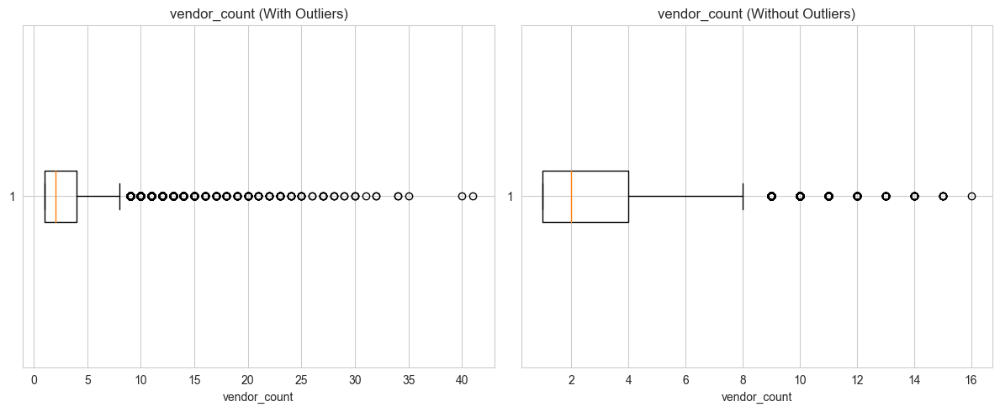

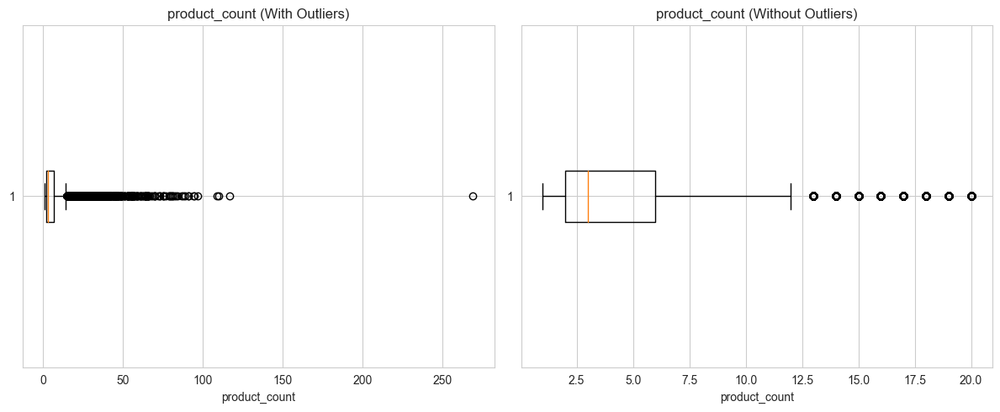

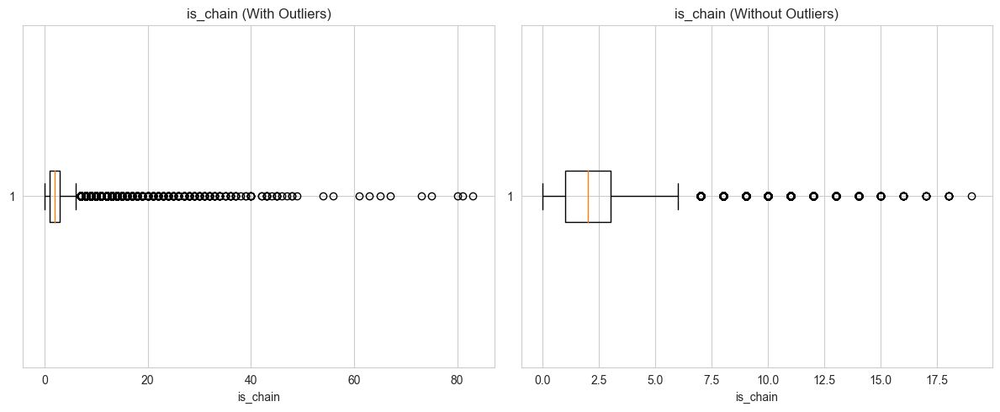

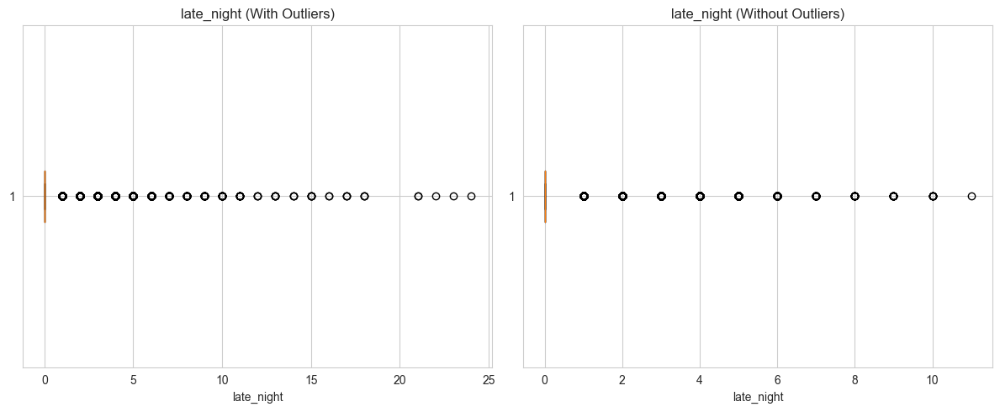

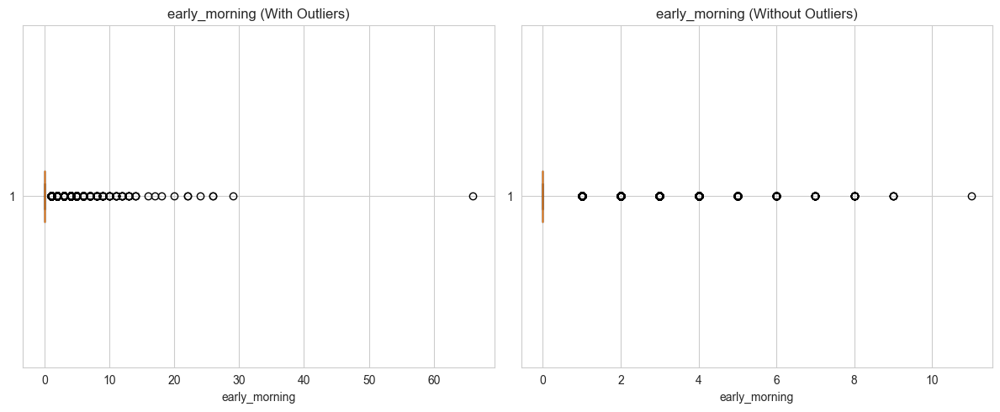

...

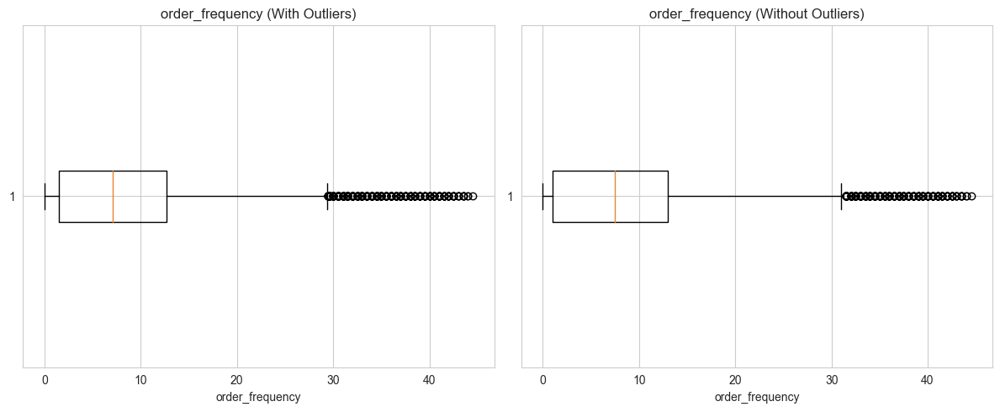

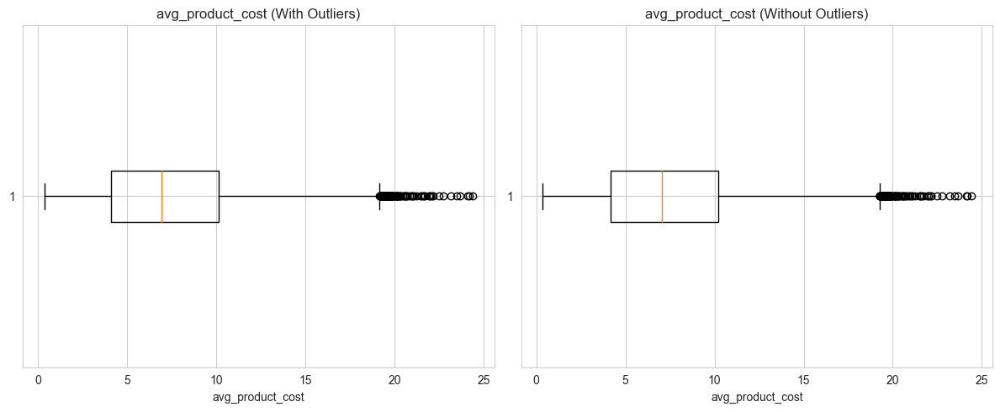

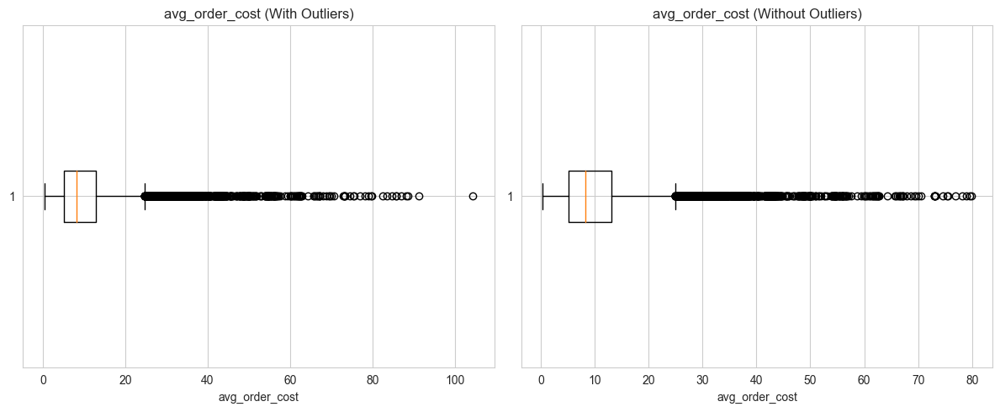

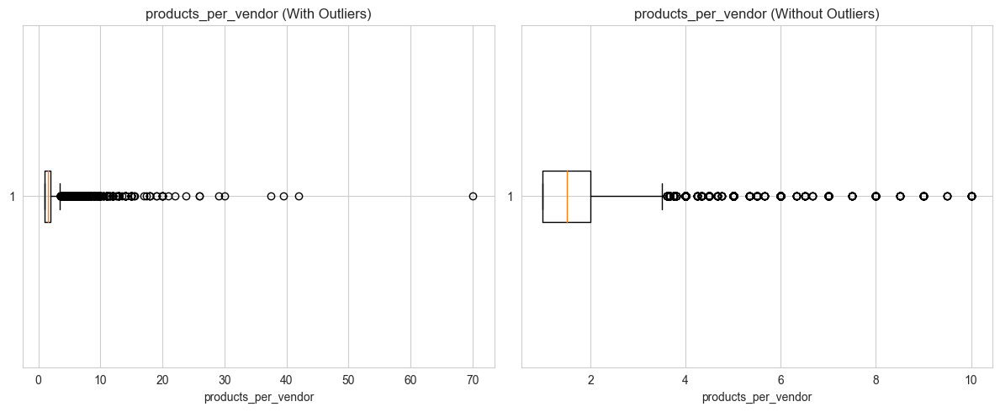

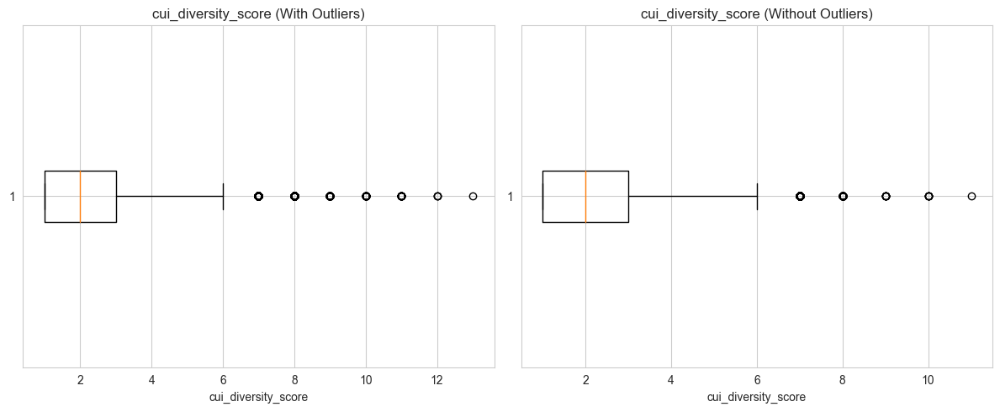

In [184]:
for feature in features_to_treat_num:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Boxplot for data with outliers
    axes[0].boxplot(data_corrected_outliers[feature], vert=False)
    axes[0].set_title(f'{feature} (With Outliers)')
    axes[0].set_xlabel(feature)
    
    # Boxplot for data without outliers
    axes[1].boxplot(data_cleaned_test1_db_manual[feature], vert=False)
    axes[1].set_title(f'{feature} (Without Outliers)')
    axes[1].set_xlabel(feature)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

#### Exporting the preprocessed dataset and the outliers dataset

In [185]:
data_cleaned_test1_db_manual.to_csv("data_cleaned_test1_db_manual.csv", index=True)

In [186]:
data_cleaned_scaled_test1_db_manual.to_csv("data_cleaned_scaled_test1_db_manual.csv", index=True)

In [187]:
outlier_dataset.to_csv("outlier_dataset.csv", index=True)

In [188]:
outlier_dataset_scaled.to_csv("outlier_dataset_scaled.csv", index=True)

## FIRST APPROACH TO FEATURE REDUNDANCY AND RELEVANCY

In [189]:
perspective_num_feature_selection = data_cleaned_scaled_test1_db_manual.copy()

In [190]:
perspective_num_feature_selection.columns

Index(['customer_age', 'vendor_count', 'product_count', 'is_chain',
       'first_order', 'last_order', 'CUI_American', 'CUI_Asian',
       'CUI_Beverages', 'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese',
       'CUI_Desserts', 'CUI_Healthy', 'CUI_Indian', 'CUI_Italian',
       'CUI_Japanese', 'CUI_Noodle Dishes', 'CUI_OTHER',
       'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1', 'DOW_2',
       'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2', 'HR_3',
       'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11',
       'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19',
       'HR_20', 'HR_21', 'HR_22', 'HR_23', 'late_night', 'early_morning',
       'morning', 'midday', 'afternoon_evening', 'night', 'weekday', 'weekend',
       'total_spending', 'total_orders', 'order_frequency', 'order_span',
       'avg_product_cost', 'avg_order_cost', 'products_per_vendor',
       'cui_diversity_score', 'dow_diversity_score', 'hr_diversity_score'

Defining perspectives:

In [191]:
time_features = ['late_night', 'early_morning', 'morning','midday','afternoon_evening', 'night','weekday','weekend']


economic_value_features = ['total_spending', 'avg_product_cost', 'avg_order_cost']

preference_features = ['hr_diversity_score', 'cui_diversity_score', 'dow_diversity_score', 'is_chain',
                        'vendor_count', 'products_per_vendor'] 

loyalty_features = ['order_span', 'order_frequency', 'first_order', 'last_order', 'total_orders', 'product_count']


cui_features = ['CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai']


The CUI features are not correlated with each other as stated in the EDA, so we will not use them for cluster, but rather profile the final clusters with their information.

### Economic, Loyalty and Preference Features

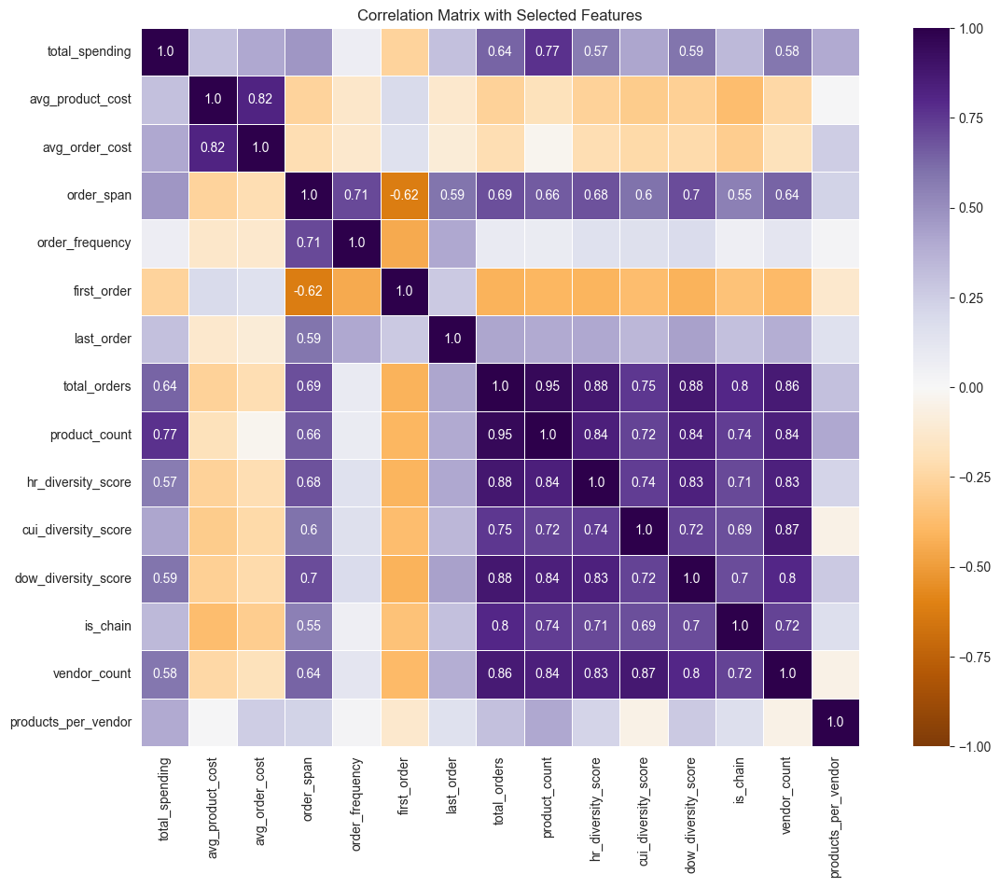

In [192]:
corr = perspective_num_feature_selection[economic_value_features+loyalty_features+preference_features].corr(method="pearson").round(2)

mask_annot = np.absolute(corr.values) >= 0.5  
annot = np.where(mask_annot, corr.values, np.full(corr.shape, ""))

# Plot heatmap
fig = plt.figure(figsize=(15, 10))
sns.heatmap(data=corr, annot=annot, cmap='PuOr', fmt='s',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=0.5)

plt.title('Correlation Matrix with Selected Features')
plt.show()

### Economic value features

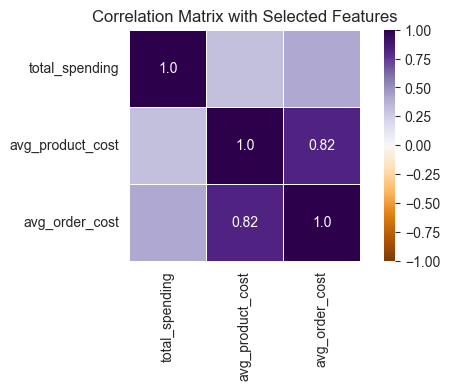

In [193]:
corr = perspective_num_feature_selection[economic_value_features].corr(method="pearson").round(2)

mask_annot = np.absolute(corr.values) >= 0.5  
annot = np.where(mask_annot, corr.values, np.full(corr.shape, ""))

# Plot heatmap
fig = plt.figure(figsize=(6, 3))
sns.heatmap(data=corr, annot=annot, cmap='PuOr', fmt='s',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=0.5)

plt.title('Correlation Matrix with Selected Features')
plt.show()

In [194]:
economic_value_features.remove('avg_product_cost')

We decided to remove average product cost, because it is highly correlated with average order cost. Between both features, we believe that customers' orders expenditure is more relevant rather than their expenditure by the product.

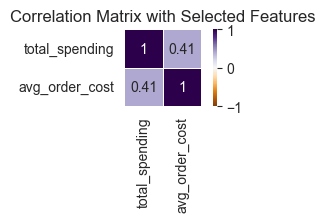

In [195]:
corr = perspective_num_feature_selection[economic_value_features].corr(method="pearson").round(2)

fig = plt.figure(figsize=(3, 1))
sns.heatmap(data=corr, annot=True, cmap='PuOr',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=0.5)

plt.title('Correlation Matrix with Selected Features')
plt.show()

Clustering with only two variables may lead to poor results, so we will try to find another solution.

### Loyalty features

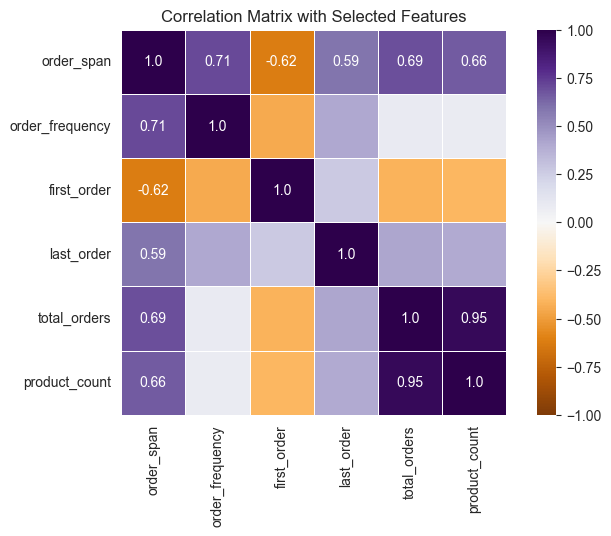

In [196]:
corr = perspective_num_feature_selection[loyalty_features].corr(method="pearson").round(2)

mask_annot = np.absolute(corr.values) >= 0.5  
annot = np.where(mask_annot, corr.values, np.full(corr.shape, ""))

# Plot heatmap
fig = plt.figure(figsize=(8, 5))
sns.heatmap(data=corr, annot=annot, cmap='PuOr', fmt='s',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=0.5)

plt.title('Correlation Matrix with Selected Features')
plt.show()

Product count and total orders are way over our defined treshold. We will drop product count, because we believe that total orders is more relevant to the analysis

Besides that, and, based on our EDA, we conclude that we can retrieve every information from first order and last order with only order span. Therefore, we will drop both first and last order.

As expected, order frequency and order span have a relevant correlation, since they showed in the EDA to reveal redundant insights. Order frequency is not very correlated with any other variable, this often indicates that it is not very relevant, therefore we will remove order frequency.

In [197]:
loyalty_features.remove('last_order')
loyalty_features.remove('first_order')
loyalty_features.remove('product_count')
loyalty_features.remove('order_frequency')

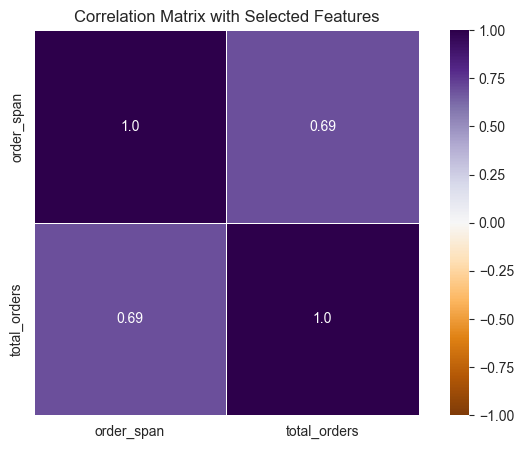

In [198]:
corr = perspective_num_feature_selection[loyalty_features].corr(method="pearson").round(2)

mask_annot = np.absolute(corr.values) >= 0.5  
annot = np.where(mask_annot, corr.values, np.full(corr.shape, ""))

# Plot heatmap
fig = plt.figure(figsize=(8, 5))
sns.heatmap(data=corr, annot=annot, cmap='PuOr', fmt='s',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=0.5)

plt.title('Correlation Matrix with Selected Features')
plt.show()

Only having 3 features, we will merge this perspective with the value perspective.

### Merged perspective: Value and Loyalty Features
(Economic Value + Loyalty Features)

In [199]:
value_loyalty_feature = economic_value_features+loyalty_features

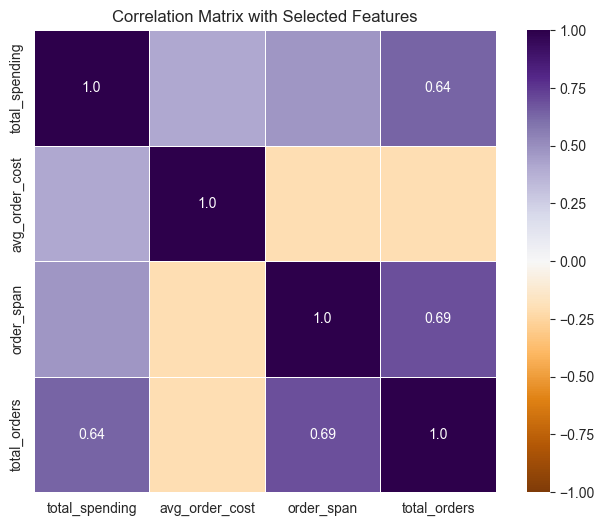

In [200]:
corr = perspective_num_feature_selection[value_loyalty_feature].corr(method="pearson").round(2)

mask_annot = np.absolute(corr.values) >= 0.5  
annot = np.where(mask_annot, corr.values, np.full(corr.shape, ""))

# Plot heatmap
fig = plt.figure(figsize=(8, 6))
sns.heatmap(data=corr, annot=annot, cmap='PuOr', fmt='s',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=0.5)

plt.title('Correlation Matrix with Selected Features')
plt.show()

### Preference features

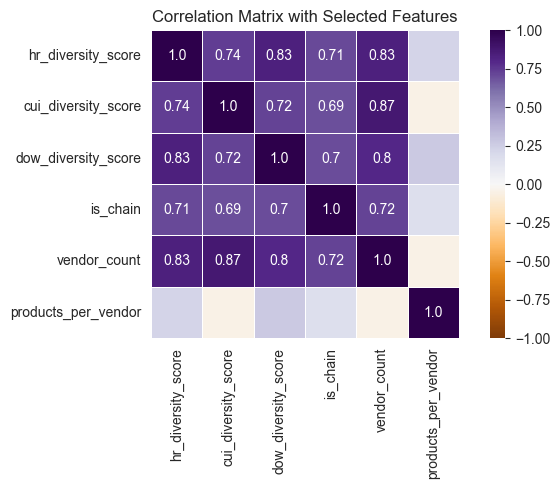

In [201]:
corr = perspective_num_feature_selection[preference_features].corr(method="pearson").round(2)

mask_annot = np.absolute(corr.values) >= 0.5  
annot = np.where(mask_annot, corr.values, np.full(corr.shape, ""))

# Plot heatmap
fig = plt.figure(figsize=(8, 4))
sns.heatmap(data=corr, annot=annot, cmap='PuOr', fmt='s',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=0.5)

plt.title('Correlation Matrix with Selected Features')
plt.show()

When analyzing the correlation matrix for the Preference features, we can highlight highly correlated variables. For instance, vendor count has a correation of 0.8 or higher with 3 other variables, so we will drop it, according to our defined treshold of 0.8 to avoid multicolinearity.<br>

Another variable that we are going to drop is products per vendor, due to the fact that it is not correlated with any other variable of this perspective.<br>

Then, we have the correlation of dow diversity score and hr diversity score. We  will keep dow diversity score, but may test solutions for hr diversity score as well, since it is a dubious decision

In [202]:
preference_features.remove('vendor_count')
preference_features.remove('products_per_vendor')

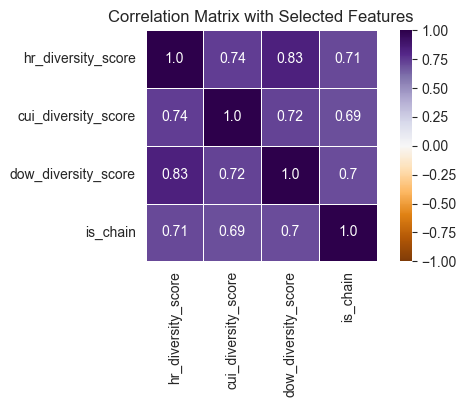

In [203]:
corr = perspective_num_feature_selection[preference_features].corr(method="pearson").round(2)

mask_annot = np.absolute(corr.values) >= 0.5  
annot = np.where(mask_annot, corr.values, np.full(corr.shape, ""))

fig = plt.figure(figsize=(6, 3))
sns.heatmap(data=corr, annot=annot, cmap='PuOr', fmt='s',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=0.5)

plt.title('Correlation Matrix with Selected Features')
plt.show()

### Time Features

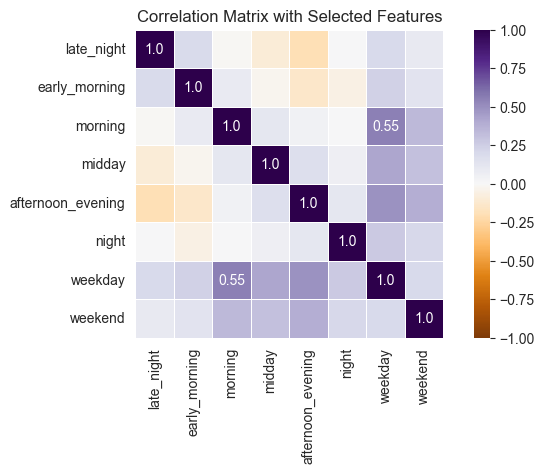

In [204]:
corr = perspective_num_feature_selection[time_features].corr(method="pearson").round(2)

mask_annot = np.absolute(corr.values) >= 0.5  
annot = np.where(mask_annot, corr.values, np.full(corr.shape, ""))

fig = plt.figure(figsize=(8, 4))
sns.heatmap(data=corr, annot=annot, cmap='PuOr', fmt='s',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=0.5)

plt.title('Correlation Matrix with Selected Features')
plt.show()

As stated in the EDA customers are not well segmented based on the day of the week they order, so for now, we will keep this perspective only with the time of day features, and possibly including dow_diversity_score and hr_diversity_score.

In [205]:
time_features.remove('weekday')
time_features.remove('weekend')

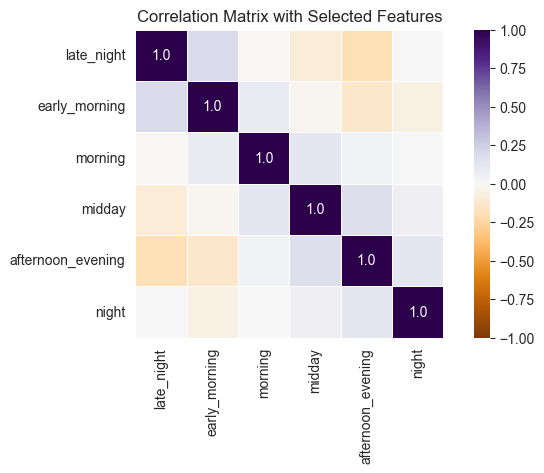

In [206]:
corr = perspective_num_feature_selection[time_features].corr(method="pearson").round(2)

mask_annot = np.absolute(corr.values) >= 0.5  
annot = np.where(mask_annot, corr.values, np.full(corr.shape, ""))

fig = plt.figure(figsize=(8, 4))
sns.heatmap(data=corr, annot=annot, cmap='PuOr', fmt='s',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=0.5)

plt.title('Correlation Matrix with Selected Features')
plt.show()